In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn import datasets, model_selection, preprocessing, metrics, svm, linear_model

df = pd.read_csv('batelada.csv')



In [2]:
df.head()

,TimeStamp,G100CP2_FT420202,G100CP2_FT420201,G100CP2_PV110001,G100CP2_PV110002,G100CP2_PV110007,G100CP2_LT110003,G100CP2_LIC110003_MV,G100CP2_PV110007.1,G100CP2_FIC420201_SP,G100CP2_FIC420202_SP,G100CP2_FQ110003,G100CPU_M1WT100010,G100CP2_DT420201,G100CP2_PV110003,G100CP2_PV110017,G100CP2_SET110093,G100CP2_SET110094
0,8/1/2024 9:41,"4,598.75",0,0,0,0,0.17,25.0,0,0,"26,983.12",0,"191,617.00","1,434.57",24.86,0,71.3,37.0
1,8/1/2024 9:42,"7,659.38","9,053.50",93.19,111.51,0,0.23,25.0,0,0,"8,394.12",0,"191,320.00","1,424.51",45.52,204.7,71.3,37.0
2,8/1/2024 9:43,"8,475.00","9,154.00",244.26,245.96,0,2.04,25.0,0,0,"8,488.25",0,"190,963.00","1,426.98",49.83,490.22,71.3,37.0
3,8/1/2024 9:44,"8,493.75","9,098.88",393.53,384.43,0,4.59,25.0,0,0,"8,433.38",0,"190,726.00","1,435.49",50.59,777.96,71.3,37.0
4,8/1/2024 9:45,"8,388.75","9,072.00",550.01,529.3,0,7.41,25.0,0,0,"8,410.25",0,"190,488.00","1,435.17",50.96,"1,079.31",71.3,37.0


In [3]:
df.describe()


,G100CP2_LT110003,G100CP2_LIC110003_MV,G100CP2_PV110003,G100CP2_SET110093,G100CP2_SET110094
count,454.000000,454.000000,454.000000,4.540000e+02,454.000000
mean,53.666520,44.187930,54.164273,7.130000e+01,37.942731
std,17.832719,8.129239,4.942724,5.121551e-13,1.030775
min,0.170000,25.000000,24.860000,7.130000e+01,35.400000
25%,52.862500,43.365000,53.020000,7.130000e+01,37.000000
50%,58.385000,45.655000,53.370000,7.130000e+01,37.000000
75%,64.970000,47.855000,53.757500,7.130000e+01,39.000000
max,68.630000,59.790000,99.930000,7.130000e+01,39.000000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 454 entries, 0 to 453
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   TimeStamp             454 non-null    object 
 1   G100CP2_FT420202      454 non-null    object 
 2   G100CP2_FT420201      454 non-null    object 
 3   G100CP2_PV110001      454 non-null    object 
 4   G100CP2_PV110002      454 non-null    object 
 5   G100CP2_PV110007      454 non-null    object 
 6   G100CP2_LT110003      454 non-null    float64
 7   G100CP2_LIC110003_MV  454 non-null    float64
 8   G100CP2_PV110007.1    454 non-null    object 
 9   G100CP2_FIC420201_SP  454 non-null    object 
 10  G100CP2_FIC420202_SP  454 non-null    object 
 11  G100CP2_FQ110003      454 non-null    object 
 12  G100CPU_M1WT100010    454 non-null    object 
 13  G100CP2_DT420201      454 non-null    object 
 14  G100CP2_PV110003      454 non-null    float64
 15  G100CP2_PV110017      4

In [5]:
df.describe()

,G100CP2_LT110003,G100CP2_LIC110003_MV,G100CP2_PV110003,G100CP2_SET110093,G100CP2_SET110094
count,454.000000,454.000000,454.000000,4.540000e+02,454.000000
mean,53.666520,44.187930,54.164273,7.130000e+01,37.942731
std,17.832719,8.129239,4.942724,5.121551e-13,1.030775
min,0.170000,25.000000,24.860000,7.130000e+01,35.400000
25%,52.862500,43.365000,53.020000,7.130000e+01,37.000000
50%,58.385000,45.655000,53.370000,7.130000e+01,37.000000
75%,64.970000,47.855000,53.757500,7.130000e+01,39.000000
max,68.630000,59.790000,99.930000,7.130000e+01,39.000000


In [6]:
df['TimeStamp'] = pd.to_datetime(df['TimeStamp'])

In [7]:
df.describe()

,TimeStamp,G100CP2_LT110003,G100CP2_LIC110003_MV,G100CP2_PV110003,G100CP2_SET110093,G100CP2_SET110094
count,454,454.000000,454.000000,454.000000,4.540000e+02,454.000000
mean,2024-08-01 13:27:29.999999744,53.666520,44.187930,54.164273,7.130000e+01,37.942731
min,2024-08-01 09:41:00,0.170000,25.000000,24.860000,7.130000e+01,35.400000
25%,2024-08-01 11:34:15,52.862500,43.365000,53.020000,7.130000e+01,37.000000
50%,2024-08-01 13:27:30,58.385000,45.655000,53.370000,7.130000e+01,37.000000
75%,2024-08-01 15:20:45,64.970000,47.855000,53.757500,7.130000e+01,39.000000
max,2024-08-01 17:14:00,68.630000,59.790000,99.930000,7.130000e+01,39.000000
std,NaN,17.832719,8.129239,4.942724,5.121551e-13,1.030775


In [8]:
df = df.replace(['<No Data>', '<Bad Data>'], np.nan)

In [9]:
# Função lambda para remover a vírgula
remove_comma = lambda x: float(str(x).replace(',', '')) if isinstance(x, str) else x

# Aplique a função lambda a todas as colunas do tipo 'object'
for column in df.select_dtypes(include=['object']).columns:
    df[column] = df[column].apply(remove_comma)


In [10]:
# Dicionário mapeando os códigos para os novos nomes
column_mapping = {
    'G100CP2_FT420202': 'Transmissor de Vazao de H2O',
    'G100CP2_FT420201': 'Transmissor de Vazao FS',
    'G100CP2_PV110001': 'TOTALIZADO BATELADA FS',
    'G100CP2_PV110002': 'TOTALIZADO BATELADA AGUA',
    'G100CP2_PV110007': 'VAZAO DE MOSTO CALCULADA',
    'G100CP2_LT110003': 'Transmissor de Nivel TANQUE DE PRE AQUECIMENTO MOSTO ESTERILIZADOR 2',
    'G100CP2_LIC110003_MV': 'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO',
    'G100CP2_PV110007.1': 'VAZAO DE MOSTO CALCULADA',
    'G100CP2_FIC420201_SP': 'Controlador Indicador de Vazao SP ALIMENTACAO DE FS',
    'G100CP2_FIC420202_SP': 'Controlador Indicador de Vazao SP AGUARDANDO DESCRIÇAO',
    'G100CP2_FQ110003': 'Totalizador de Vazao FT110003 - TOTALIZADO',
    'G100CPU_M1WT100010': 'PESO PRODUTO TANQUE WT-01',
    'G100CP2_DT420201': 'DENSIDADE SAIDA DE FS',
    'G100CP2_PV110003': 'PORCENTAGEM DE FS RELACAO MOSTO',
    'G100CP2_PV110017': 'TOTALIZADO VAZAO DE FS E AGUA'
}

# Renomeando as colunas no DataFrame
df.rename(columns=column_mapping, inplace=True)


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 454 entries, 0 to 453
Data columns (total 18 columns):
 #   Column                                                                Non-Null Count  Dtype         
---  ------                                                                --------------  -----         
 0   TimeStamp                                                             454 non-null    datetime64[ns]
 1   Transmissor de Vazao de H2O                                           454 non-null    float64       
 2   Transmissor de Vazao FS                                               454 non-null    float64       
 3   TOTALIZADO BATELADA FS                                                454 non-null    float64       
 4   TOTALIZADO BATELADA AGUA                                              454 non-null    float64       
 5   VAZAO DE MOSTO CALCULADA                                              454 non-null    float64       
 6   Transmissor de Nivel TANQUE DE PRE AQUECIM

In [12]:
df.isnull().sum()

TimeStamp                                                               0
Transmissor de Vazao de H2O                                             0
Transmissor de Vazao FS                                                 0
TOTALIZADO BATELADA FS                                                  0
TOTALIZADO BATELADA AGUA                                                0
VAZAO DE MOSTO CALCULADA                                                0
Transmissor de Nivel TANQUE DE PRE AQUECIMENTO MOSTO ESTERILIZADOR 2    0
Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO      0
VAZAO DE MOSTO CALCULADA                                                0
Controlador Indicador de Vazao SP ALIMENTACAO DE FS                     0
Controlador Indicador de Vazao SP AGUARDANDO DESCRIÇAO                  0
Totalizador de Vazao FT110003 - TOTALIZADO                              0
PESO PRODUTO TANQUE WT-01                                               0
DENSIDADE SAIDA DE FS                 

In [13]:
df = df.fillna(df.mean())

In [14]:
df.isnull().sum()

TimeStamp                                                               0
Transmissor de Vazao de H2O                                             0
Transmissor de Vazao FS                                                 0
TOTALIZADO BATELADA FS                                                  0
TOTALIZADO BATELADA AGUA                                                0
VAZAO DE MOSTO CALCULADA                                                0
Transmissor de Nivel TANQUE DE PRE AQUECIMENTO MOSTO ESTERILIZADOR 2    0
Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO      0
VAZAO DE MOSTO CALCULADA                                                0
Controlador Indicador de Vazao SP ALIMENTACAO DE FS                     0
Controlador Indicador de Vazao SP AGUARDANDO DESCRIÇAO                  0
Totalizador de Vazao FT110003 - TOTALIZADO                              0
PESO PRODUTO TANQUE WT-01                                               0
DENSIDADE SAIDA DE FS                 

In [15]:
df.shape

(454, 18)

In [16]:
df.describe()

,TimeStamp,Transmissor de Vazao de H2O,Transmissor de Vazao FS,TOTALIZADO BATELADA FS,TOTALIZADO BATELADA AGUA,VAZAO DE MOSTO CALCULADA,Transmissor de Nivel TANQUE DE PRE AQUECIMENTO MOSTO ESTERILIZADOR 2,Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO,VAZAO DE MOSTO CALCULADA,Controlador Indicador de Vazao SP ALIMENTACAO DE FS,Controlador Indicador de Vazao SP AGUARDANDO DESCRIÇAO,Totalizador de Vazao FT110003 - TOTALIZADO,PESO PRODUTO TANQUE WT-01,DENSIDADE SAIDA DE FS,PORCENTAGEM DE FS RELACAO MOSTO,TOTALIZADO VAZAO DE FS E AGUA,G100CP2_SET110093,G100CP2_SET110094
count,454,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,4.540000e+02,454.000000
mean,2024-08-01 13:27:29.999999744,16582.479273,16696.026476,68157.633128,60329.537599,34673.508612,53.666520,44.187930,34673.508612,16308.472885,19279.094251,127706.461476,151546.522026,1427.216916,54.164273,128487.170727,7.130000e+01,37.942731
min,2024-08-01 09:41:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.170000,25.000000,0.000000,0.000000,8255.120000,0.000000,110957.000000,1424.510000,24.860000,0.000000,7.130000e+01,35.400000
25%,2024-08-01 11:34:15,16636.560000,18924.215000,30662.915000,25732.822500,36499.945000,52.862500,43.365000,36499.945000,18915.090000,17353.062500,53219.567500,131389.500000,1426.120000,53.020000,56395.735000,7.130000e+01,37.000000
50%,2024-08-01 13:27:30,17827.690000,20035.815000,68596.455000,60897.905000,38086.510000,58.385000,45.655000,38086.510000,20046.370000,18205.440000,128648.850000,152118.500000,1426.810000,53.370000,129494.355000,7.130000e+01,37.000000
75%,2024-08-01 15:20:45,18815.905000,20951.875000,108212.260000,94096.252500,40118.130000,64.970000,47.855000,40118.130000,20956.097500,19469.812500,204148.252500,171808.250000,1428.092500,53.757500,202308.520000,7.130000e+01,39.000000
max,2024-08-01 17:14:00,38153.120000,22213.620000,126317.000000,122541.990000,44492.590000,68.630000,59.790000,44492.590000,22211.250000,39975.000000,246530.840000,191617.000000,1439.970000,99.930000,248859.000000,7.130000e+01,39.000000
std,NaN,6904.763138,7614.655888,42111.118953,38787.401114,11732.154357,17.832719,8.129239,11732.154357,8215.448804,4983.304545,83236.063049,23084.300876,1.620558,4.942724,80838.072452,5.121551e-13,1.030775


# 1. Distribuição das Variáveis

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


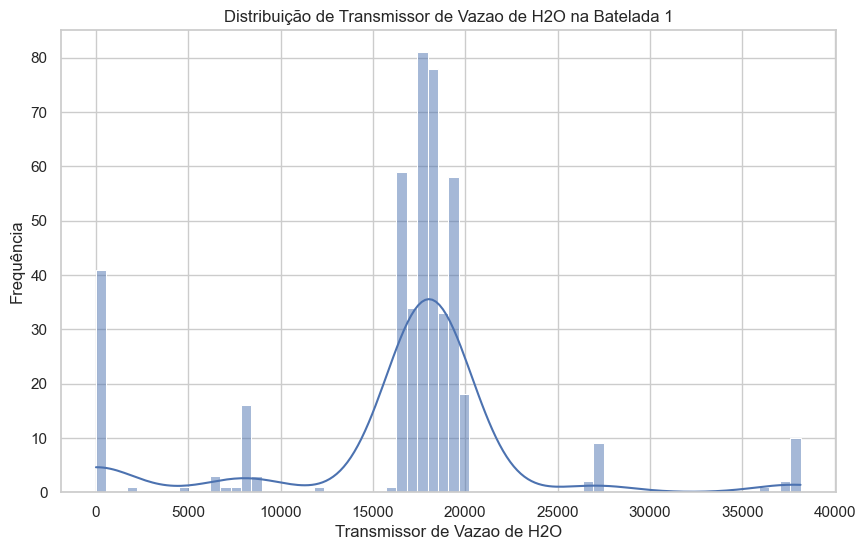

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


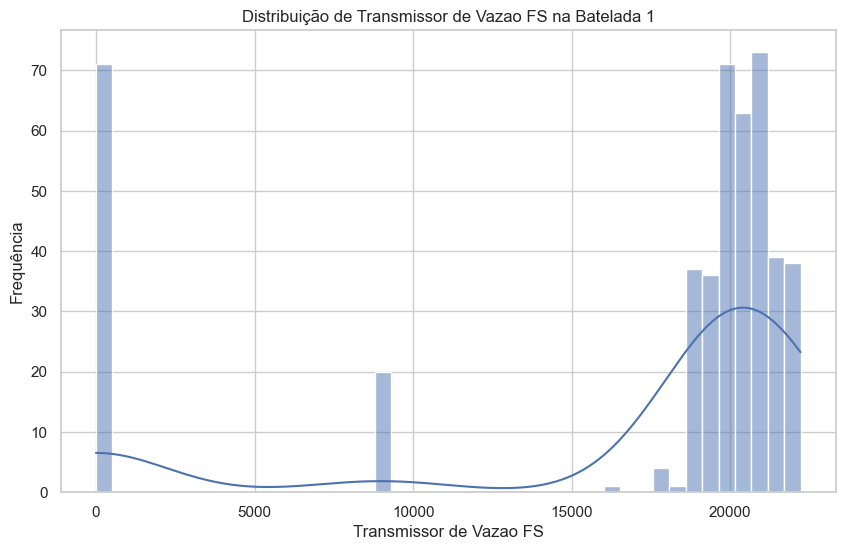

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


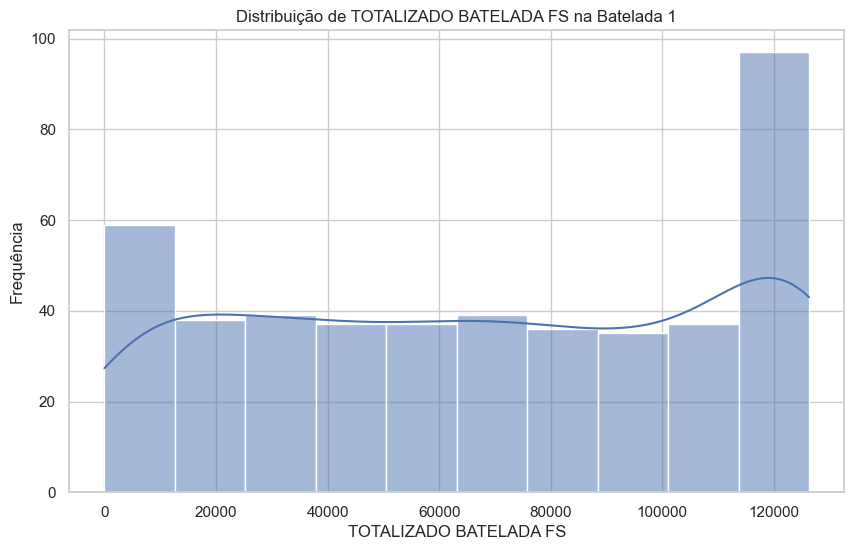

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


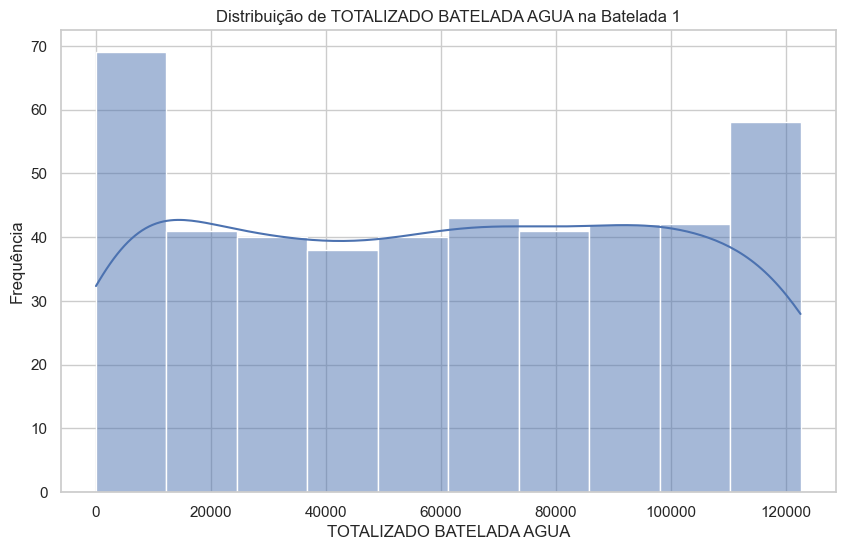

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


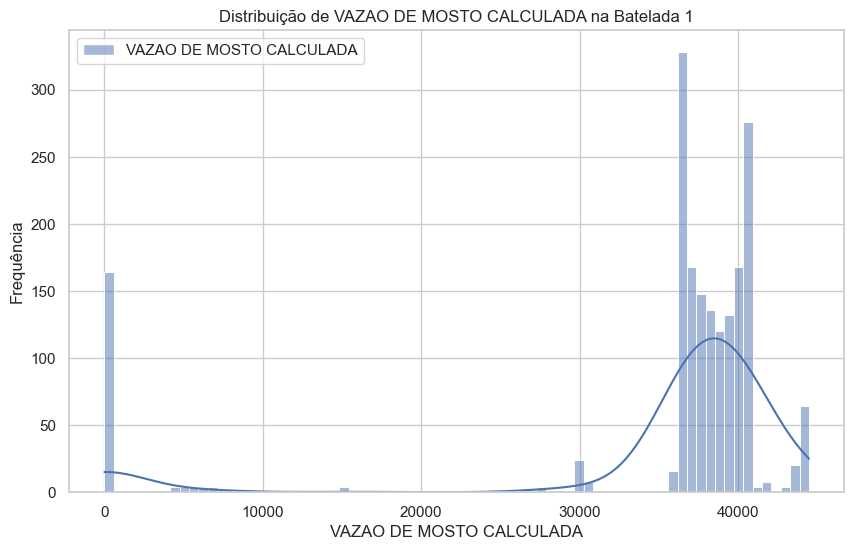

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


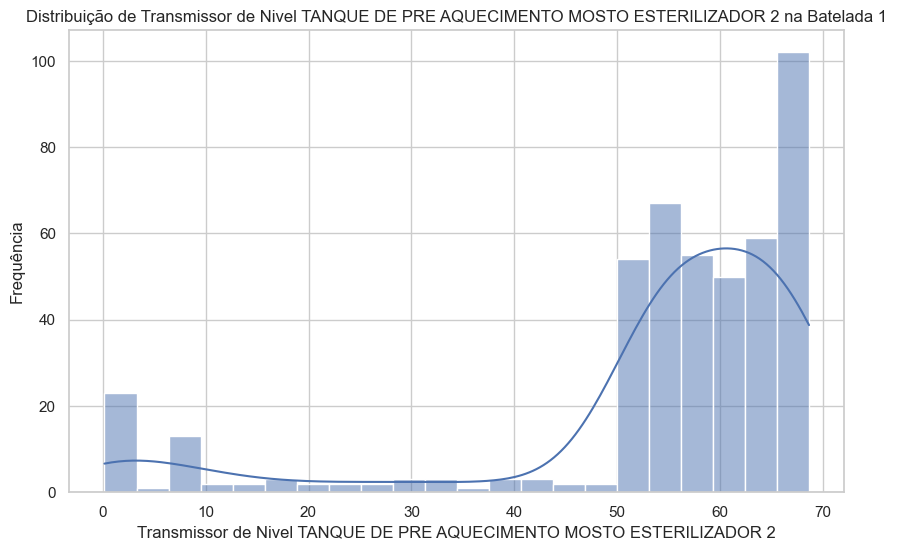

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


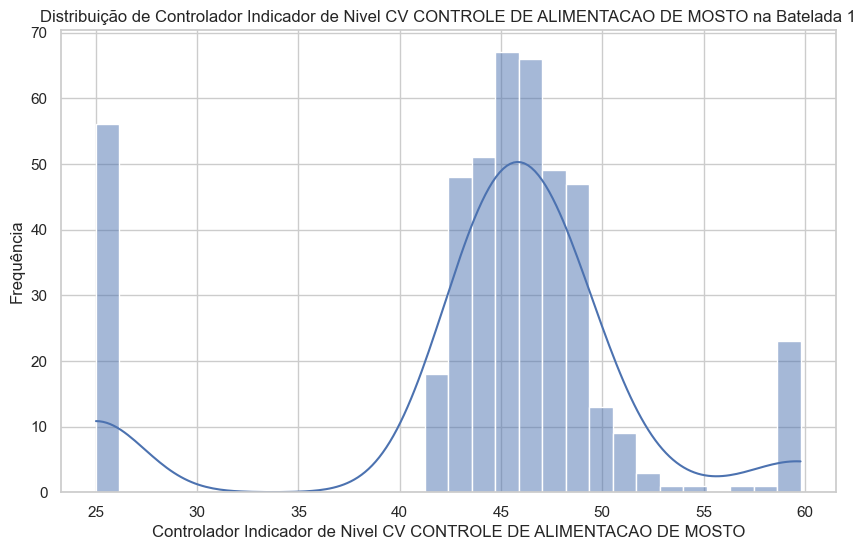

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


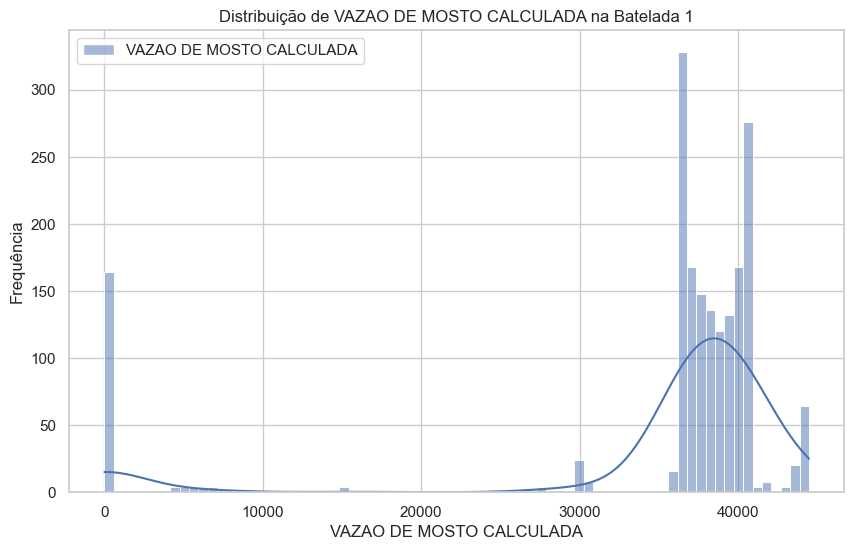

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


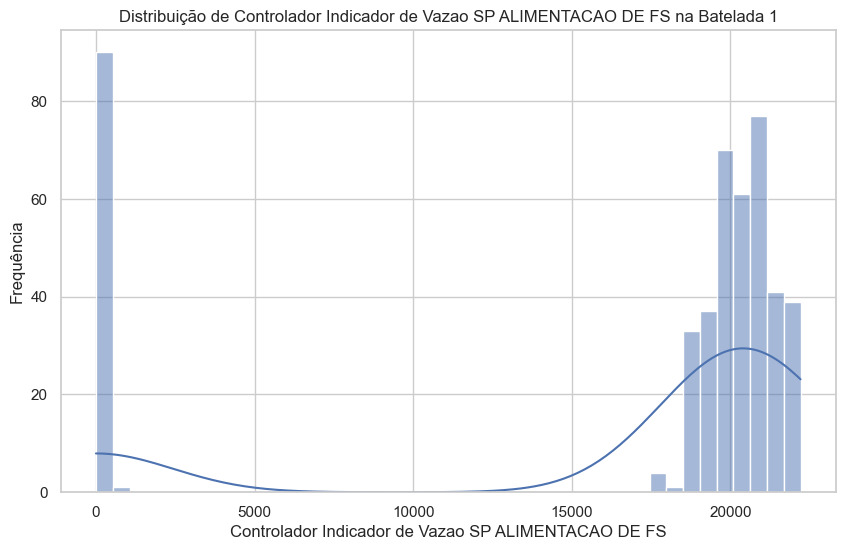

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


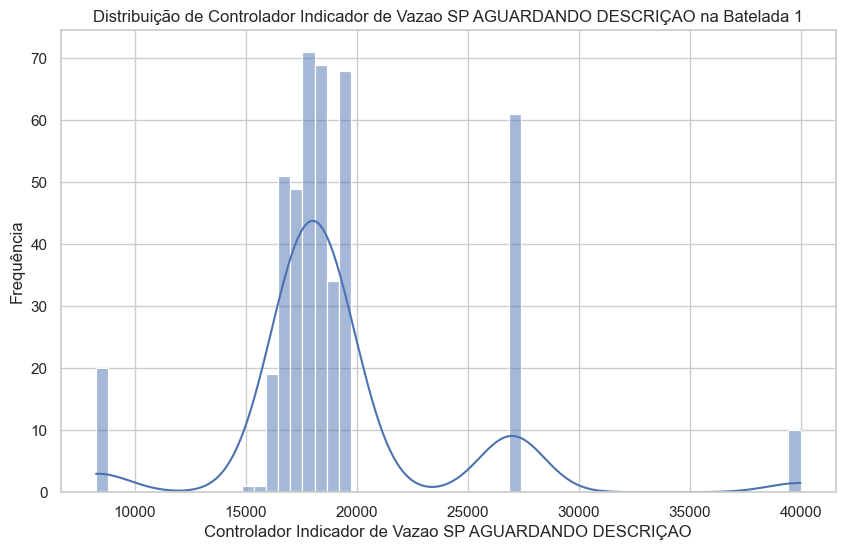

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


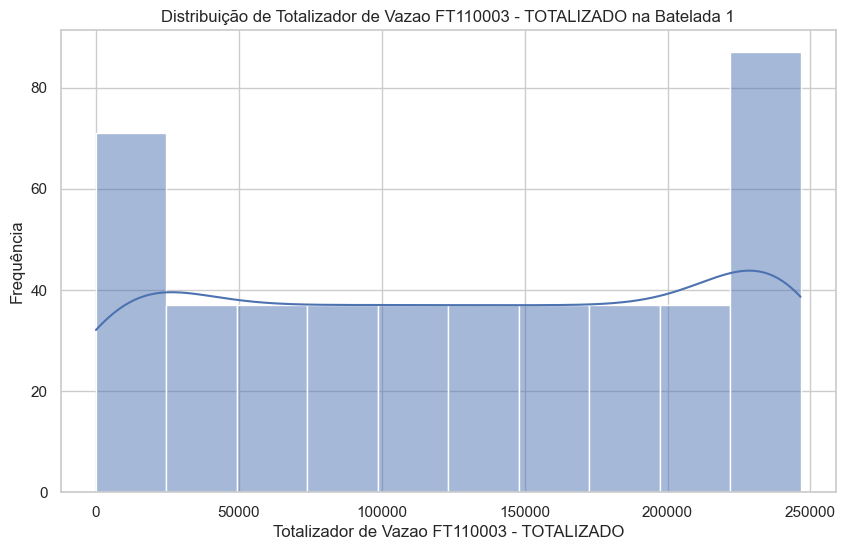

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


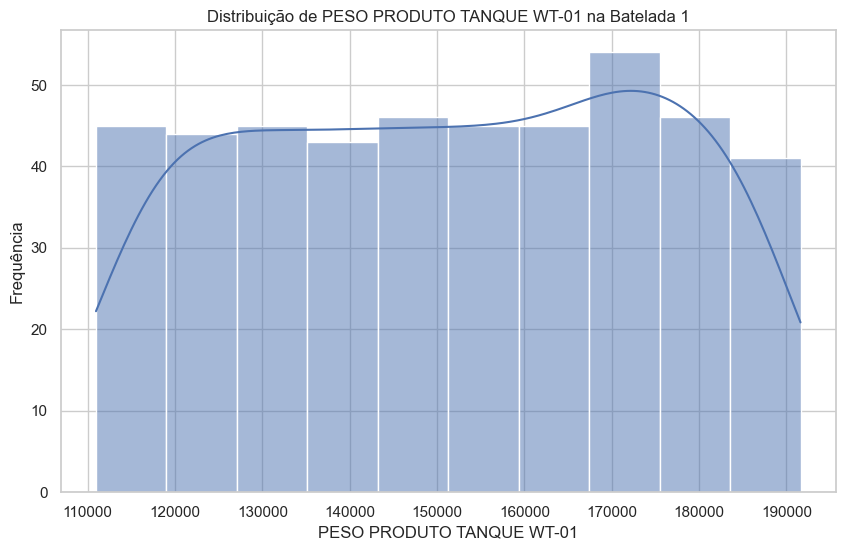

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


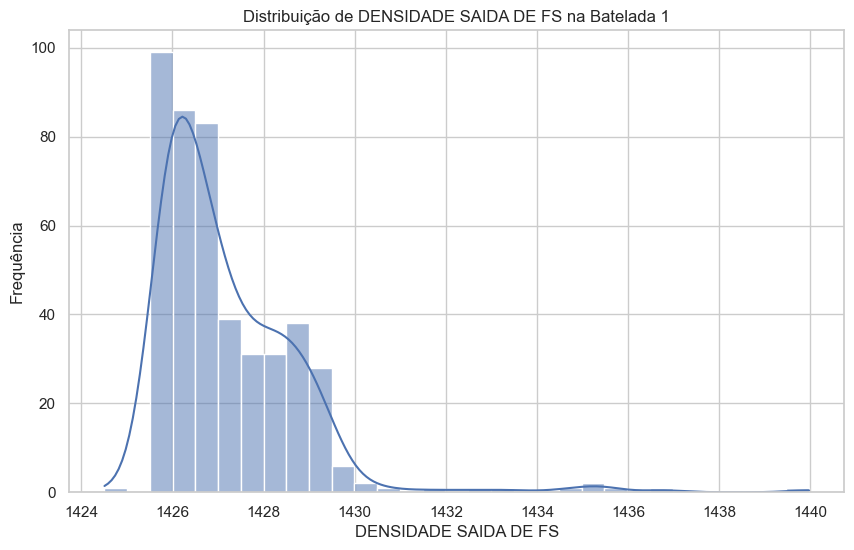

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


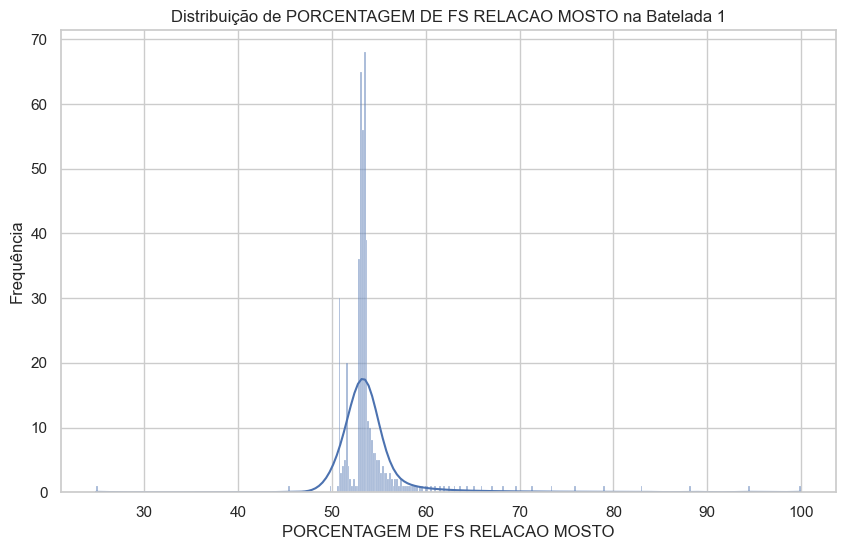

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


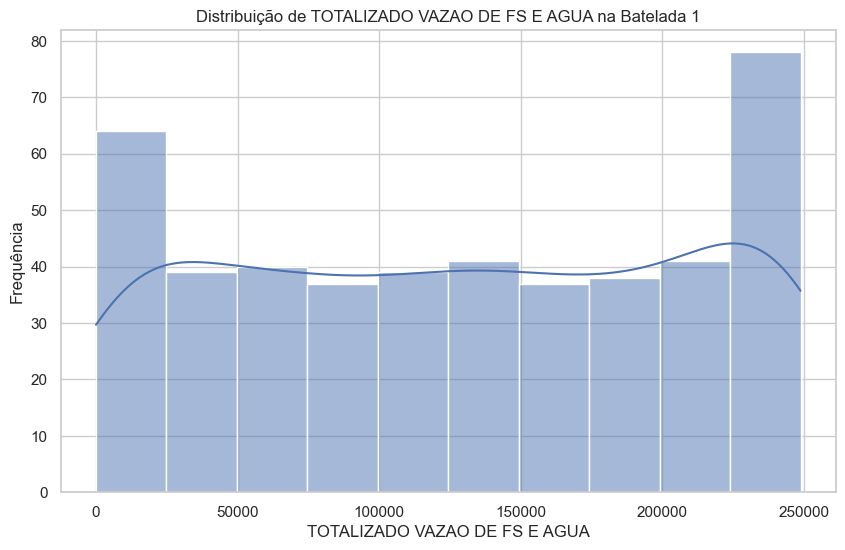

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


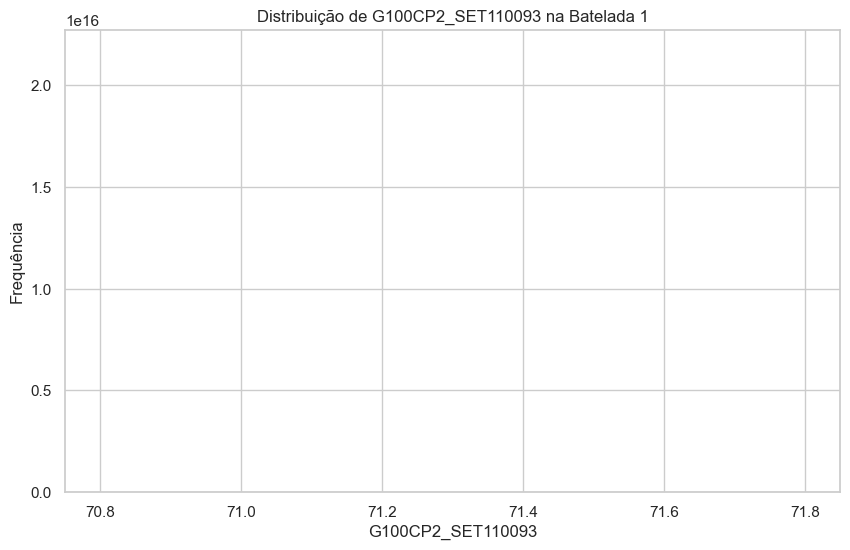

C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


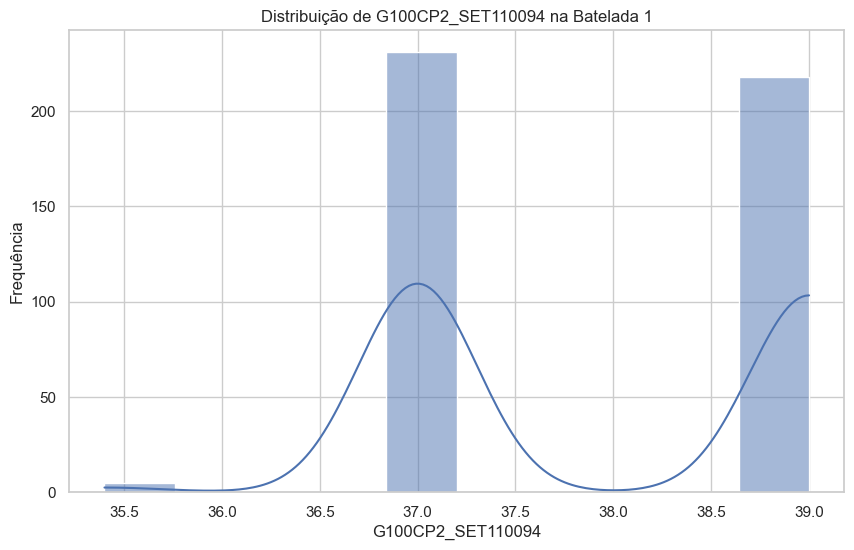

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filtrar os dados da batelada 1
df_batelada1 = df

# Definir o estilo dos gráficos
sns.set(style="whitegrid")

# Plotar histogramas para cada coluna numérica
for column in df_batelada1.select_dtypes(include=['float64', 'int64']).columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(df_batelada1[column], kde=True)
    plt.title(f'Distribuição de {column} na Batelada 1')
    plt.xlabel(column)
    plt.ylabel('Frequência')
    plt.show()


## 1.1 Histograma Q-Qplot/ Testes de Normalidade

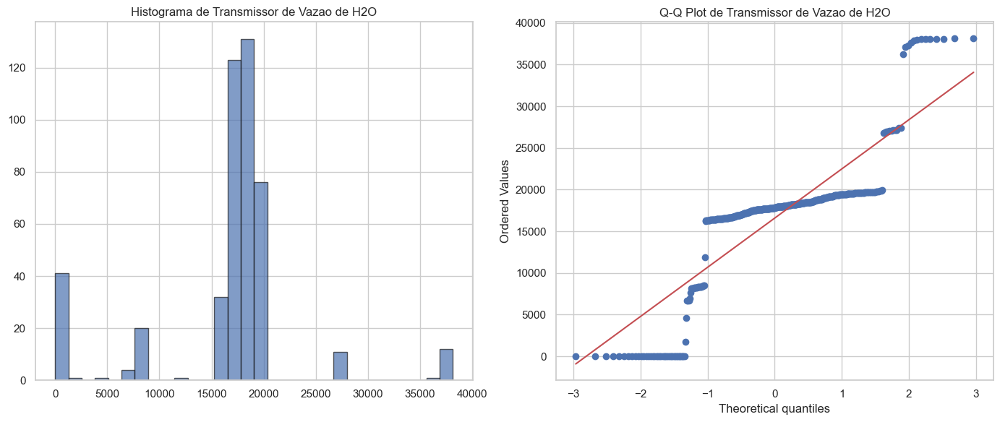


Testes de Normalidade para a coluna: Transmissor de Vazao de H2O
Shapiro-Wilk Test: Estatística=0.7251, p-valor=0.0000
Anderson-Darling Test: Estatística=57.1488, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.3304, p-valor=0.0000


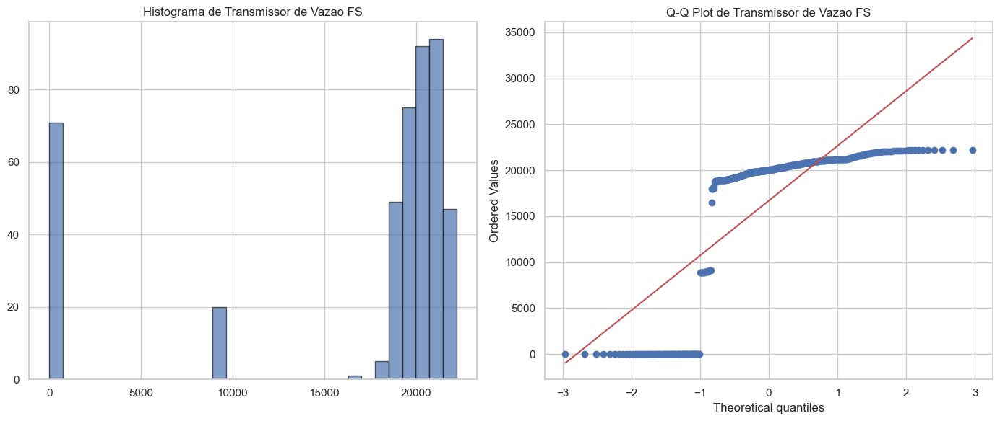


Testes de Normalidade para a coluna: Transmissor de Vazao FS
Shapiro-Wilk Test: Estatística=0.6059, p-valor=0.0000
Anderson-Darling Test: Estatística=83.4533, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.3946, p-valor=0.0000


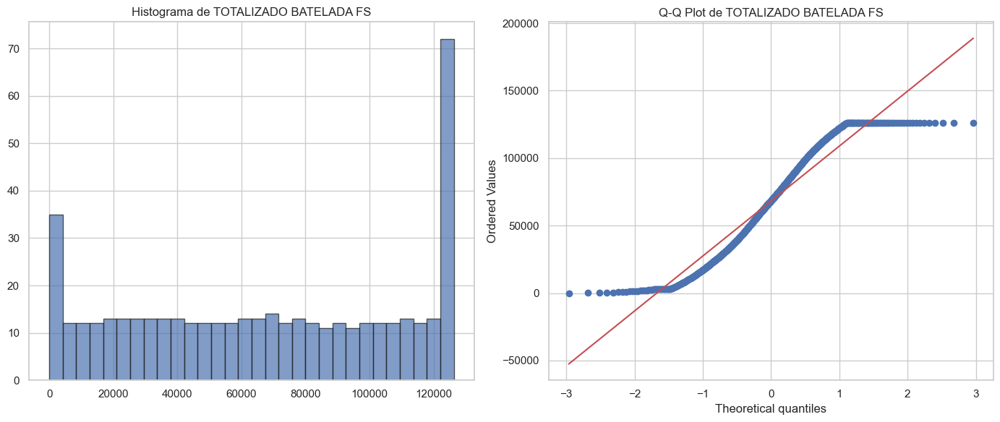


Testes de Normalidade para a coluna: TOTALIZADO BATELADA FS
Shapiro-Wilk Test: Estatística=0.9231, p-valor=0.0000
Anderson-Darling Test: Estatística=9.0493, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.0836, p-valor=0.0033


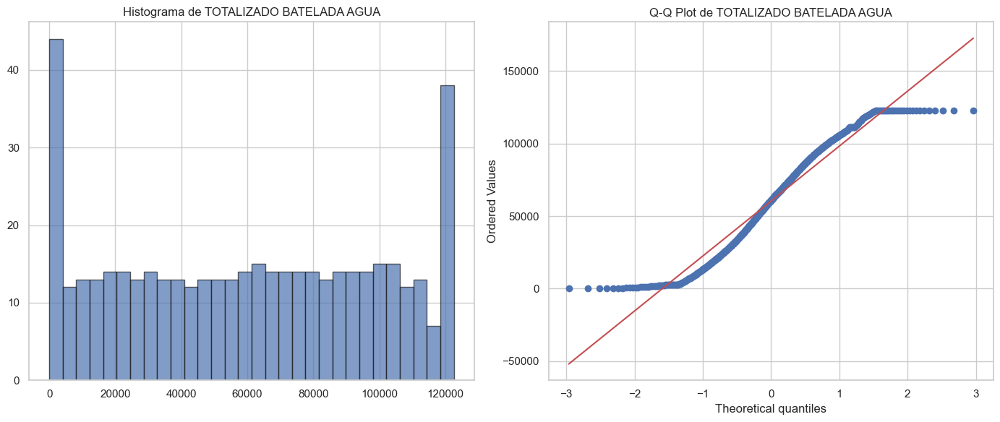


Testes de Normalidade para a coluna: TOTALIZADO BATELADA AGUA
Shapiro-Wilk Test: Estatística=0.9419, p-valor=0.0000
Anderson-Darling Test: Estatística=6.2843, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.0665, p-valor=0.0345


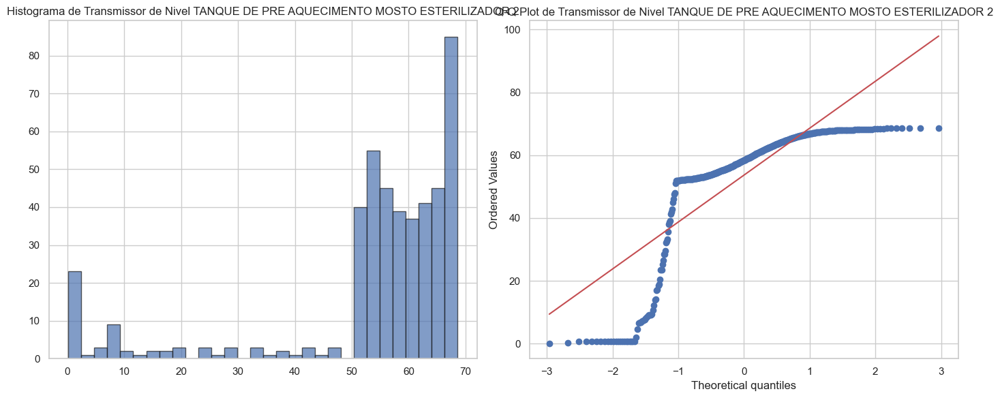


Testes de Normalidade para a coluna: Transmissor de Nivel TANQUE DE PRE AQUECIMENTO MOSTO ESTERILIZADOR 2
Shapiro-Wilk Test: Estatística=0.6938, p-valor=0.0000
Anderson-Darling Test: Estatística=50.2228, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.3105, p-valor=0.0000


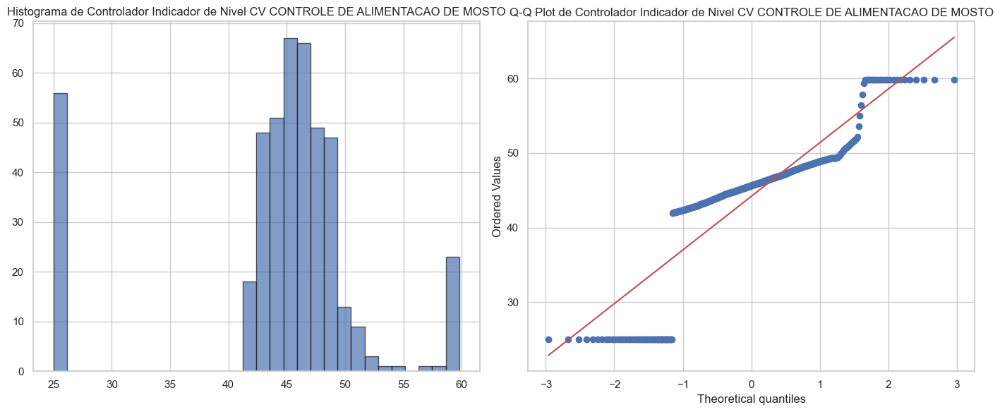


Testes de Normalidade para a coluna: Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO
Shapiro-Wilk Test: Estatística=0.7754, p-valor=0.0000
Anderson-Darling Test: Estatística=43.1322, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.2687, p-valor=0.0000


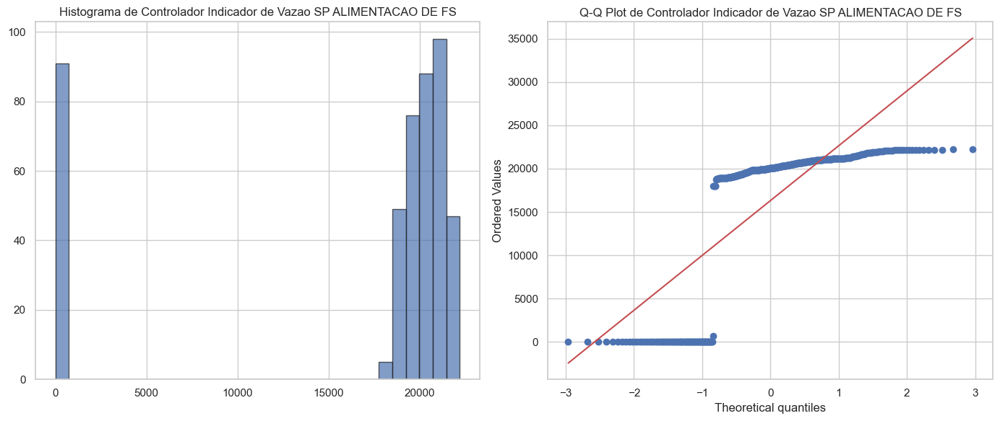


Testes de Normalidade para a coluna: Controlador Indicador de Vazao SP ALIMENTACAO DE FS
Shapiro-Wilk Test: Estatística=0.5860, p-valor=0.0000
Anderson-Darling Test: Estatística=91.1942, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.4055, p-valor=0.0000


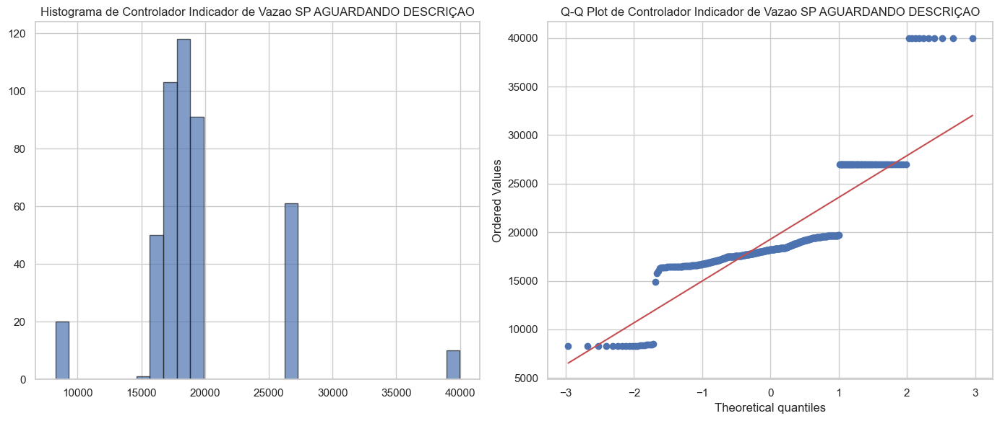


Testes de Normalidade para a coluna: Controlador Indicador de Vazao SP AGUARDANDO DESCRIÇAO
Shapiro-Wilk Test: Estatística=0.7399, p-valor=0.0000
Anderson-Darling Test: Estatística=46.4738, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.3080, p-valor=0.0000


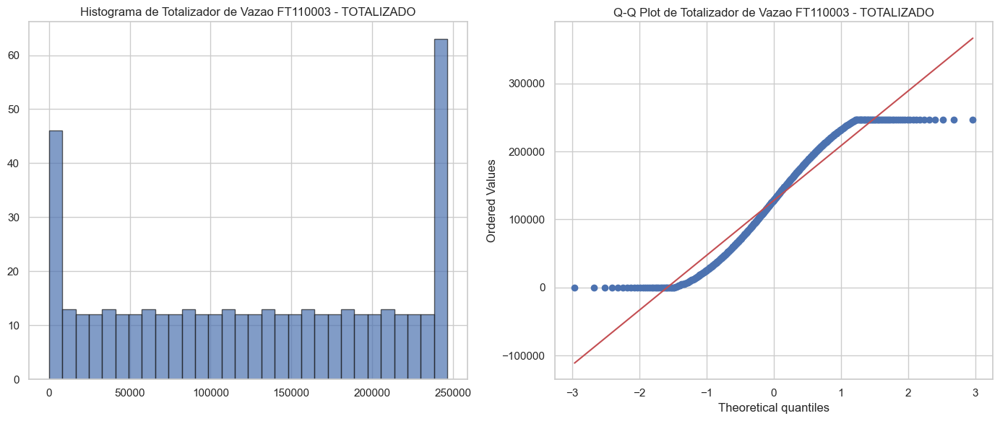


Testes de Normalidade para a coluna: Totalizador de Vazao FT110003 - TOTALIZADO
Shapiro-Wilk Test: Estatística=0.9250, p-valor=0.0000
Anderson-Darling Test: Estatística=8.5478, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.0767, p-valor=0.0090


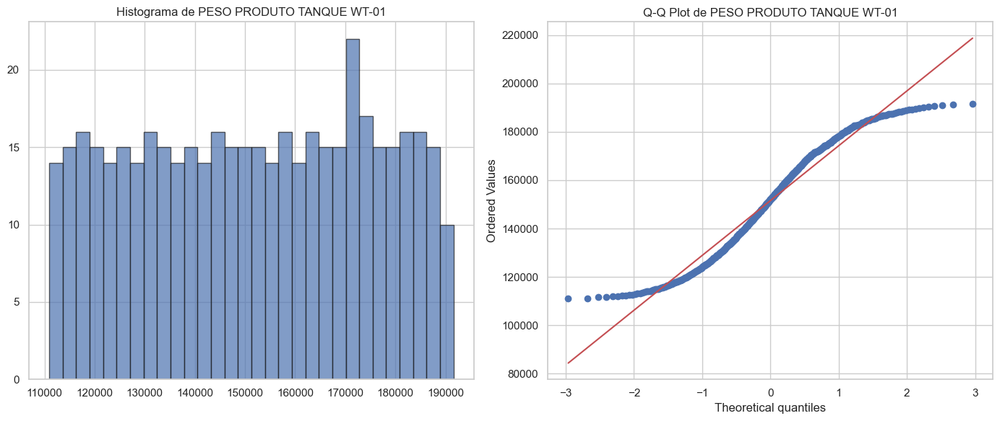


Testes de Normalidade para a coluna: PESO PRODUTO TANQUE WT-01
Shapiro-Wilk Test: Estatística=0.9539, p-valor=0.0000
Anderson-Darling Test: Estatística=5.3457, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.0707, p-valor=0.0204


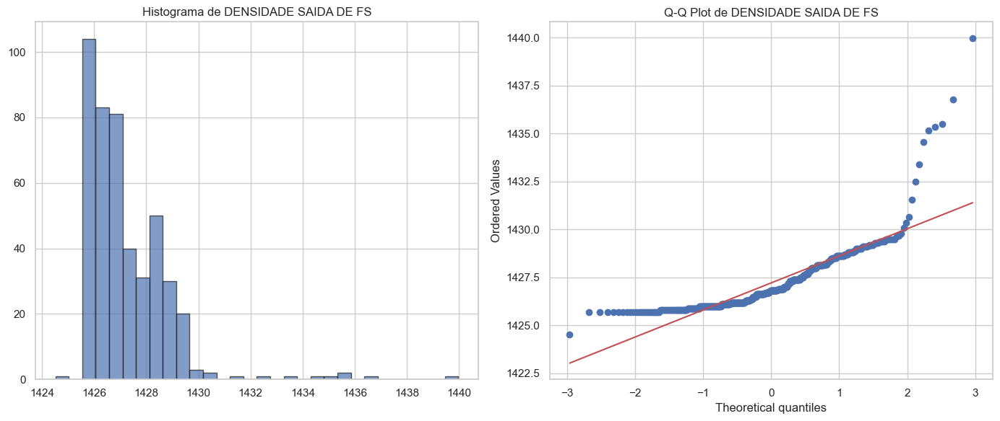


Testes de Normalidade para a coluna: DENSIDADE SAIDA DE FS
Shapiro-Wilk Test: Estatística=0.7551, p-valor=0.0000
Anderson-Darling Test: Estatística=19.5293, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.1708, p-valor=0.0000


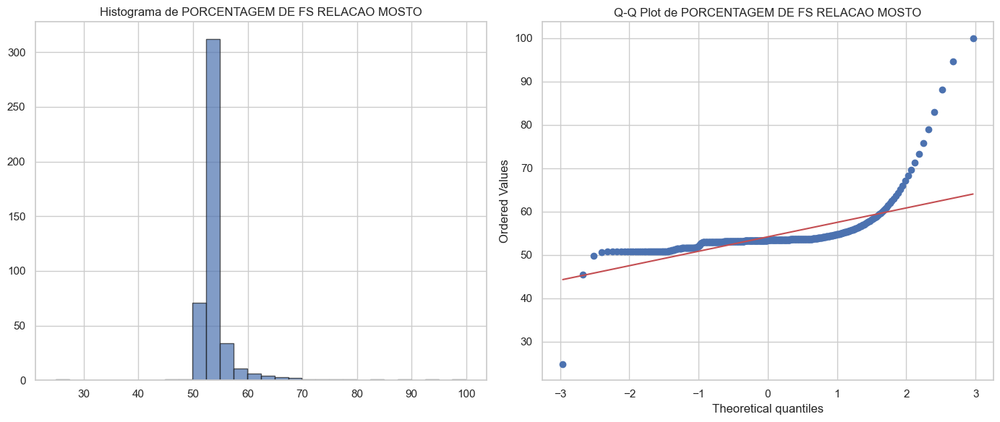


Testes de Normalidade para a coluna: PORCENTAGEM DE FS RELACAO MOSTO
Shapiro-Wilk Test: Estatística=0.4587, p-valor=0.0000
Anderson-Darling Test: Estatística=75.7546, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.3004, p-valor=0.0000


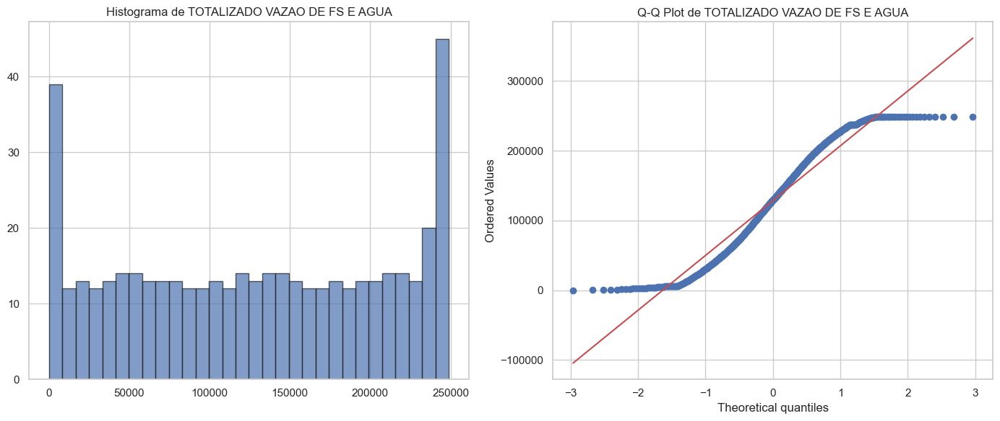


Testes de Normalidade para a coluna: TOTALIZADO VAZAO DE FS E AGUA
Shapiro-Wilk Test: Estatística=0.9333, p-valor=0.0000
Anderson-Darling Test: Estatística=7.5553, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.0719, p-valor=0.0174


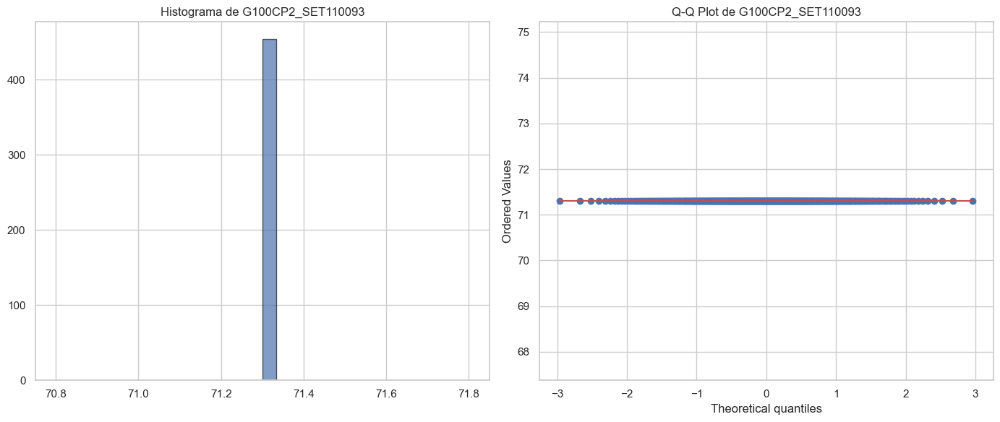


Testes de Normalidade para a coluna: G100CP2_SET110093
Shapiro-Wilk Test: Estatística=1.0000, p-valor=1.0000
Anderson-Darling Test: Estatística=175.6002, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.5111, p-valor=0.0000


C:\Users\barbosa_go\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1879: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "


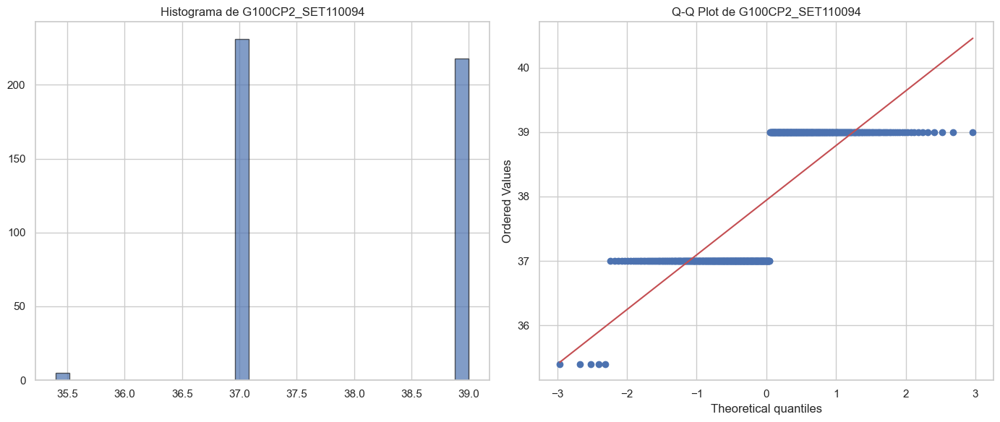


Testes de Normalidade para a coluna: G100CP2_SET110094
Shapiro-Wilk Test: Estatística=0.6709, p-valor=0.0000
Anderson-Darling Test: Estatística=75.5865, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.3396, p-valor=0.0000


In [19]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

# Supondo que df_batelada1 seja o seu DataFrame
def plot_normality_tests(df, column):
    data = df[column].dropna()
    
    # Histograma
    plt.figure(figsize=(14, 6))
    plt.subplot(1, 2, 1)
    plt.hist(data, bins=30, edgecolor='k', alpha=0.7)
    plt.title(f'Histograma de {column}')
    
    # Q-Q Plot
    plt.subplot(1, 2, 2)
    stats.probplot(data, dist="norm", plot=plt)
    plt.title(f'Q-Q Plot de {column}')
    
    plt.tight_layout()
    plt.show()

def testar_normalidade(df, column):
    data = df[column].dropna()
    
    print(f'\nTestes de Normalidade para a coluna: {column}')
    
    # Shapiro-Wilk Test
    stat, p = stats.shapiro(data)
    print(f'Shapiro-Wilk Test: Estatística={stat:.4f}, p-valor={p:.4f}')
    
    # Anderson-Darling Test
    result = stats.anderson(data, dist='norm')
    print(f'Anderson-Darling Test: Estatística={result.statistic:.4f}, Críticos={result.critical_values}')
    
    # Kolmogorov-Smirnov Test (comparando com distribuição normal padrão)
    mu, std = data.mean(), data.std()
    stat, p = stats.kstest(data, 'norm', args=(mu, std))
    print(f'Kolmogorov-Smirnov Test: Estatística={stat:.4f}, p-valor={p:.4f}')

# Lista de colunas numéricas, excluindo "VAZAO DE MOSTO CALCULADA"
numerical_columns = [col for col in df_batelada1.select_dtypes(include=['float64', 'int64']).columns if col != 'VAZAO DE MOSTO CALCULADA']

for column in numerical_columns:
    plot_normality_tests(df_batelada1, column)
    testar_normalidade(df_batelada1, column)


In [20]:
## todos nossos dados não seguem a normalidade, dessa forma nao podemos executar testes de medida central

In [33]:
df_batelada1_sem_timestamp = df_batelada1.drop(columns=['TimeStamp','G100CP2_SET110093','G100CP2_SET110094'])
correlation_spearman = df_batelada1_sem_timestamp .corr(method='spearman')


In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 454 entries, 0 to 453
Data columns (total 18 columns):
 #   Column                                                                Non-Null Count  Dtype         
---  ------                                                                --------------  -----         
 0   TimeStamp                                                             454 non-null    datetime64[ns]
 1   Transmissor de Vazao de H2O                                           454 non-null    float64       
 2   Transmissor de Vazao FS                                               454 non-null    float64       
 3   TOTALIZADO BATELADA FS                                                454 non-null    float64       
 4   TOTALIZADO BATELADA AGUA                                              454 non-null    float64       
 5   VAZAO DE MOSTO CALCULADA                                              454 non-null    float64       
 6   Transmissor de Nivel TANQUE DE PRE AQUECIM

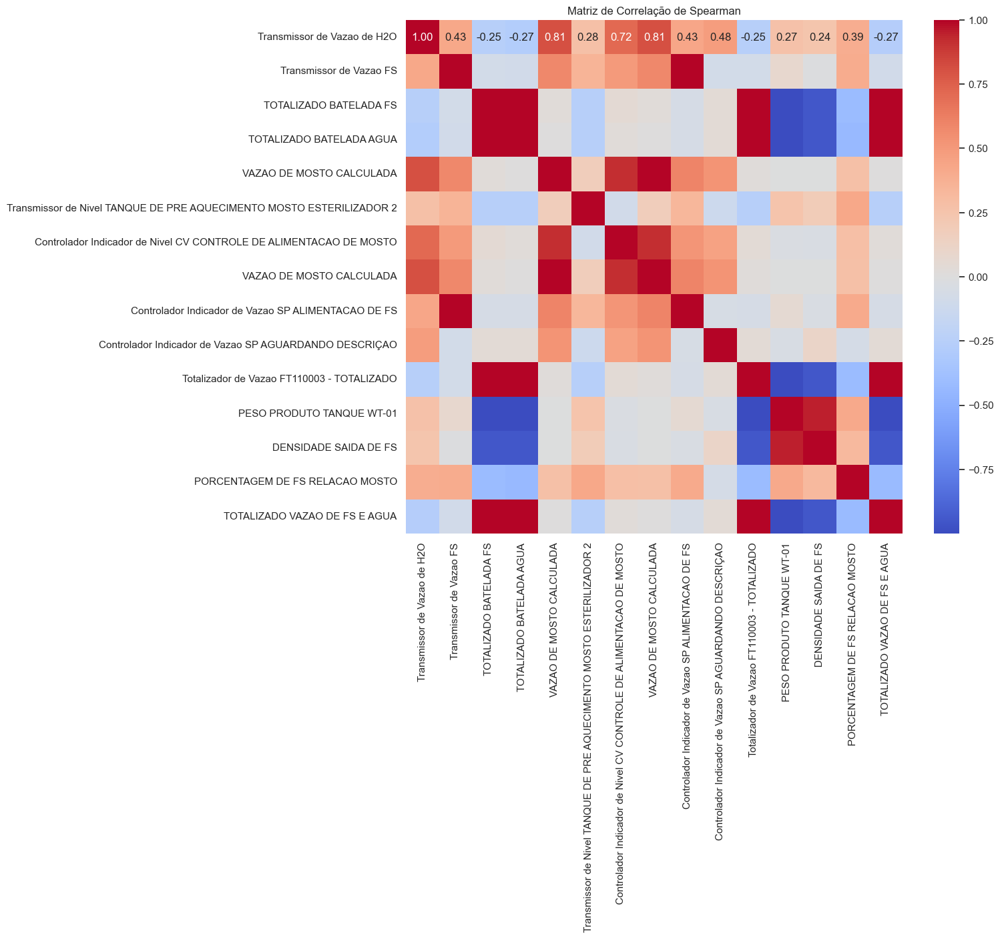

In [35]:
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_spearman, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Matriz de Correlação de Spearman')
plt.show()


#### Correlações Fortes
     Transmissor de Vazao de H2O e VAZAO DE MOSTO CALCULADA: 0.811726
     Transmissor de Vazao FS e Controlador Indicador de Vazao SP ALIMENTACAO DE FS: 0.988404
     Totalizador de Vazao FT110003 - TOTALIZADO e TOTALIZADO BATELADA AGUA: 0.942056
     Totalizador de Vazao FT110003 - TOTALIZADO e TOTALIZADO BATELADA FS: 0.938883
     VAZAO DE MOSTO CALCULADA e Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO: 0.913938
#### Observações
     As variáveis Transmissor de Vazao de H2O e VAZAO DE MOSTO CALCULADA têm uma correlação muito forte, indicando que mudanças em uma tendem a estar associadas com mudanças na outra.
     As variáveis relacionadas aos totalizadores mostram correlações fortes entre si, sugerindo que elas estão fortemente ligadas no processo de esterilização.

#### Correlações Intermediárias
    Totalizador de Vazao FT110003 - TOTALIZADO e PORCENTAGEM DE FS RELACAO MOSTO: 0.542673
    Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO e Transmissor de Nivel TANQUE DE PRE-AQUECIMENTO MOSTO ESTERILIZADOR 2: 0.661411
    Controlador Indicador de Vazao SP ALIMENTACAO DE FS e PORCENTAGEM DE FS RELACAO MOSTO: 0.618733
    TOTALIZADO BATELADA FS e TOTALIZADO BATELADA AGUA: 0.692802
    PORCENTAGEM DE FS RELACAO MOSTO e TOTALIZADO BATELADA AGUA: 0.480510
    TOTALIZADO VAZAO DE FS E AGUA e TOTALIZADO BATELADA AGUA: 0.679857
    TOTALIZADO VAZAO DE FS E AGUA e TOTALIZADO BATELADA FS: 0.667107
#### Observações
    A variável PORCENTAGEM DE FS RELACAO MOSTO mostra correlações intermediárias com várias outras variáveis, sugerindo que essa porcentagem está moderadamente associada a outras medições no processo.
    A relação entre Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO e Transmissor de Nivel TANQUE DE PRE-AQUECIMENTO MOSTO ESTERILIZADOR 2 é moderadamente forte, o que pode indicar uma dependência mútua entre esses controles no processo.

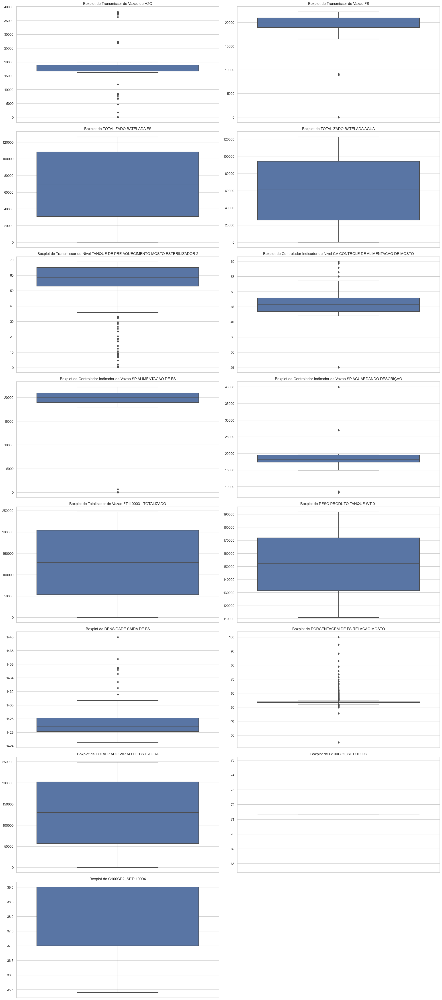

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

# Listar as colunas do DataFrame
colunas = df_batelada1.columns

# Filtrar apenas as colunas numéricas
colunas_numericas = [col for col in colunas if pd.api.types.is_numeric_dtype(df_batelada1[col])]

# Criar subplots para os boxplots
plt.figure(figsize=(20, len(colunas_numericas) * 3))  # Ajuste o tamanho da figura conforme necessário

for i, coluna in enumerate(colunas_numericas, 1):
    plt.subplot(len(colunas_numericas) // 2 + 1, 2, i)  # Ajuste o número de linhas e colunas
    sns.boxplot(data=df_batelada1, y=coluna)
    plt.title(f'Boxplot de {coluna}')
    plt.ylabel('')

plt.tight_layout()
plt.show()


In [27]:
import pandas as pd

# Criar um DataFrame vazio para armazenar os resultados
outliers_df = pd.DataFrame(columns=['Coluna', 'Número de Outliers', 'Outliers'])

# Listar as colunas numéricas
colunas = [
    'Transmissor de Vazao de H2O',
    'Transmissor de Vazao FS',
    'TOTALIZADO BATELADA FS',
    'TOTALIZADO BATELADA AGUA',
    'VAZAO DE MOSTO CALCULADA',
    'Transmissor de Nivel TANQUE DE PRE AQUECIMENTO MOSTO ESTERILIZADOR 2',
    'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO',
    'Controlador Indicador de Vazao SP ALIMENTACAO DE FS',
    'Controlador Indicador de Vazao SP AGUARDANDO DESCRIÇAO',
    'Totalizador de Vazao FT110003 - TOTALIZADO',
    'PESO PRODUTO TANQUE WT-01',
    'DENSIDADE SAIDA DE FS',
    'PORCENTAGEM DE FS RELACAO MOSTO',
    'TOTALIZADO VAZAO DE FS E AGUA'
]

# Calcular os limites e detectar os outliers
resultados = []
for coluna in colunas:
    # Cálculo dos quartis e limites
    Q1 = df_batelada1[coluna].quantile(0.25)
    Q3 = df_batelada1[coluna].quantile(0.75)
    IQR = Q3 - Q1
    limite_inferior = Q1 - 1.5 * IQR
    limite_superior = Q3 + 1.5 * IQR
    
    # Identificar os outliers
    outliers = df_batelada1[(df_batelada1[coluna] < limite_inferior) | (df_batelada1[coluna] > limite_superior)]
    
    # Armazenar resultados
    resultados.append({
        'Coluna': coluna,
        'Número de Outliers': len(outliers),
        'Outliers': outliers[coluna].tolist()
    })

# Criar o DataFrame com os resultados
outliers_df = pd.concat([outliers_df, pd.DataFrame(resultados)], ignore_index=True)

# Exibir o DataFrame com os resultados
print(outliers_df)


ValueError: cannot reindex on an axis with duplicate labels

In [31]:
import pandas as pd

# Remover índices duplicados, se existirem
df_batelada1 = df_batelada1.loc[~df_batelada1.index.duplicated(keep='first')]

# Criar um DataFrame vazio para armazenar os resultados
outliers_df = pd.DataFrame(columns=['Coluna', 'Número de Outliers', 'Outliers'])

# Listar as colunas numéricas
colunas = [
    'Transmissor de Vazao de H2O',
    'Transmissor de Vazao FS',
    'TOTALIZADO BATELADA FS',
    'TOTALIZADO BATELADA AGUA',
    'VAZAO DE MOSTO CALCULADA',
    'Transmissor de Nivel TANQUE DE PRE AQUECIMENTO MOSTO ESTERILIZADOR 2',
    'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO',
    'Controlador Indicador de Vazao SP ALIMENTACAO DE FS',
    'Controlador Indicador de Vazao SP AGUARDANDO DESCRIÇAO',
    'Totalizador de Vazao FT110003 - TOTALIZADO',
    'PESO PRODUTO TANQUE WT-01',
    'DENSIDADE SAIDA DE FS',
    'PORCENTAGEM DE FS RELACAO MOSTO',
    'TOTALIZADO VAZAO DE FS E AGUA'
]

# Calcular os limites e detectar os outliers
resultados = []
for coluna in colunas:
    if coluna in df_batelada1.columns and pd.api.types.is_numeric_dtype(df_batelada1[coluna]):
        # Cálculo dos quartis e limites
        Q1 = df_batelada1[coluna].quantile(0.25)
        Q3 = df_batelada1[coluna].quantile(0.75)
        IQR = Q3 - Q1
        limite_inferior = Q1 - 1.5 * IQR
        limite_superior = Q3 + 1.5 * IQR
        
        # Identificar os outliers
        outliers = df_batelada1[(df_batelada1[coluna] < limite_inferior) | (df_batelada1[coluna] > limite_superior)]
        
        # Armazenar resultados
        resultados.append({
            'Coluna': coluna,
            'Número de Outliers': len(outliers),
            'Outliers': outliers[coluna].tolist()
        })

# Criar o DataFrame com os resultados
outliers_df = pd.concat([outliers_df, pd.DataFrame(resultados)], ignore_index=True)



In [32]:
outliers_df

,Coluna,Número de Outliers,Outliers
0,Transmissor de Vazao de H2O,94,"[6700.06, 8148.75, 8486.25, 8430.75, 8316.75, ..."
1,Transmissor de Vazao FS,93,"[8906.5, 9207.25, 9093.62, 9096.75, 9037.88, 9..."
2,TOTALIZADO BATELADA FS,0,[]
3,TOTALIZADO BATELADA AGUA,0,[]
4,Transmissor de Nivel TANQUE DE PRE AQUECIMENTO...,58,"[0.21, 1.09, 3.59, 6.24, 9.32, 12.59, 15.93, 1..."
5,Controlador Indicador de Nivel CV CONTROLE DE ...,83,"[25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25...."
6,Controlador Indicador de Vazao SP ALIMENTACAO ...,93,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
7,Controlador Indicador de Vazao SP AGUARDANDO D...,93,"[8250.88, 8543.0, 8426.62, 8433.5, 8380.88, 83..."
8,Totalizador de Vazao FT110003 - TOTALIZADO,0,[]
9,PESO PRODUTO TANQUE WT-01,0,[]


In [33]:
from sklearn.ensemble import IsolationForest

# Selecionar colunas numéricas
colunas_numericas = df_batelada1.select_dtypes(include=['float64', 'int64']).columns

# Inicializar o modelo Isolation Forest
model = IsolationForest(contamination=0.05)  # Ajuste a contaminação conforme necessário

# Aplicar o modelo e detectar outliers
for coluna in colunas_numericas:
    dados = df_batelada1[[coluna]].dropna()
    if not dados.empty:
        model.fit(dados)
        predicoes = model.predict(dados)
        outliers = dados[predicoes == -1]
        num_outliers = len(outliers)
        print(f'Coluna: {coluna}')
        print(f'Número de Outliers: {num_outliers}')
        print(f'Outliers:\n{outliers.head()}')
        print()


Coluna: Transmissor de Vazao de H2O
Número de Outliers: 23
Outliers:
     Transmissor de Vazao de H2O
222                      6700.06
224                      8486.25
242                      3714.55
252                     25911.56
615                     26791.88

Coluna: Transmissor de Vazao FS
Número de Outliers: 23
Outliers:
     Transmissor de Vazao FS
222                  8906.50
223                  9207.25
224                  9093.62
225                  9096.75
226                  9037.88

Coluna: TOTALIZADO BATELADA FS
Número de Outliers: 23
Outliers:
     TOTALIZADO BATELADA FS
222                   29.81
223                  182.89
224                  337.98
225                  489.48
598               120493.83

Coluna: TOTALIZADO BATELADA AGUA
Número de Outliers: 23
Outliers:
     TOTALIZADO BATELADA AGUA
222                     64.10
252                     92.20
627                 112452.14
628                 113086.94
629                 113721.95

Coluna: VAZA

In [34]:
import pandas as pd
from sklearn.ensemble import IsolationForest

# Supondo que você já tenha o DataFrame df_batelada1 e os índices dos outliers identificados
# Aqui, fornecemos um exemplo de como você pode remover os outliers de todas as colunas identificadas.

# Lista de colunas e os índices dos outliers para cada coluna
outliers_dict = {
    'Transmissor de Vazao de H2O': [222, 224, 242, 252, 616],
    'Transmissor de Vazao FS': [222, 223, 224, 225, 226],
    'TOTALIZADO BATELADA FS': [222, 223, 224, 225, 226],
    'TOTALIZADO BATELADA AGUA': [222, 223, 252, 629, 630],
    'VAZAO DE MOSTO CALCULADA': [242, 243, 244, 245, 246],
    'Transmissor de Nivel TANQUE DE PRE AQUECIMENTO MOSTO ESTERILIZADOR 2': [222, 223, 224, 225, 227],
    'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO': [252, 253, 623, 624, 625],
    'Controlador Indicador de Vazao SP ALIMENTACAO DE FS': [242, 450, 451, 452, 453],
    'Controlador Indicador de Vazao SP AGUARDANDO DESCRIÇAO': [223, 224, 225, 226, 227],
    'Totalizador de Vazao FT110003 - TOTALIZADO': [253, 254, 255, 256, 257],
    'PESO PRODUTO TANQUE WT-01': [222, 223, 224, 225, 226],
    'DENSIDADE SAIDA DE FS': [222, 223, 224, 225, 226],
    'PORCENTAGEM DE FS RELACAO MOSTO': [222, 223, 252, 253, 254],
    'TOTALIZADO VAZAO DE FS E AGUA': [222, 223, 224, 225, 226]
}

# Copia o DataFrame original para não alterar o original
df_cleaned = df_batelada1.copy()

# Remove as linhas identificadas como outliers
for coluna, indices_outliers in outliers_dict.items():
    df_cleaned = df_cleaned[~df_cleaned.index.isin(indices_outliers)]

# Exibir as primeiras linhas do DataFrame limpo
print(df_cleaned.head())


              TimeStamp  Transmissor de Vazao de H2O  Transmissor de Vazao FS  \
228 2024-08-01 09:48:00                      8399.62                  9213.00   
229 2024-08-01 09:49:00                      8391.38                  9024.25   
230 2024-08-01 09:50:00                      8305.12                  8940.88   
231 2024-08-01 09:51:00                      8308.88                  8952.00   
232 2024-08-01 09:52:00                      8356.88                  8908.38   

     TOTALIZADO BATELADA FS  TOTALIZADO BATELADA AGUA  \
228                  942.72                    893.51   
229                 1091.66                   1031.98   
230                 1246.32                   1175.86   
231                 1392.94                   1312.06   
232                 1539.27                   1447.75   

     VAZAO DE MOSTO CALCULADA  \
228                       0.0   
229                       0.0   
230                       0.0   
231                       0.0   
232  

# Calculo para 0.6 H

In [38]:
df_cleaned.describe()

,TimeStamp,Transmissor de Vazao de H2O,Transmissor de Vazao FS,TOTALIZADO BATELADA FS,TOTALIZADO BATELADA AGUA,VAZAO DE MOSTO CALCULADA,Transmissor de Nivel TANQUE DE PRE AQUECIMENTO MOSTO ESTERILIZADOR 2,Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO,VAZAO DE MOSTO CALCULADA,Controlador Indicador de Vazao SP ALIMENTACAO DE FS,Controlador Indicador de Vazao SP AGUARDANDO DESCRIÇAO,Totalizador de Vazao FT110003 - TOTALIZADO,PESO PRODUTO TANQUE WT-01,DENSIDADE SAIDA DE FS,PORCENTAGEM DE FS RELACAO MOSTO,TOTALIZADO VAZAO DE FS E AGUA,G100CP2_PV110006,G100CP2_PV110005,bateladas
count,429,429.000000,429.000000,429.000000,429.000000,429.000000,429.000000,429.000000,429.000000,429.000000,429.000000,429.000000,429.000000,429.000000,429.000000,429.000000,429.000000,4.290000e+02,429.0
mean,2024-08-01 13:35:18.181818368,16770.052051,17126.131189,69795.264429,61827.849953,34918.817483,54.402564,44.325198,34918.817483,16845.376200,19172.542634,130819.527086,150273.526807,1427.115035,53.839697,113696.217739,37.991142,7.130000e+01,1.0
min,2024-08-01 09:48:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.790000,18.750000,0.000000,0.000000,8249.750000,0.000000,110601.000000,1425.690000,50.760000,0.000000,35.400000,7.130000e+01,1.0
25%,2024-08-01 11:46:00,16712.620000,19026.620000,33635.480000,28487.160000,36579.290000,52.960000,43.490000,36579.290000,19045.000000,17356.880000,59461.140000,130974.000000,1426.120000,53.040000,27371.150000,37.000000,7.130000e+01,1.0
50%,2024-08-01 13:37:00,17880.000000,20093.000000,70783.870000,63006.590000,38088.570000,58.780000,45.650000,38088.570000,20094.380000,18177.750000,133371.190000,150515.000000,1426.690000,53.390000,112043.530000,39.000000,7.130000e+01,1.0
75%,2024-08-01 15:24:00,18815.250000,20967.750000,108513.080000,94345.380000,40068.730000,65.240000,47.750000,40068.730000,20979.620000,19411.000000,204714.970000,170294.000000,1428.000000,53.750000,194931.440000,39.000000,7.130000e+01,1.0
max,2024-08-01 17:17:00,38198.120000,22212.000000,126317.000000,122541.990000,44195.940000,68.630000,59.790000,44195.940000,22211.250000,39975.000000,246530.840000,189538.000000,1438.460000,72.060000,248859.000000,39.000000,7.130000e+01,1.0
std,NaN,6508.809027,7321.539478,40923.888139,37828.538335,11429.907569,17.153780,7.744778,11429.907569,7808.951747,4542.148949,80993.509179,22466.271889,1.426822,2.645808,87496.534873,1.021093,4.979606e-13,0.0


In [44]:
df_cleaned['Fator Vazão'] = (df_cleaned['Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO'] - 0.6)*-1

df_cleaned['Vazão de Mosto Desejada'] = df_cleaned['Fator Vazão'] *df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO']


df_cleaned['valor do setpoint'] = df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO'] +df_cleaned['Vazão de Mosto Desejada']

df_cleaned['Vazão de FS'] = (df_cleaned['G100CP2_PV110006'] / df_cleaned['G100CP2_PV110005'] ) *df_cleaned['valor do setpoint']


df_cleaned['entrada de agua'] = ((df_cleaned['G100CP2_PV110005'] - df_cleaned['G100CP2_PV110006']) / df_cleaned['G100CP2_PV110006']) * df_cleaned['Transmissor de Vazao de H2O']


#### Simulação de valores

In [56]:
import pandas as pd
import numpy as np

# Criação de um DataFrame para armazenar os resultados
results = pd.DataFrame()

# Geração de valores para as variáveis
aft_desejada_values = np.arange(37, 43, 1)  # 37 a 42
aft_do_fs_values = np.arange(70, 75, 1)     # 70 a 74

# Exemplo de transmissor de vazão e nível (valores aleatórios para simulação)
transmissor_h2o_values = np.random.uniform(500, 1000, size=10)
transmissor_mosto_values = np.random.uniform(1000, 2000, size=10)
controlador_nivel_values = np.random.uniform(0.5, 1.5, size=10)

# Loop através de todas as combinações possíveis
for aft_desejada in aft_desejada_values:
    for aft_do_fs in aft_do_fs_values:
        for transmissor_h2o in transmissor_h2o_values:
            for transmissor_mosto in transmissor_mosto_values:
                for controlador_nivel in controlador_nivel_values:
                    # Cálculos baseados nas fórmulas fornecidas
                    fator_vazao = (controlador_nivel - 0.6) * -1
                    vazao_desejada = fator_vazao * transmissor_mosto
                    valor_setpoint = transmissor_mosto + vazao_desejada
                    vazao_fs = (aft_desejada / aft_do_fs) * valor_setpoint
                    entrada_agua = ((aft_do_fs - aft_desejada) / aft_desejada) * transmissor_h2o

                    # Armazenar resultados
                    result_row = {
                        'G100CP2_PV110006': aft_desejada,
                        'G100CP2_PV110005': aft_do_fs,
                        'Transmissor de Vazao de H2O': transmissor_h2o,
                        'Totalizador de Vazao FT110003 - TOTALIZADO': transmissor_mosto,
                        'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO': controlador_nivel,
                        'Fator Vazão': fator_vazao,
                        'Vazão de Mosto Desejada': vazao_desejada,
                        'valor do setpoint': valor_setpoint,
                        'Vazão de FS': vazao_fs,
                        'entrada de agua': entrada_agua
                    }
                    results = pd.concat([results, pd.DataFrame([result_row])], ignore_index=True)

# Exibição dos resultados
print(results)


       G100CP2_PV110006  G100CP2_PV110005  Transmissor de Vazao de H2O  \
0                    37                70                   702.477580   
1                    37                70                   702.477580   
2                    37                70                   702.477580   
3                    37                70                   702.477580   
4                    37                70                   702.477580   
...                 ...               ...                          ...   
29995                42                74                   857.158354   
29996                42                74                   857.158354   
29997                42                74                   857.158354   
29998                42                74                   857.158354   
29999                42                74                   857.158354   

       Totalizador de Vazao FT110003 - TOTALIZADO  \
0                                     1978.403759   
1    

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


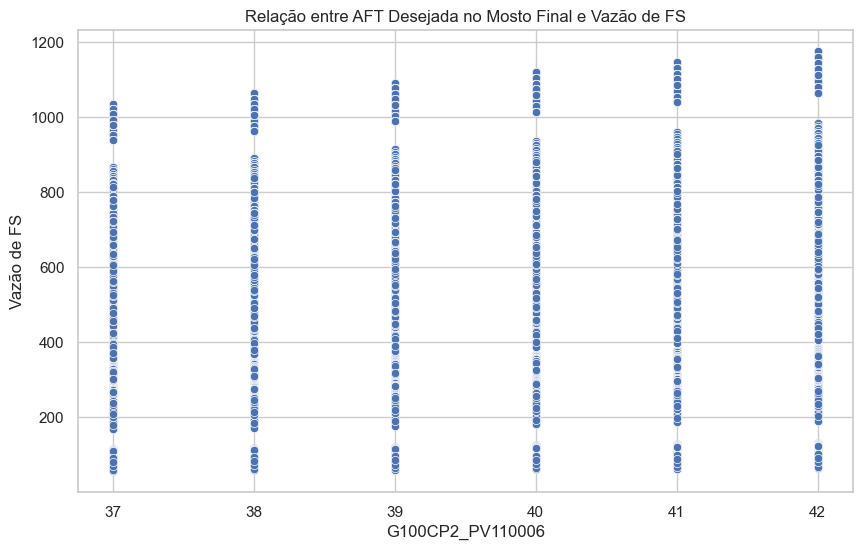

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


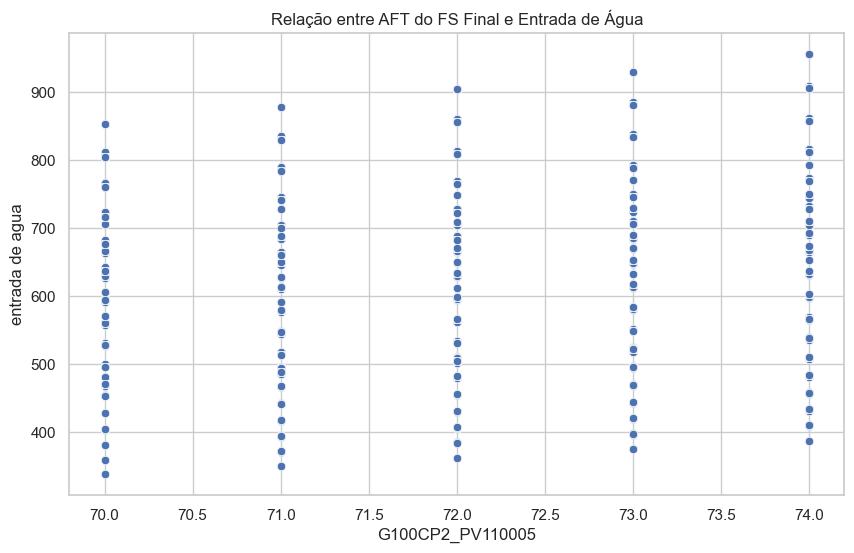

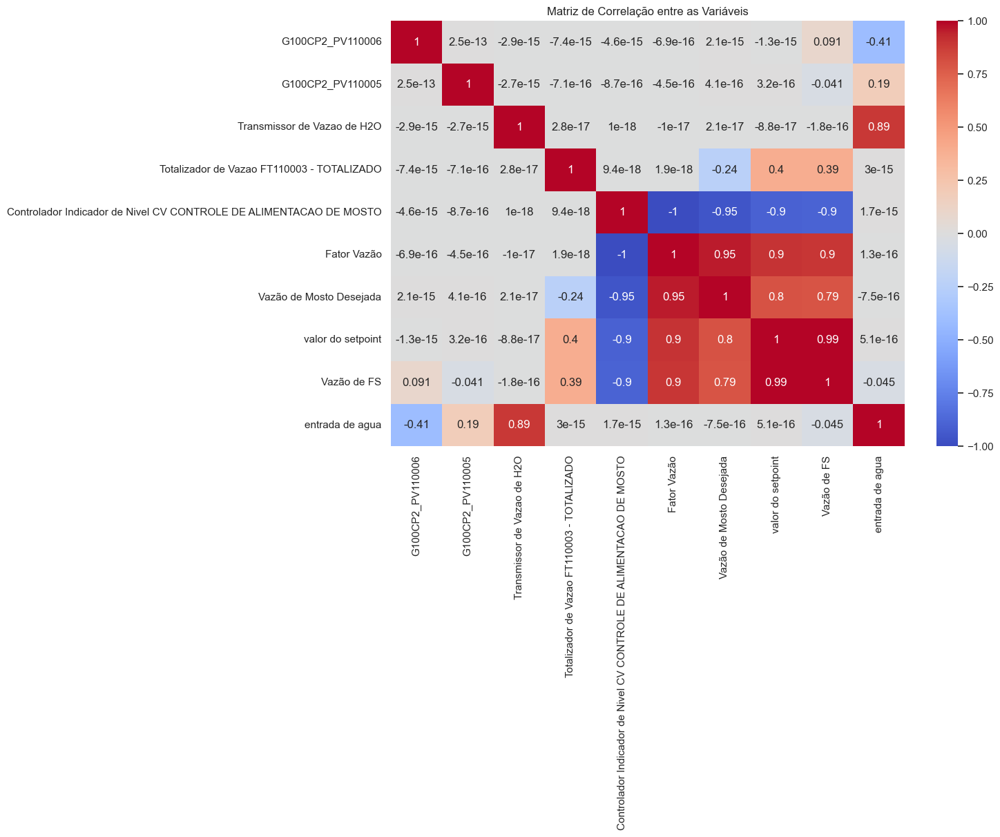

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt

# Scatter plot para analisar a relação entre G100CP2_PV110006 (AFT DESEJADA NO MOSTO FINAL) e Vazão de FS
plt.figure(figsize=(10, 6))
sns.scatterplot(x='G100CP2_PV110006', y='Vazão de FS', data=results)
plt.title('Relação entre AFT Desejada no Mosto Final e Vazão de FS')
plt.show()

# Scatter plot para analisar a relação entre G100CP2_PV110005 (AFT DO FS FINAL) e Entrada de Água
plt.figure(figsize=(10, 6))
sns.scatterplot(x='G100CP2_PV110005', y='entrada de agua', data=results)
plt.title('Relação entre AFT do FS Final e Entrada de Água')
plt.show()

# Heatmap para ver a correlação entre todas as variáveis
plt.figure(figsize=(12, 8))
sns.heatmap(results.corr(), annot=True, cmap='coolwarm')
plt.title('Matriz de Correlação entre as Variáveis')
plt.show()


In [59]:
# Calcular a matriz de correlação
correlation_matrix = results.corr()

# Printar a matriz de correlação com números
print(correlation_matrix)


                                                    G100CP2_PV110006  \
G100CP2_PV110006                                        1.000000e+00   
G100CP2_PV110005                                        2.458009e-13   
Transmissor de Vazao de H2O                            -2.897813e-15   
Totalizador de Vazao FT110003 - TOTALIZADO             -7.444180e-15   
Controlador Indicador de Nivel CV CONTROLE DE A...     -4.636698e-15   
Fator Vazão                                            -6.918441e-16   
Vazão de Mosto Desejada                                 2.054000e-15   
valor do setpoint                                      -1.284261e-15   
Vazão de FS                                             9.081207e-02   
entrada de agua                                        -4.093050e-01   

                                                    G100CP2_PV110005  \
G100CP2_PV110006                                        2.458009e-13   
G100CP2_PV110005                                        1.00000

### Alta Correlação Positiva:

- Controlador Indicador de Nível CV CONTROLE DE ALIMENTAÇÃO DE MOSTO e Fator Vazão (-1.00): Isso faz sentido, pois o fator vazão é calculado diretamente a partir do controlador de nível.
- Vazão de FS e valor do setpoint (0.993): Isso sugere uma forte relação entre a vazão de FS e o setpoint ajustado.
### Correlação com entrada de agua:
- Transmissor de Vazao de H2O e entrada de agua (0.888): Como esperado, há uma alta correlação entre a quantidade de água que entra no sistema e o transmissor de vazão de H2O.
- G100CP2_PV110006 (AFT desejada no mosto final) e entrada de agua (-0.409): Existe uma correlação negativa moderada, indicando que, à medida que a AFT desejada aumenta, a quantidade de água necessária diminui.

In [60]:
df_cleaned .info()

<class 'pandas.core.frame.DataFrame'>
Index: 429 entries, 228 to 677
Data columns (total 24 columns):
 #   Column                                                                Non-Null Count  Dtype         
---  ------                                                                --------------  -----         
 0   TimeStamp                                                             429 non-null    datetime64[ns]
 1   Transmissor de Vazao de H2O                                           429 non-null    float64       
 2   Transmissor de Vazao FS                                               429 non-null    float64       
 3   TOTALIZADO BATELADA FS                                                429 non-null    float64       
 4   TOTALIZADO BATELADA AGUA                                              429 non-null    float64       
 5   VAZAO DE MOSTO CALCULADA                                              429 non-null    float64       
 6   Transmissor de Nivel TANQUE DE PRE AQUECIMENT

   G100CP2_PV110006  G100CP2_PV110005  Verificacao
0                37                70          0.7
1                37                70          0.7
2                37                70          0.7
3                37                70          0.7
4                37                70          0.7


In [66]:
import pandas as pd

# Valores fornecidos
data = {
    'G100CP2_PV110006': [37, 37, 37, 37, 37],
    'G100CP2_PV110005': [70, 70, 70, 70, 70],
    'Transmissor de Vazao de H2O': [702.47758] * 5,
    'Totalizador de Vazao FT110003 - TOTALIZADO': [2019.703759] * 5,
    'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO': [1.272884, 0.608607, 0.770033, 0.873510, 1.232684],
    'Fator Vazão': [-0.672884, -0.008607, -0.170033, -0.273510, -0.632684],
    'Vazão de Mosto Desejada': [-1331.237142, -17.027729, -336.394077, -541.113920, -1251.704846],
    'valor do setpoint': [647.166617, 1961.376030, 1642.009683, 1437.289839, 726.698913],
    'Vazão de FS': [342.073783, 1036.727330, 867.919404, 759.710343, 384.112283],
    'entrada de agua': [626.534058] * 5
}

# Criação do DataFrame
df_results = pd.DataFrame(data)

# Cálculo do AFT desejado no mosto final
df_results['AFT Calculado'] = (df_results['Vazão de FS'] * (df_results['G100CP2_PV110005'] / 100)) / df_results['Totalizador de Vazao FT110003 - TOTALIZADO']

# Verifique o DataFrame para ver o AFT Calculado
print(df_results[['G100CP2_PV110006', 'G100CP2_PV110005', 'Totalizador de Vazao FT110003 - TOTALIZADO', 'Vazão de FS', 'AFT Calculado']])


   G100CP2_PV110006  G100CP2_PV110005  \
0                37                70   
1                37                70   
2                37                70   
3                37                70   
4                37                70   

   Totalizador de Vazao FT110003 - TOTALIZADO  Vazão de FS  AFT Calculado  
0                                 2019.703759   342.073783       0.118558  
1                                 2019.703759  1036.727330       0.359315  
2                                 2019.703759   867.919404       0.300808  
3                                 2019.703759   759.710343       0.263305  
4                                 2019.703759   384.112283       0.133128  


In [67]:
import pandas as pd

# Dados simulados
data = {
    'G100CP2_PV110006': [37, 37, 37, 37, 37],
    'G100CP2_PV110005': [70, 70, 70, 70, 70],
    'Transmissor de Vazao de H2O': [702.47758, 702.47758, 702.47758, 702.47758, 702.47758],
    'Totalizador de Vazao FT110003 - TOTALIZADO': [2019.703759, 2019.703759, 2019.703759, 2019.703759, 2019.703759],
    'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO': [1.272884, 0.608607, 0.770033, 0.873510, 1.232684]
}

results = pd.DataFrame(data)

def calcular_verificacao(totalizado_batelada_fs, g100cp2_pv110005, totalizador_vazao):
    return (totalizado_batelada_fs * (g100cp2_pv110005 / 100)) / totalizador_vazao

def ajustar_variaveis(results, aft_desejada_final):
    for index, row in results.iterrows():
        totalizado_batelada_fs = row['Totalizador de Vazao FT110003 - TOTALIZADO']
        g100cp2_pv110005 = row['G100CP2_PV110005']
        totalizador_vazao = row['Totalizador de Vazao FT110003 - TOTALIZADO']
        
        verificacao = calcular_verificacao(totalizado_batelada_fs, g100cp2_pv110005, totalizador_vazao)
        
        # Ajuste o valor da variável conforme necessário para atingir o AFT desejado
        if verificacao != aft_desejada_final:
            ajuste_necessario = aft_desejada_final - verificacao
            fator_ajuste = ajuste_necessario / (totalizado_batelada_fs * (g100cp2_pv110005 / 100))
            results.at[index, 'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO'] += fator_ajuste
            print(f"Ajustado Controlador Indicador de Nivel para o índice {index} para atingir AFT desejada.")

# Defina o valor desejado de AFT no mosto final
aft_desejada_final = 42  # Exemplo de valor desejado

# Ajustar as variáveis para alcançar o valor de AFT desejado
ajustar_variaveis(results, aft_desejada_final)

# Exibir os resultados ajustados
print(results)


Ajustado Controlador Indicador de Nivel para o índice 0 para atingir AFT desejada.
Ajustado Controlador Indicador de Nivel para o índice 1 para atingir AFT desejada.
Ajustado Controlador Indicador de Nivel para o índice 2 para atingir AFT desejada.
Ajustado Controlador Indicador de Nivel para o índice 3 para atingir AFT desejada.
Ajustado Controlador Indicador de Nivel para o índice 4 para atingir AFT desejada.
   G100CP2_PV110006  G100CP2_PV110005  Transmissor de Vazao de H2O  \
0                37                70                    702.47758   
1                37                70                    702.47758   
2                37                70                    702.47758   
3                37                70                    702.47758   
4                37                70                    702.47758   

   Totalizador de Vazao FT110003 - TOTALIZADO  \
0                                 2019.703759   
1                                 2019.703759   
2                

In [70]:
# AFT desejada
aft_desejada = 42  # Por exemplo

# Calcule a AFT atual com os valores simulados
df_cleaned['AFT Calculada'] = (df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO'] * 
                               (df_cleaned['G100CP2_PV110005'] )) / df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO']

# Ajustar Fator Vazão para alcançar a AFT desejada
df_cleaned['Ajuste Fator Vazão'] = (aft_desejada - df_cleaned['AFT Calculada']) / df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO']
df_cleaned['Fator Vazão Ajustado'] = df_cleaned['Fator Vazão'] + df_cleaned['Ajuste Fator Vazão']

# Recalcular os parâmetros com o Fator Vazão Ajustado
df_cleaned['Vazão de Mosto Desejada'] = df_cleaned['Fator Vazão Ajustado'] * df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO']
df_cleaned['valor do setpoint'] = df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO'] + df_cleaned['Vazão de Mosto Desejada']
df_cleaned['Vazão de FS'] = (df_cleaned['G100CP2_PV110006'] / df_cleaned['G100CP2_PV110005']) * df_cleaned['valor do setpoint']
df_cleaned['entrada de agua'] = ((df_cleaned['G100CP2_PV110005'] - df_cleaned['G100CP2_PV110006']) / df_cleaned['G100CP2_PV110006']) * df_cleaned['Transmissor de Vazao de H2O']


In [71]:
import pandas as pd
import numpy as np

# Define valores simulados
np.random.seed(42)  # Para reprodutibilidade

# Criar um DataFrame de exemplo com valores simulados
df_cleaned = pd.DataFrame({
    'G100CP2_PV110006': np.random.uniform(30, 40, 5),
    'G100CP2_PV110005': np.random.uniform(60, 80, 5),
    'Transmissor de Vazao de H2O': np.random.uniform(700, 800, 5),
    'Totalizador de Vazao FT110003 - TOTALIZADO': np.random.uniform(2000, 2200, 5),
    'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO': np.random.uniform(0.5, 1.3, 5)
})

# Calcular o Fator Vazão
df_cleaned['Fator Vazão'] = (df_cleaned['Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO'] - 0.6) * -1

# Calcular a Vazão de Mosto Desejada
df_cleaned['Vazão de Mosto Desejada'] = df_cleaned['Fator Vazão'] * df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO']

# Calcular o valor do setpoint
df_cleaned['valor do setpoint'] = df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO'] + df_cleaned['Vazão de Mosto Desejada']

# Calcular a Vazão de FS
df_cleaned['Vazão de FS'] = (df_cleaned['G100CP2_PV110006'] / df_cleaned['G100CP2_PV110005']) * df_cleaned['valor do setpoint']

# Calcular a Entrada de Água
df_cleaned['entrada de agua'] = ((df_cleaned['G100CP2_PV110005'] - df_cleaned['G100CP2_PV110006']) / df_cleaned['G100CP2_PV110006']) * df_cleaned['Transmissor de Vazao de H2O']

# Calcular a AFT Calculada com valores simulados
df_cleaned['AFT Calculada'] = (df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO'] * 
                                (df_cleaned['G100CP2_PV110005'] / 100)) / df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO']

# Definir o valor desejado de AFT no mosto final
aft_desejada = 42

# Ajustar Fator Vazão para alcançar a AFT desejada
df_cleaned['Ajuste Fator Vazão'] = (aft_desejada - df_cleaned['AFT Calculada']) / df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO']
df_cleaned['Fator Vazão Ajustado'] = df_cleaned['Fator Vazão'] + df_cleaned['Ajuste Fator Vazão']

# Recalcular os parâmetros com o Fator Vazão Ajustado
df_cleaned['Vazão de Mosto Desejada'] = df_cleaned['Fator Vazão Ajustado'] * df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO']
df_cleaned['valor do setpoint'] = df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO'] + df_cleaned['Vazão de Mosto Desejada']
df_cleaned['Vazão de FS'] = (df_cleaned['G100CP2_PV110006'] / df_cleaned['G100CP2_PV110005']) * df_cleaned['valor do setpoint']
df_cleaned['entrada de agua'] = ((df_cleaned['G100CP2_PV110005'] - df_cleaned['G100CP2_PV110006']) / df_cleaned['G100CP2_PV110006']) * df_cleaned['Transmissor de Vazao de H2O']

# Verificar se a AFT desejada é atingida
df_cleaned['AFT Verificado'] = (df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO'] * 
                                (df_cleaned['G100CP2_PV110005'] / 100)) / df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO']

print(df_cleaned)


   G100CP2_PV110006  G100CP2_PV110005  Transmissor de Vazao de H2O  \
0         33.745401         63.119890                   702.058449   
1         39.507143         61.161672                   796.990985   
2         37.319939         77.323523                   783.244264   
3         35.986585         72.022300                   721.233911   
4         31.560186         74.161452                   718.182497   

   Totalizador de Vazao FT110003 - TOTALIZADO  \
0                                 2036.680902   
1                                 2060.848449   
2                                 2104.951286   
3                                 2086.389004   
4                                 2058.245828   

   Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO  \
0                                           0.989482                    
1                                           0.611595                    
2                                           0.733716             

In [72]:
import pandas as pd
import numpy as np

# Definindo o valor desejado de AFT no mosto final
aft_desejada_percentual = 42 / 100  # Convertendo para decimal

# Simulando valores para as colunas
np.random.seed(0)  # Para reprodutibilidade
num_rows = 5

df_cleaned = pd.DataFrame({
    'G100CP2_PV110006': np.random.uniform(30, 40, num_rows),  # % para FS
    'G100CP2_PV110005': np.random.uniform(60, 80, num_rows),  # % para Totalizador de Vazão
    'Transmissor de Vazao de H2O': np.random.uniform(700, 800, num_rows),
    'Totalizador de Vazao FT110003 - TOTALIZADO': np.random.uniform(2000, 2100, num_rows),
    'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO': np.random.uniform(0.6, 1.3, num_rows)
})

# Cálculos
df_cleaned['Fator Vazão'] = (df_cleaned['Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO'] - 0.6) * -1
df_cleaned['Vazão de Mosto Desejada'] = df_cleaned['Fator Vazão'] * df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO']
df_cleaned['valor do setpoint'] = df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO'] + df_cleaned['Vazão de Mosto Desejada']
df_cleaned['Vazão de FS'] = (df_cleaned['G100CP2_PV110006'] / df_cleaned['G100CP2_PV110005']) * df_cleaned['valor do setpoint']
df_cleaned['entrada de agua'] = ((df_cleaned['G100CP2_PV110005'] - df_cleaned['G100CP2_PV110006']) / df_cleaned['G100CP2_PV110006']) * df_cleaned['Transmissor de Vazao de H2O']

# Calcular o AFT calculado com a fórmula corrigida
df_cleaned['AFT Calculada'] = df_cleaned['Vazão de FS'] / (df_cleaned['Vazão de FS'] + df_cleaned['entrada de agua'])

# Ajustar o fator de vazão para alcançar o AFT desejado
df_cleaned['AFT Calculada Percentual'] = df_cleaned['AFT Calculada'] * 100
df_cleaned['Ajuste Fator Vazão'] = (aft_desejada_percentual - df_cleaned['AFT Calculada']) / df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO']
df_cleaned['Fator Vazão Ajustado'] = df_cleaned['Fator Vazão'] + df_cleaned['Ajuste Fator Vazão']

# Recalcular com o fator de vazão ajustado
df_cleaned['Vazão de Mosto Desejada'] = df_cleaned['Fator Vazão Ajustado'] * df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO']
df_cleaned['valor do setpoint'] = df_cleaned['Totalizador de Vazao FT110003 - TOTALIZADO'] + df_cleaned['Vazão de Mosto Desejada']
df_cleaned['Vazão de FS'] = (df_cleaned['G100CP2_PV110006'] / df_cleaned['G100CP2_PV110005']) * df_cleaned['valor do setpoint']
df_cleaned['entrada de agua'] = ((df_cleaned['G100CP2_PV110005'] - df_cleaned['G100CP2_PV110006']) / df_cleaned['G100CP2_PV110006']) * df_cleaned['Transmissor de Vazao de H2O']
df_cleaned['AFT Verificado'] = df_cleaned['Vazão de FS'] / (df_cleaned['Vazão de FS'] + df_cleaned['entrada de agua'])

print(df_cleaned[['G100CP2_PV110006', 'G100CP2_PV110005', 'Transmissor de Vazao de H2O', 'Totalizador de Vazao FT110003 - TOTALIZADO',
                  'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO', 'Fator Vazão', 'Vazão de Mosto Desejada',
                  'valor do setpoint', 'Vazão de FS', 'entrada de agua', 'AFT Calculada Percentual', 'Ajuste Fator Vazão',
                  'Fator Vazão Ajustado', 'AFT Verificado']])


   G100CP2_PV110006  G100CP2_PV110005  Transmissor de Vazao de H2O  \
0         35.488135         72.917882                   779.172504   
1         37.151894         68.751744                   752.889492   
2         36.027634         77.835460                   756.804456   
3         35.448832         79.273255                   792.559664   
4         34.236548         67.668830                   707.103606   

   Totalizador de Vazao FT110003 - TOTALIZADO  \
0                                 2008.712930   
1                                 2002.021840   
2                                 2083.261985   
3                                 2077.815675   
4                                 2087.001215   

   Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO  \
0                                           1.285033                    
1                                           1.159411                    
2                                           0.923036             

## Final 1 - possivel
- aqui ja temos um resultado consistente, levando em consideração que simuelei a equação com valores altos para 
    todas as variaveis, ou seja, este médoto poderá ser utilizado. Agora vamos validar se isso tem o mesmo comportamento para 
    as 6 bateladas 

# Expandindo para as outras bateladas

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


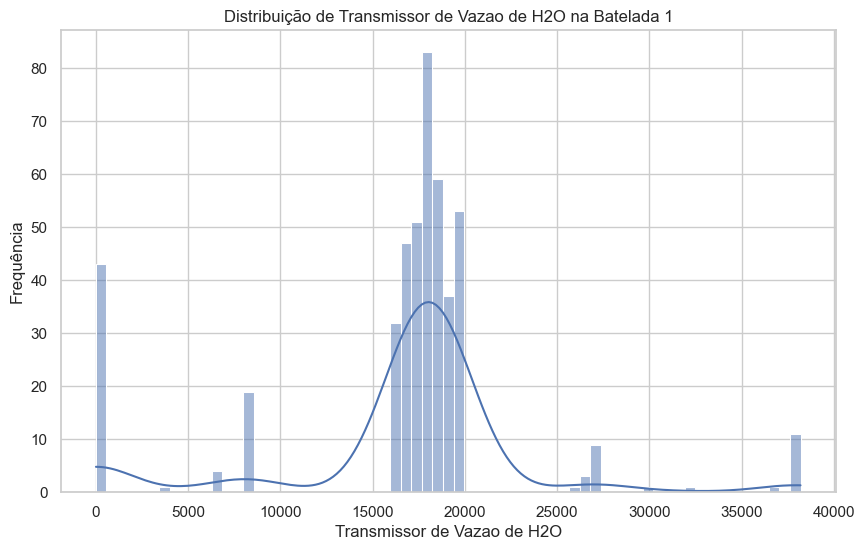

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


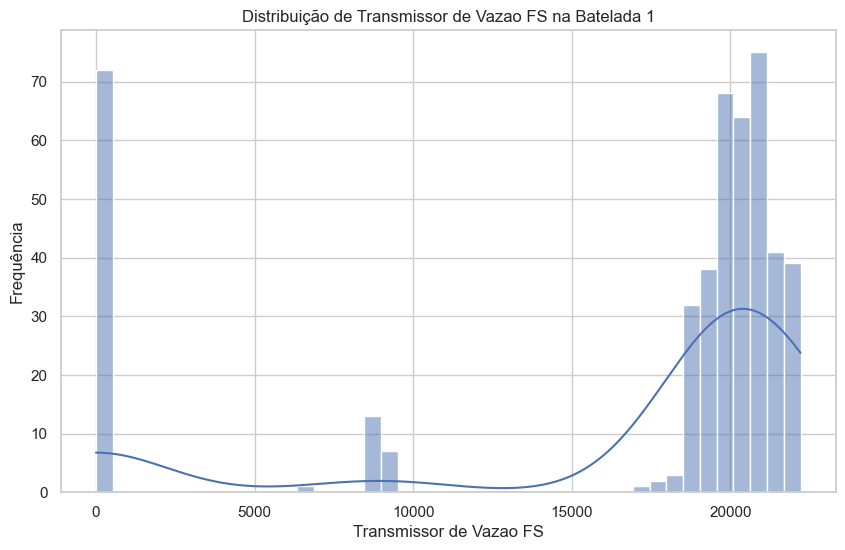

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


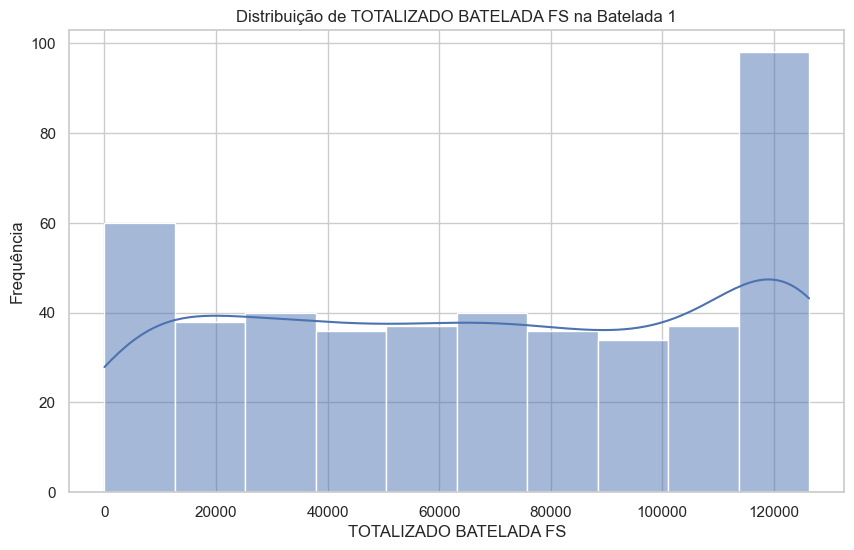

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


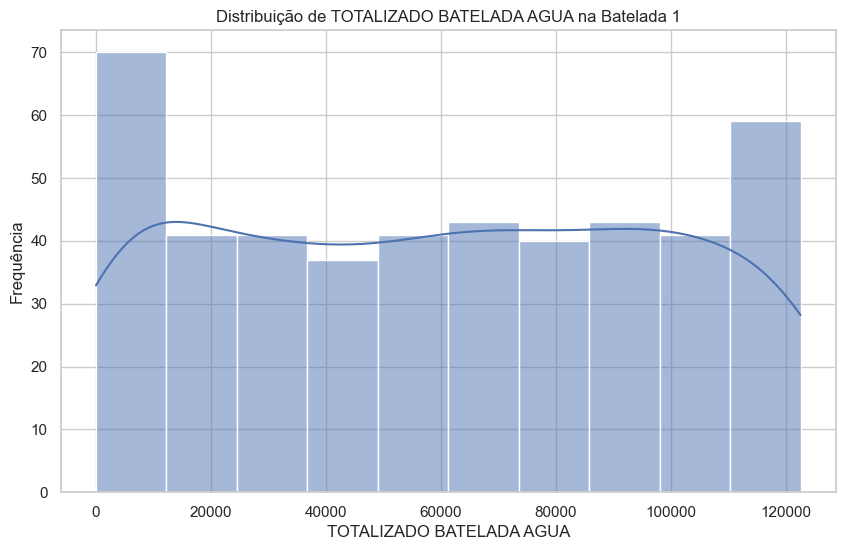

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

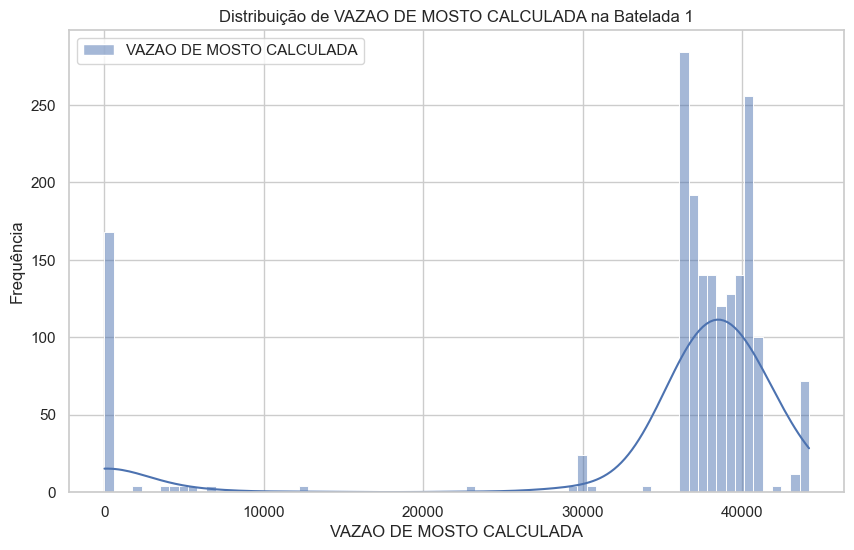

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


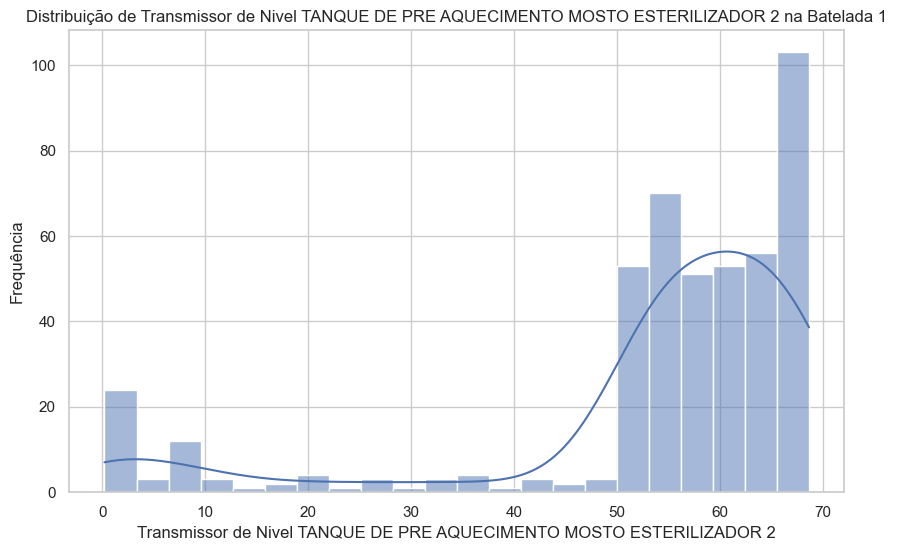

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


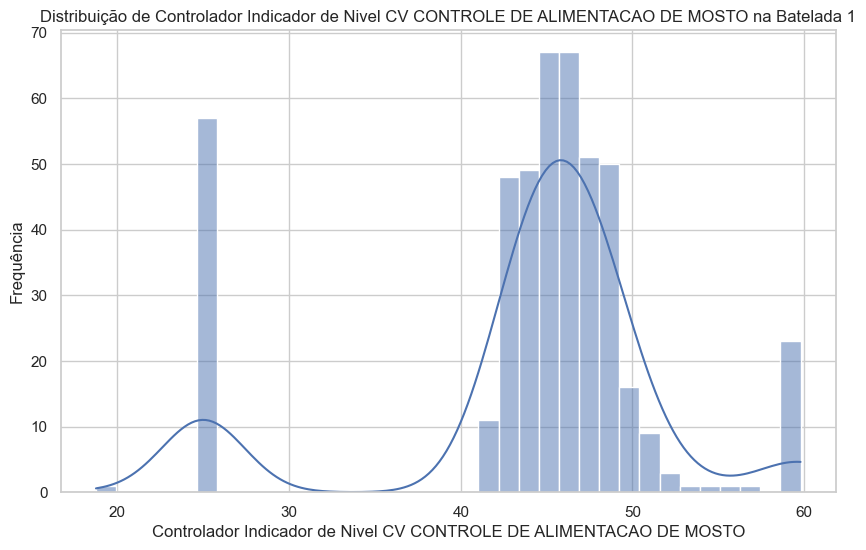

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

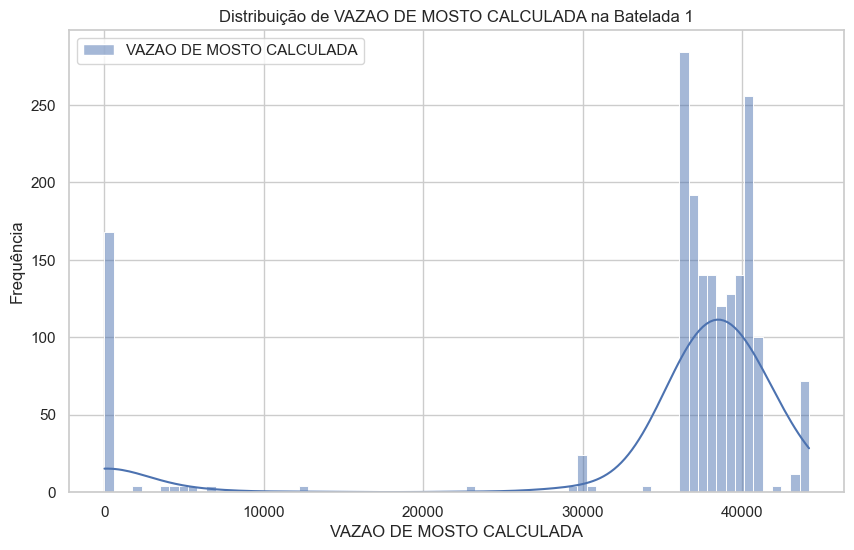

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


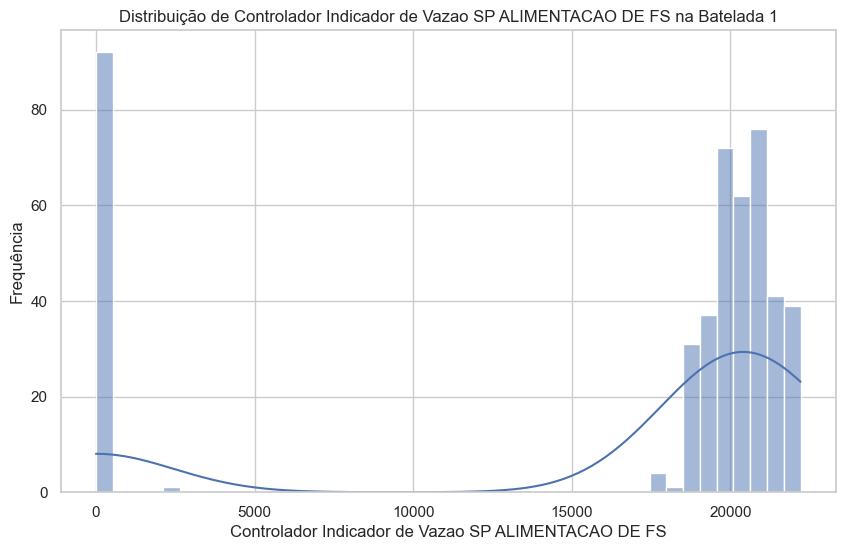

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


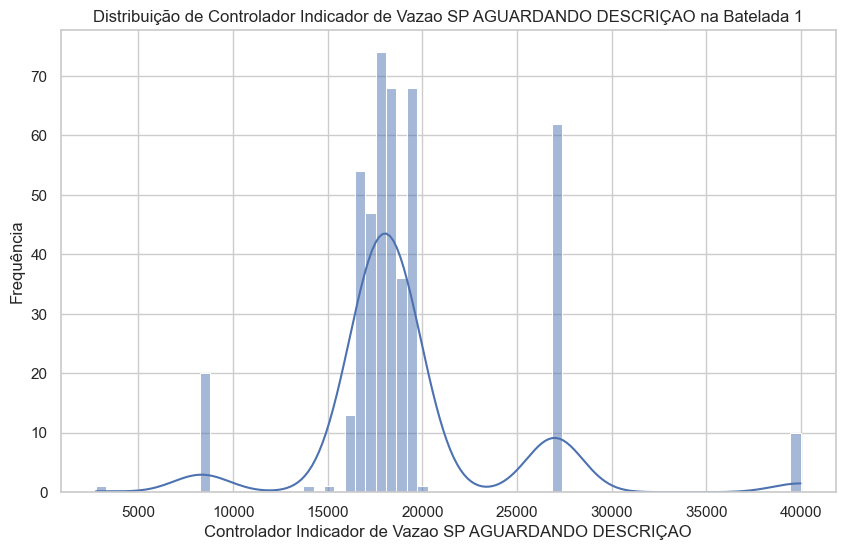

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


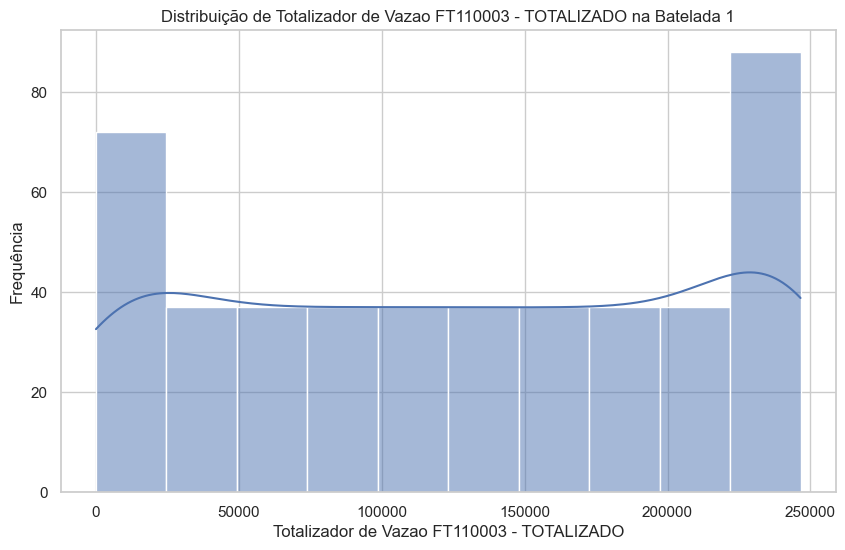

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


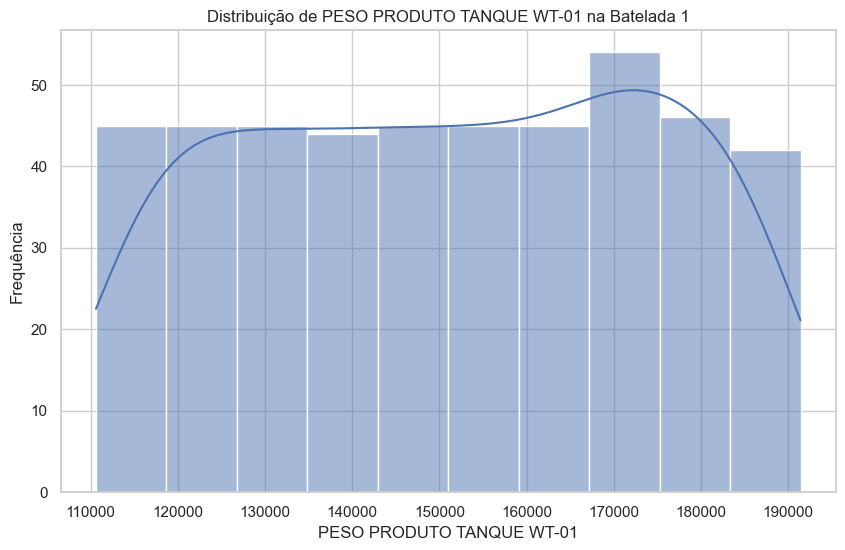

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


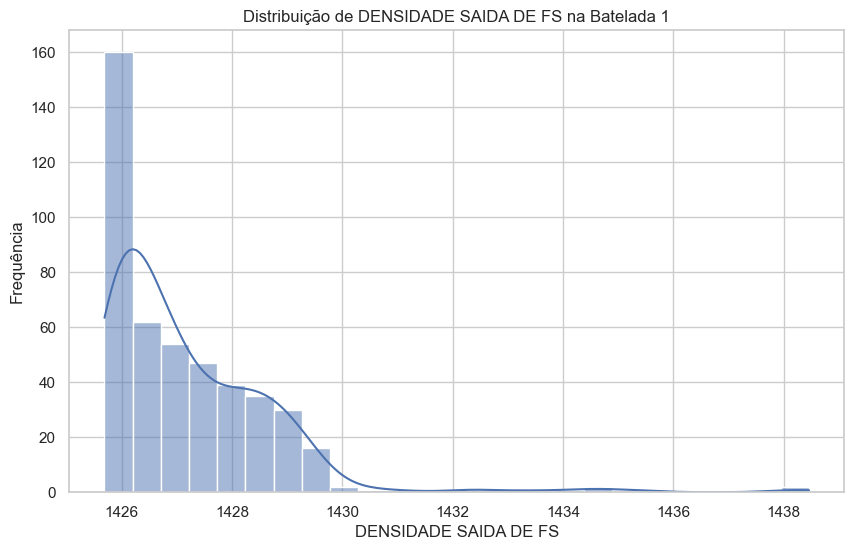

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


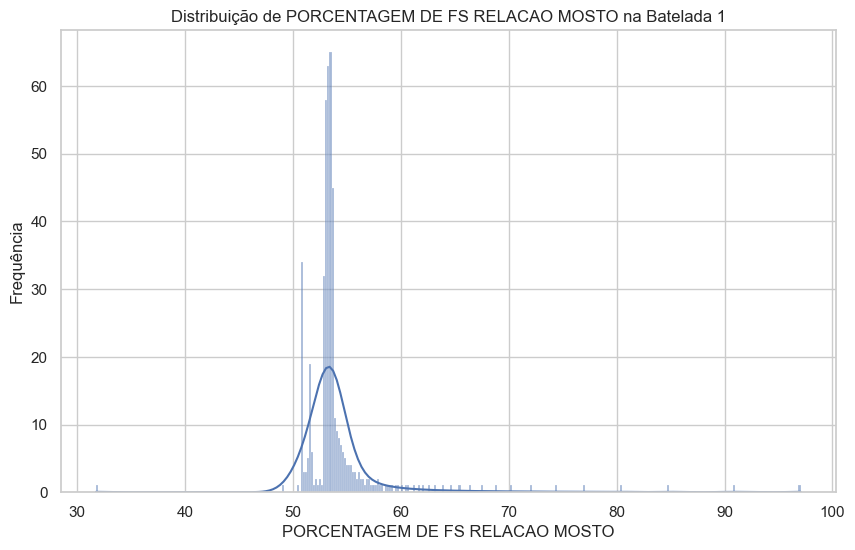

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


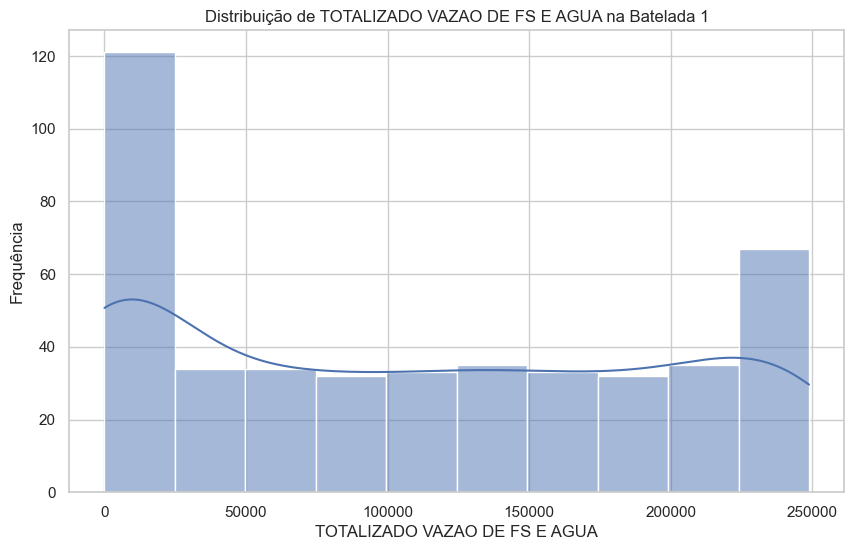

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


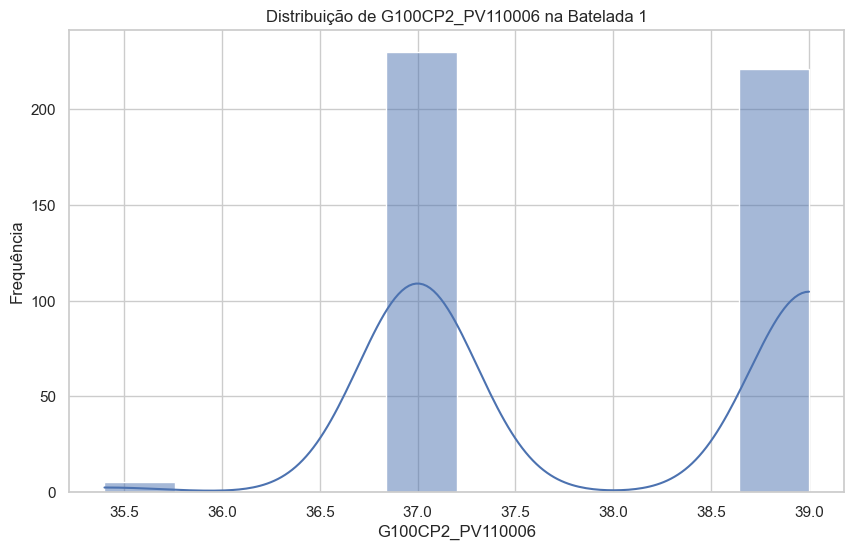

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


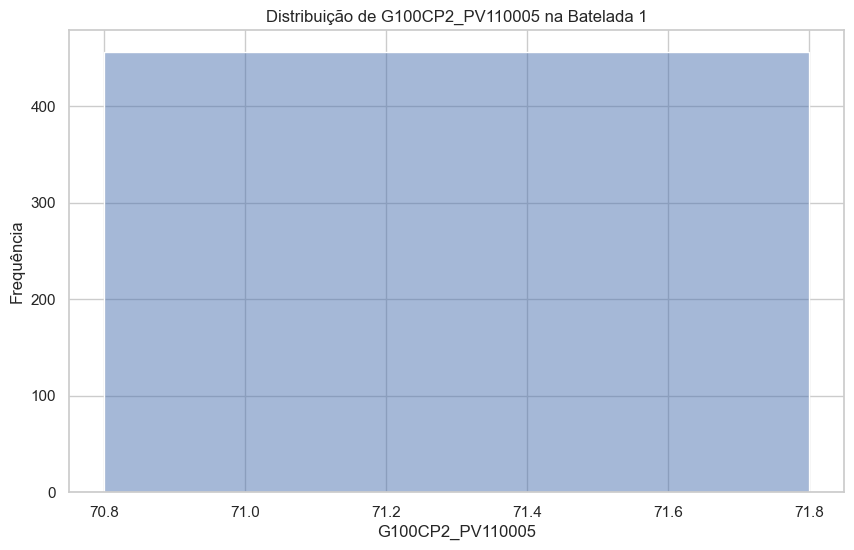

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


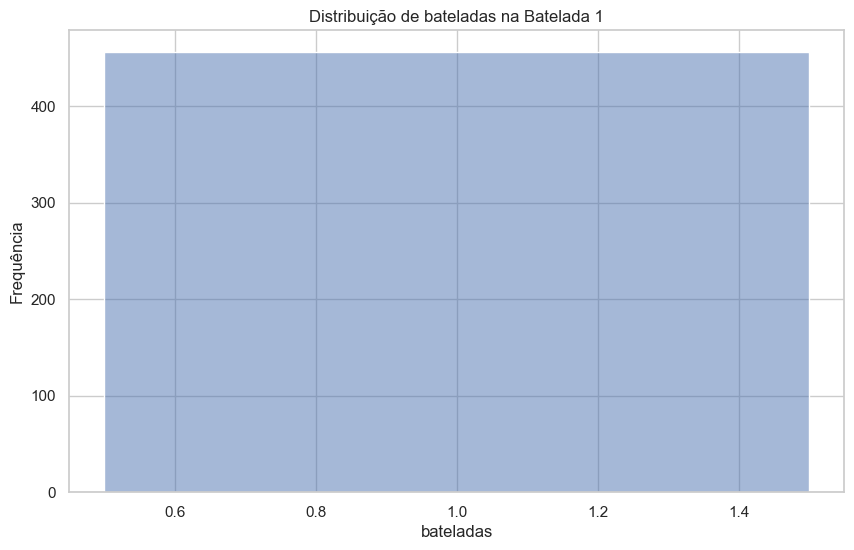

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


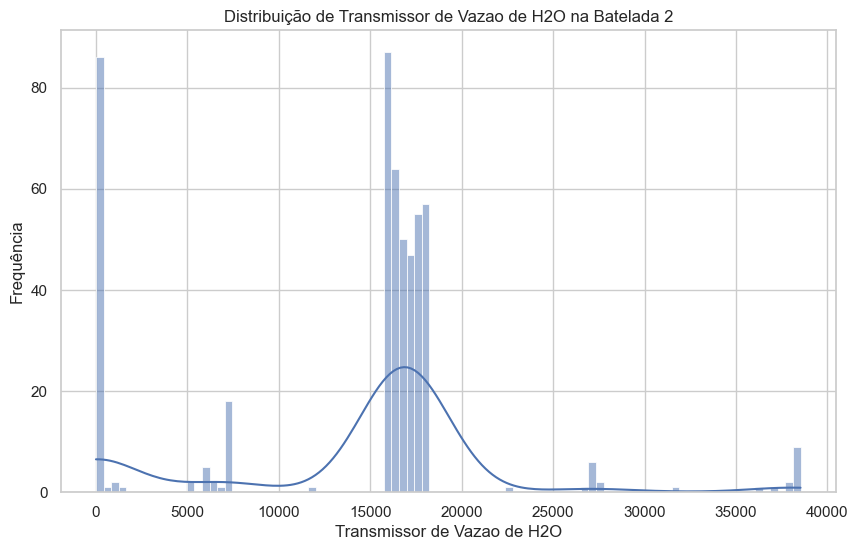

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


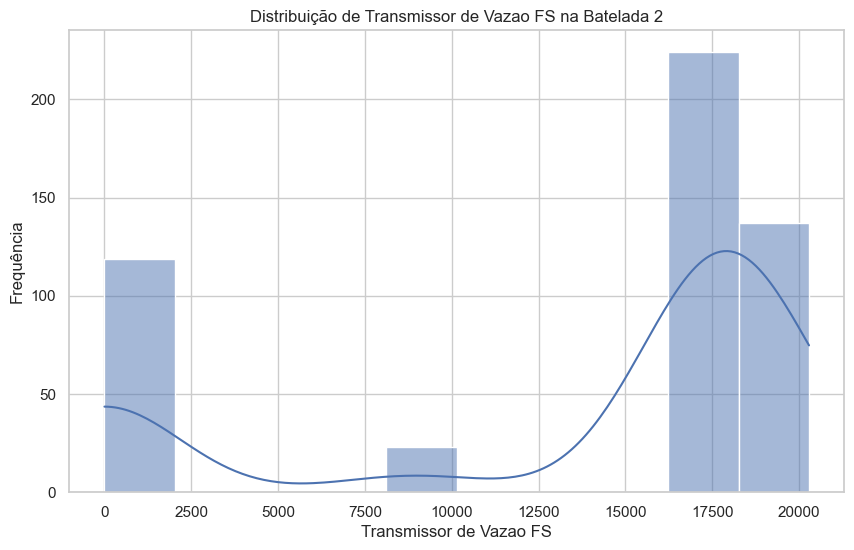

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


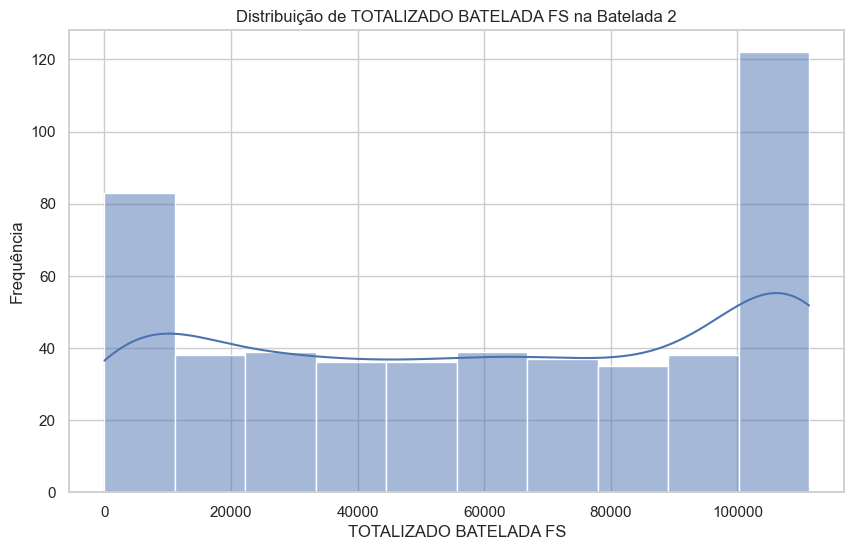

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


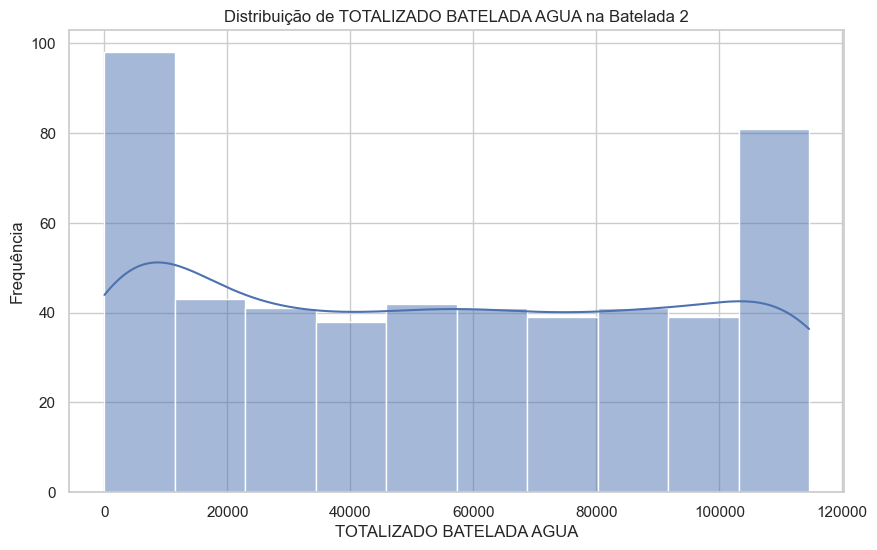

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

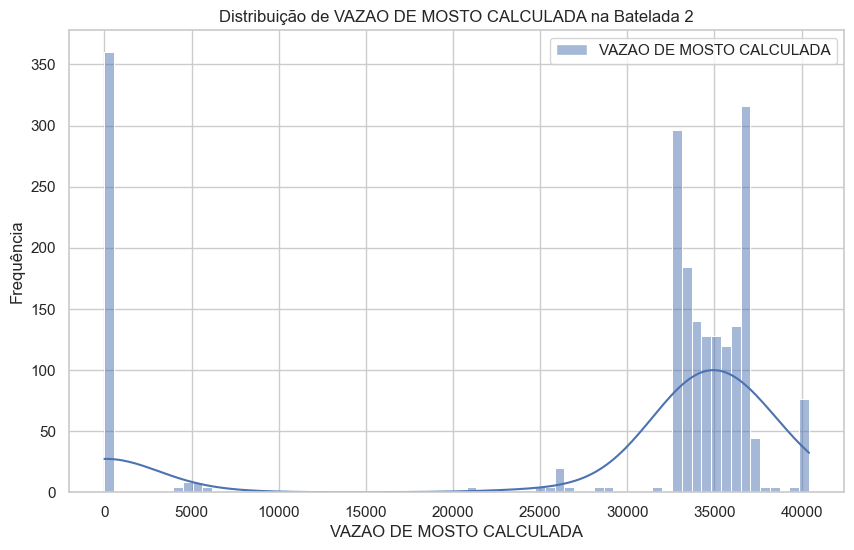

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


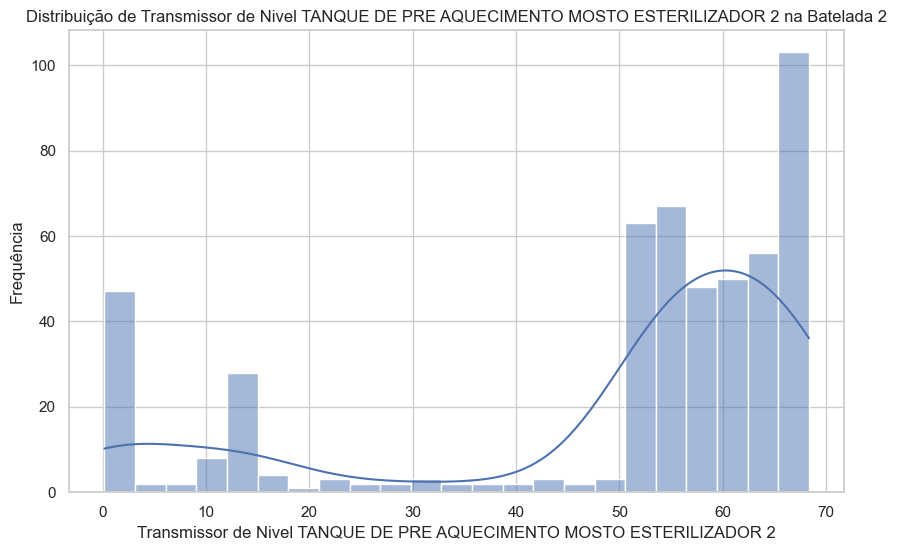

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


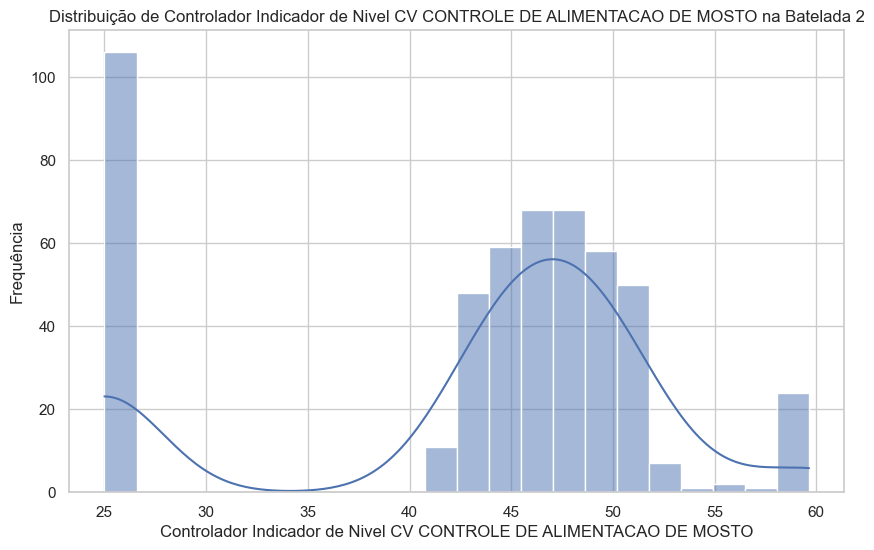

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

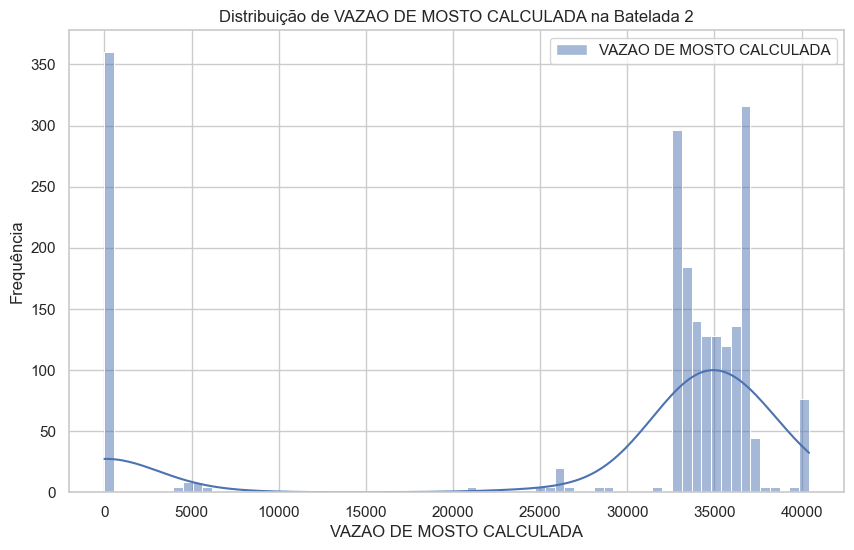

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


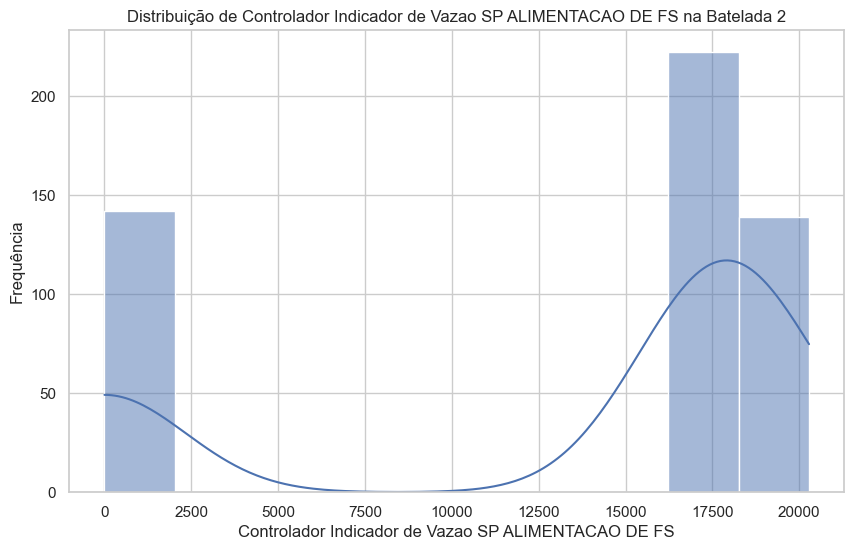

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


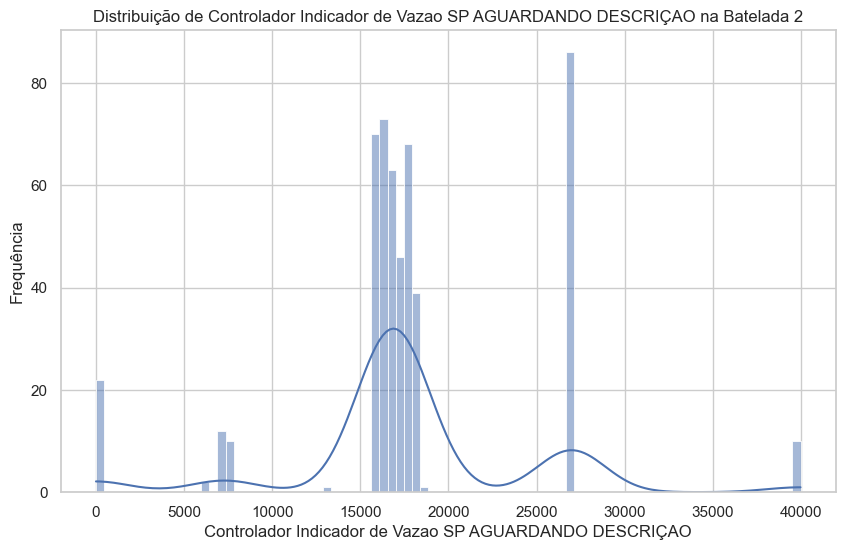

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


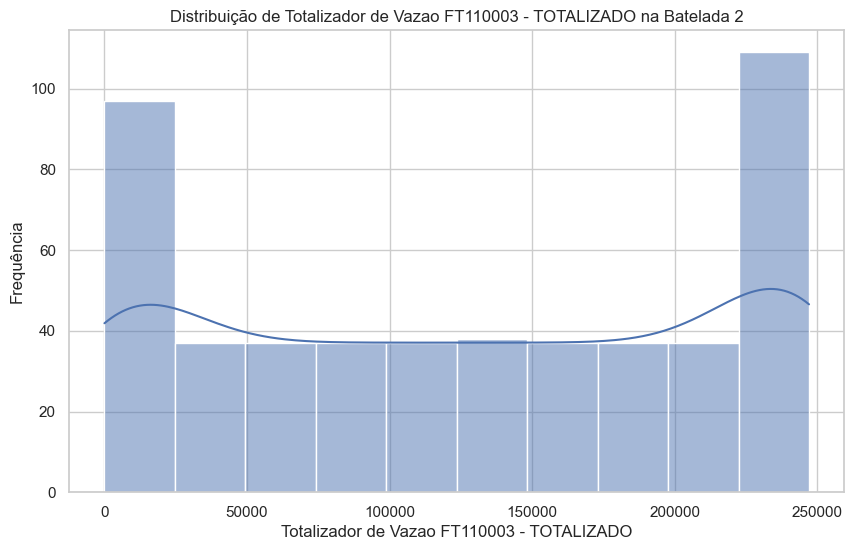

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


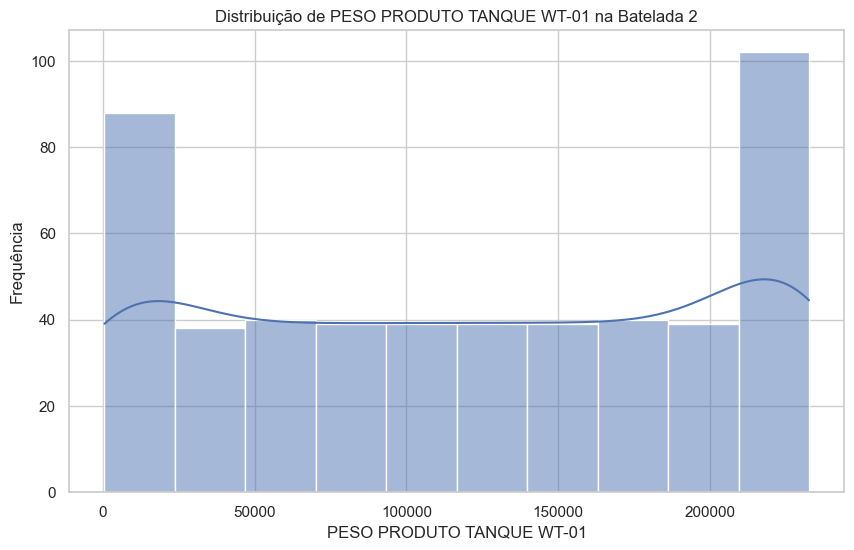

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


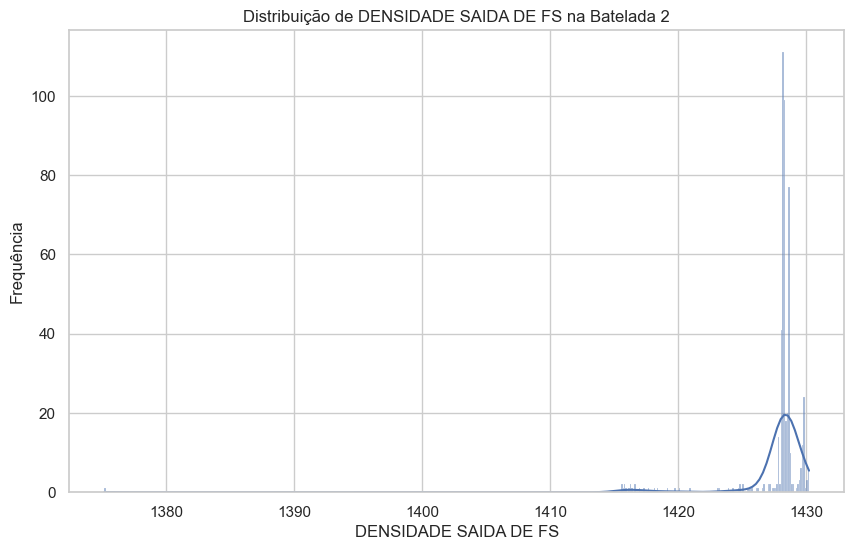

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


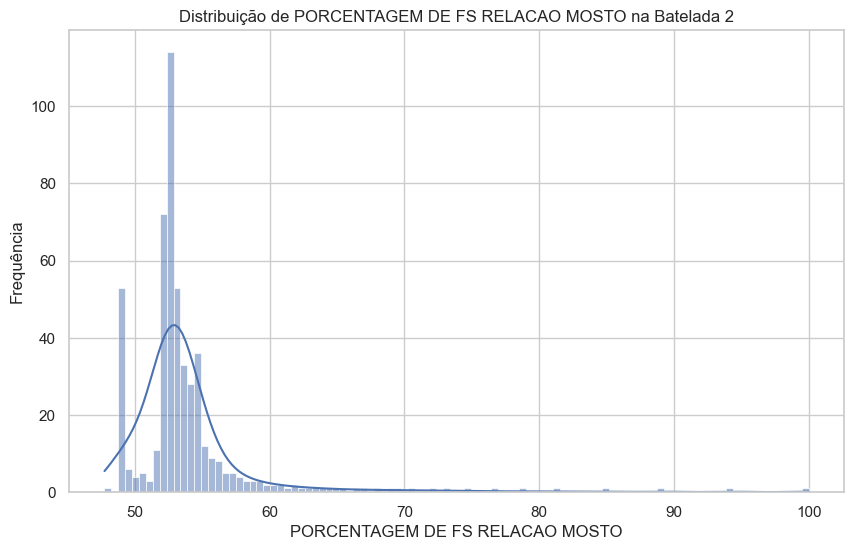

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


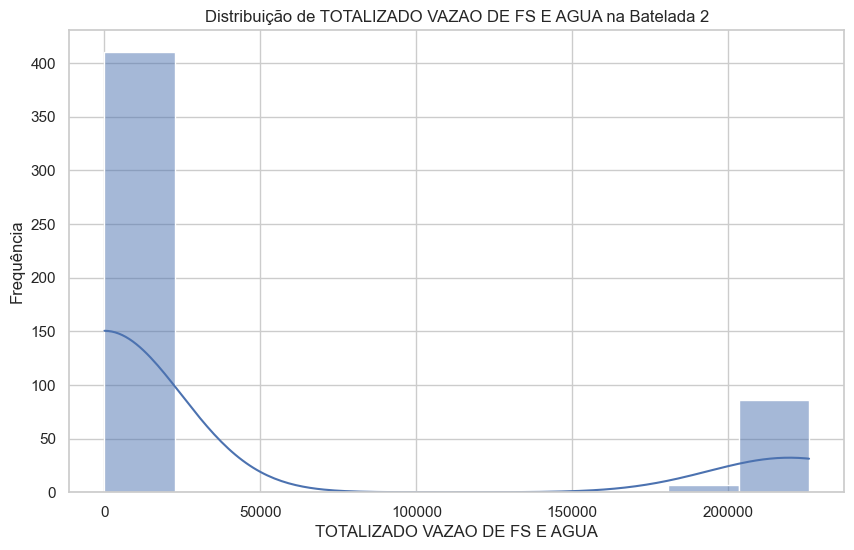

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


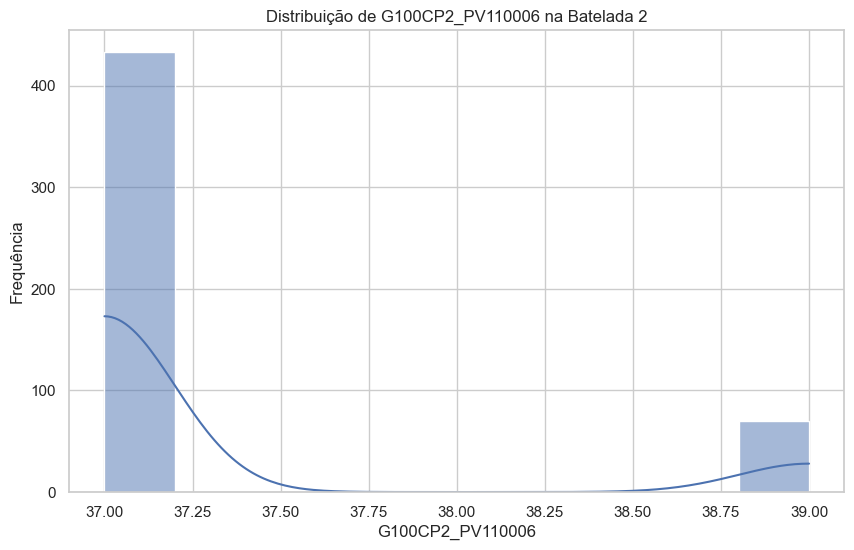

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


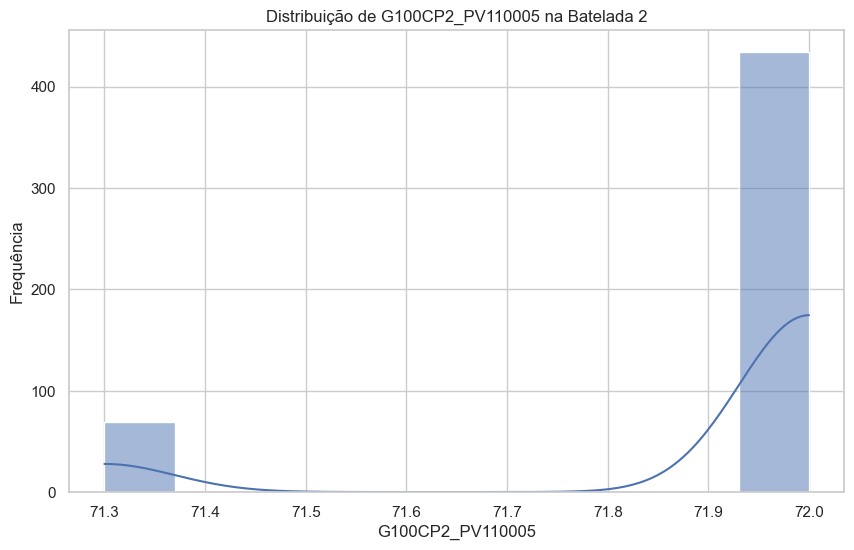

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


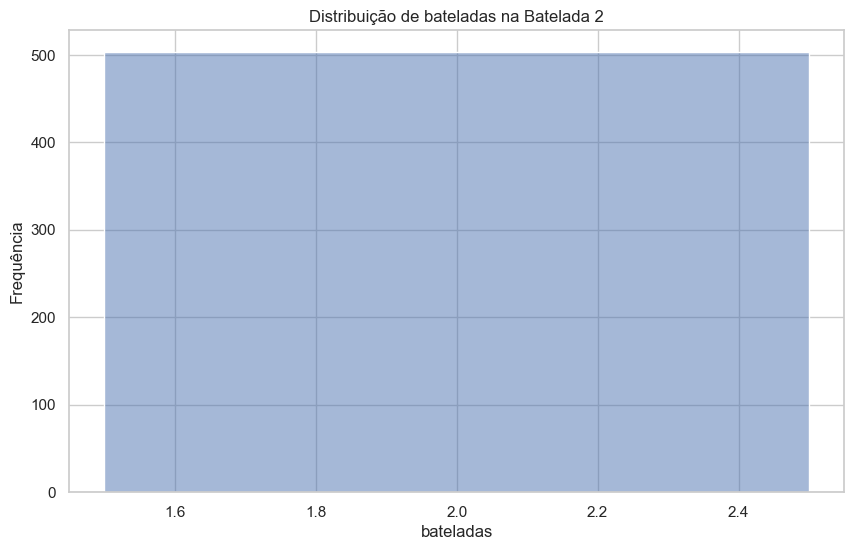

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


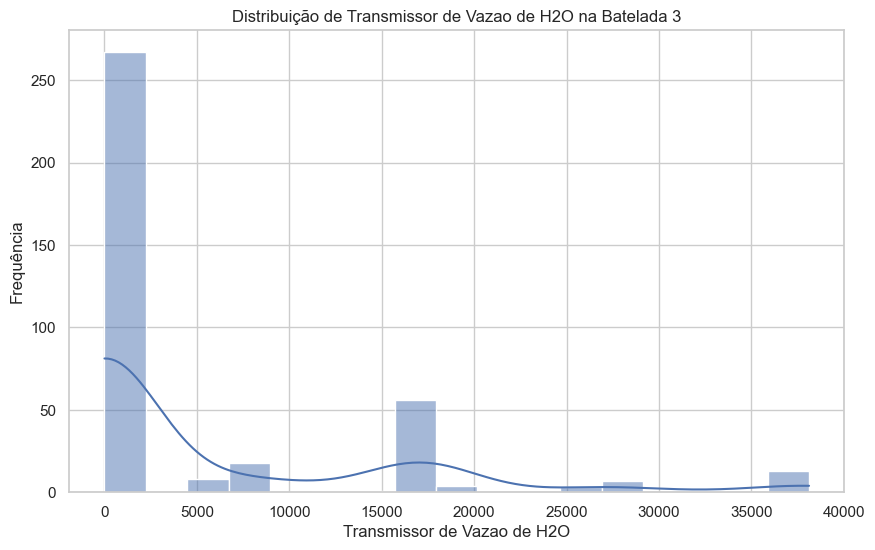

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


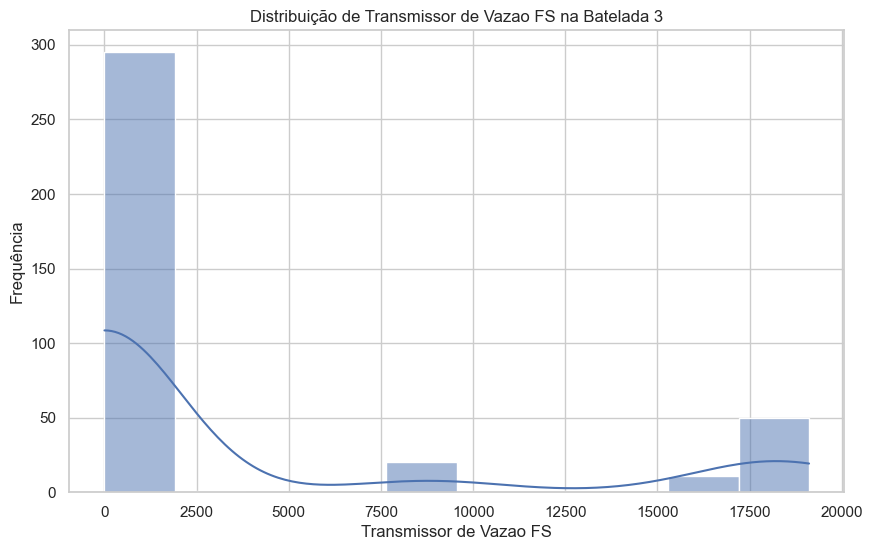

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


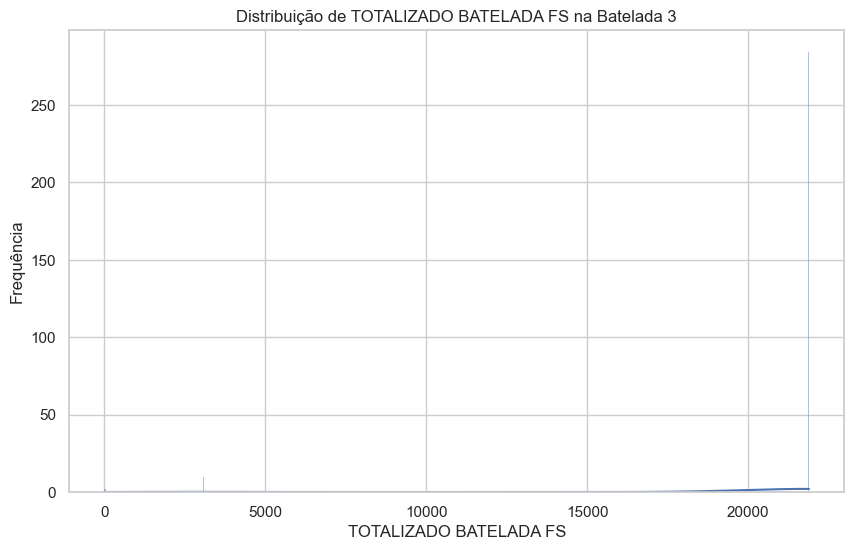

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


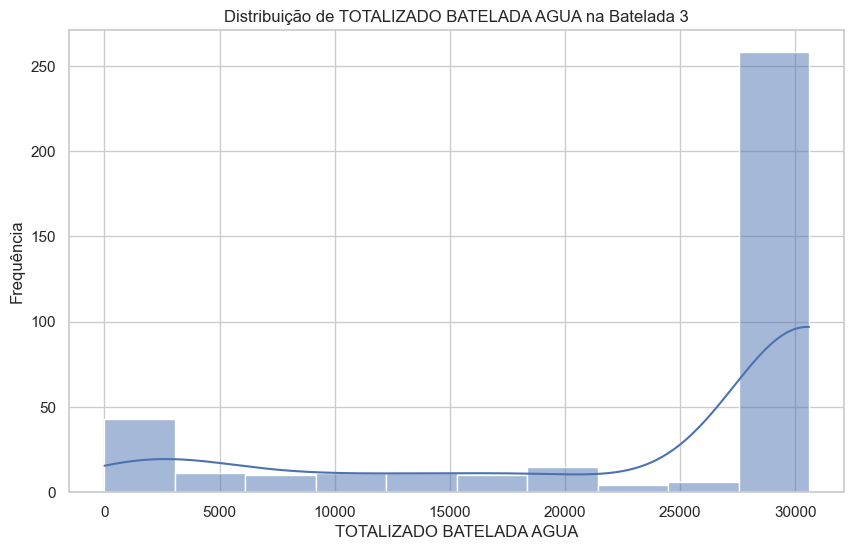

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

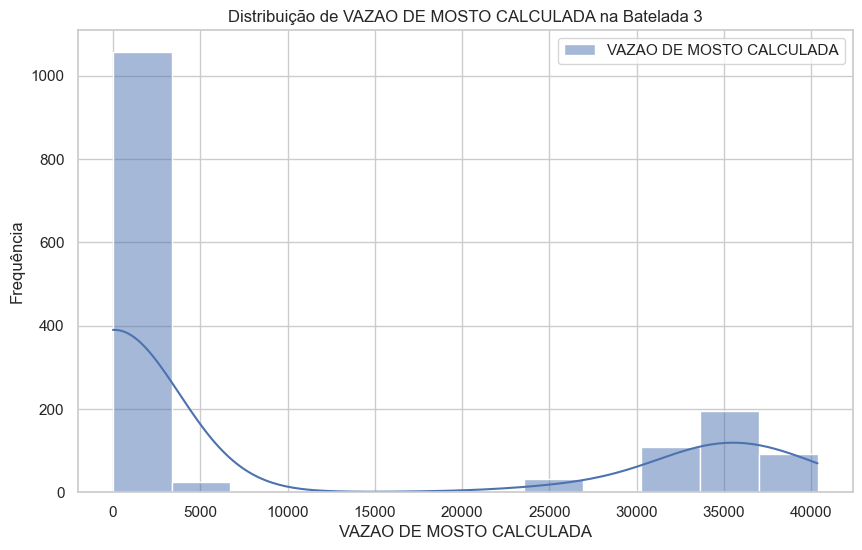

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


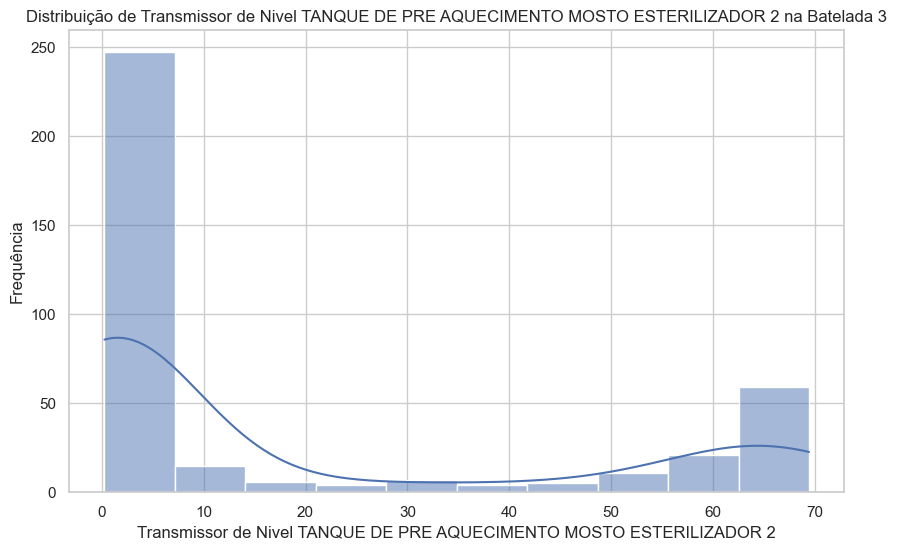

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


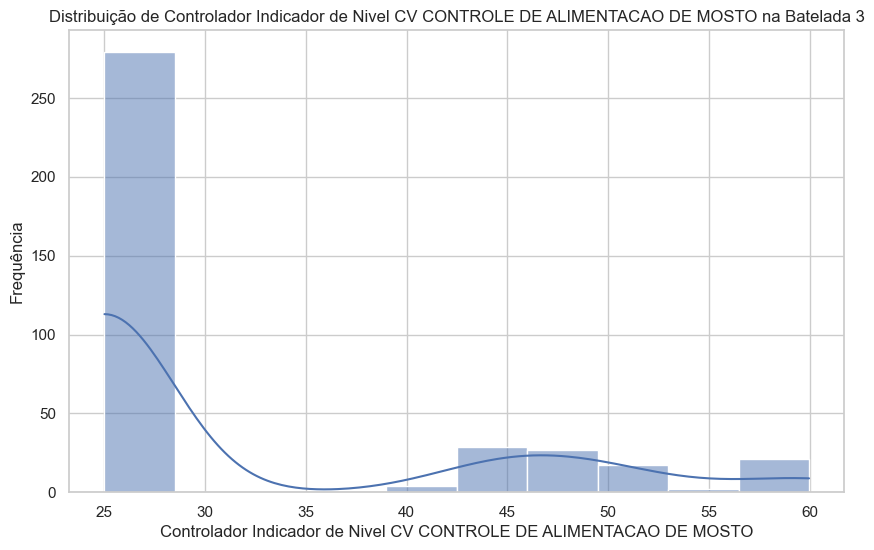

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

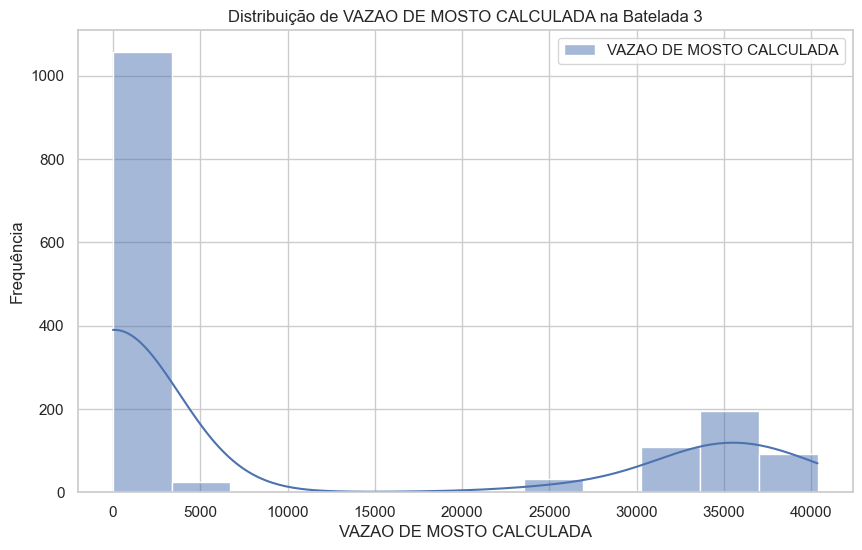

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


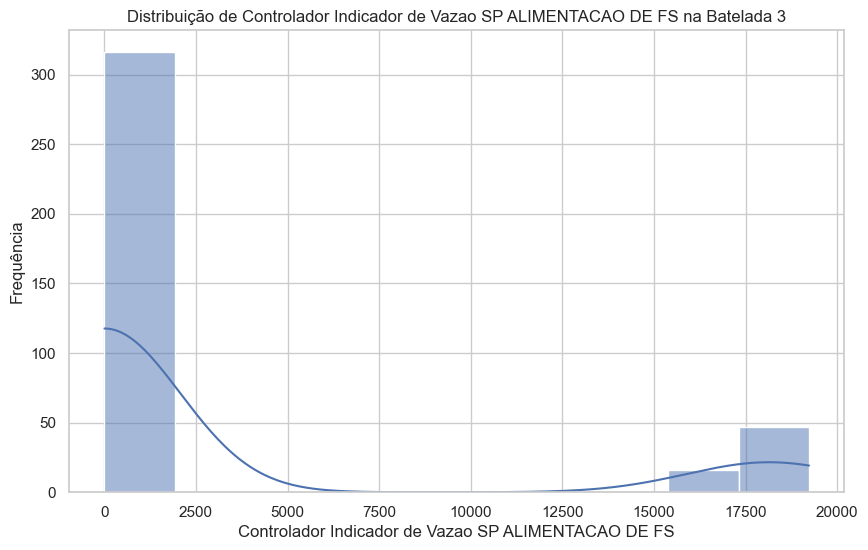

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


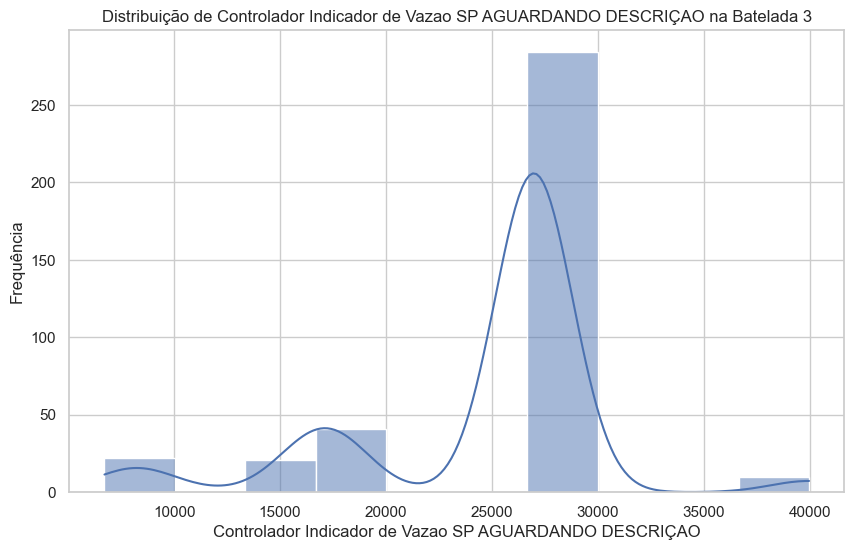

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


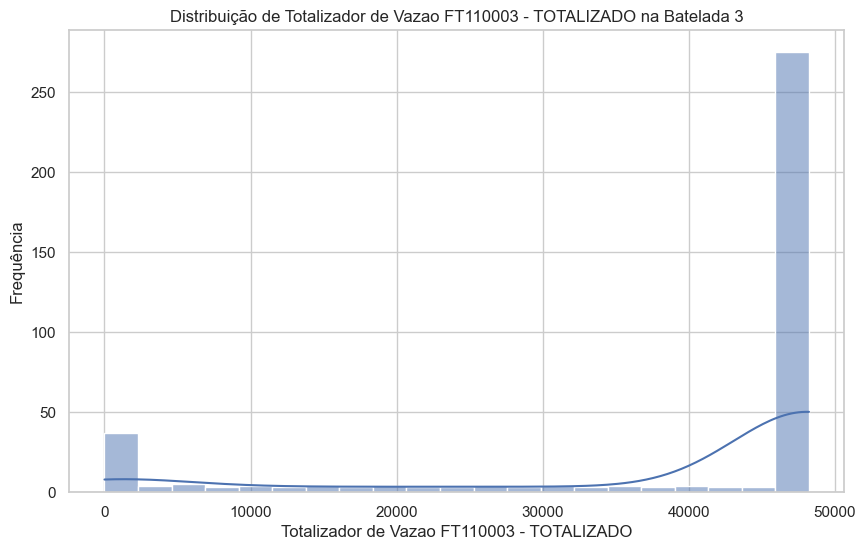

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


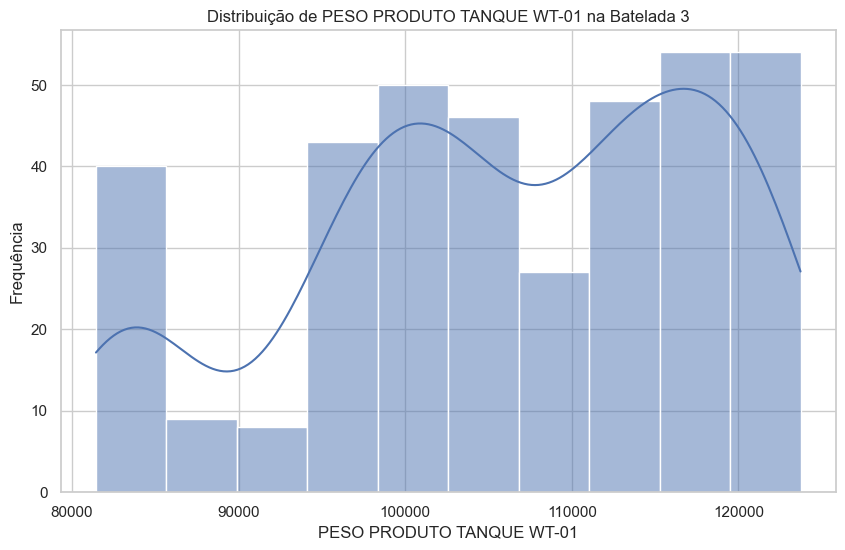

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


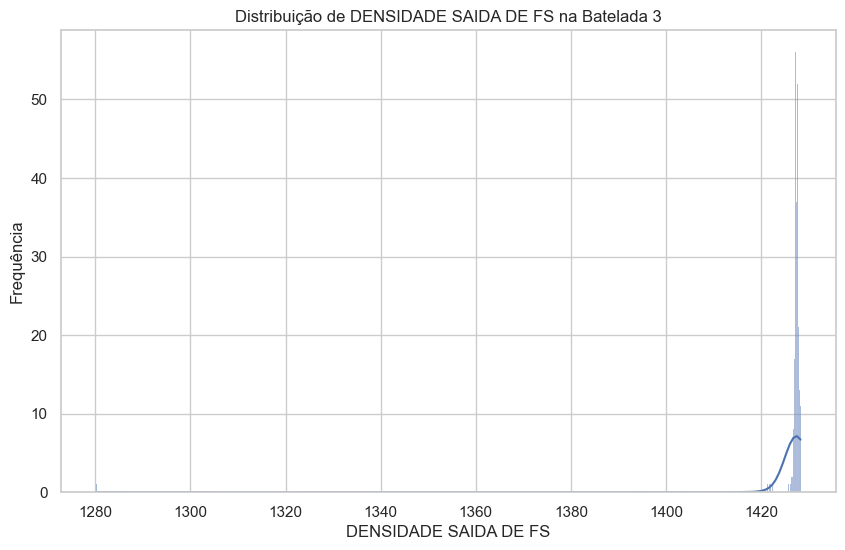

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


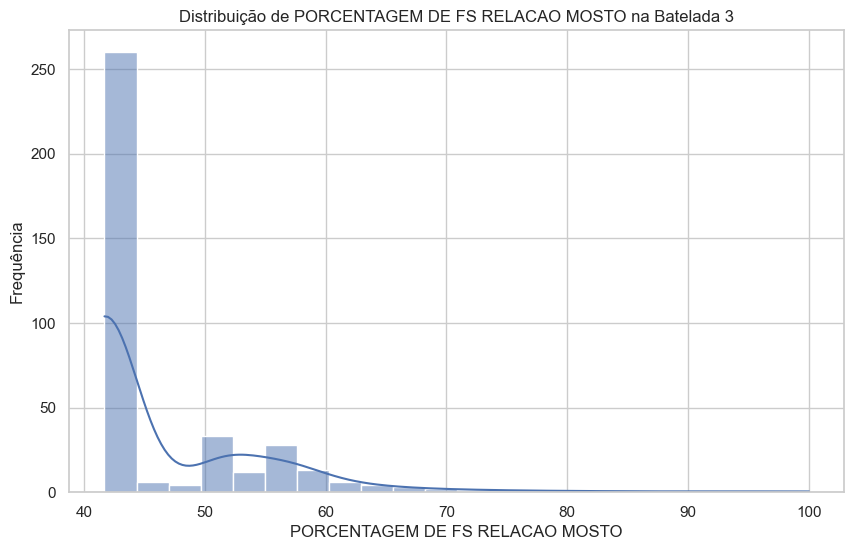

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


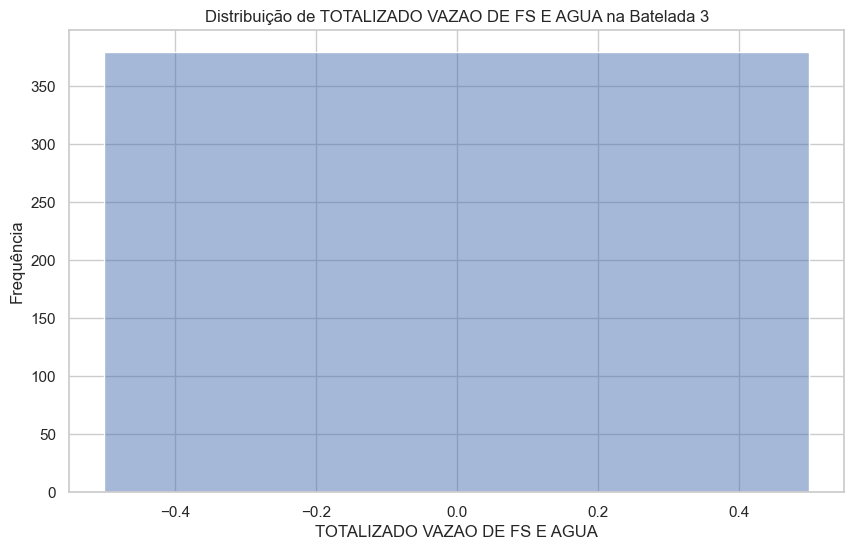

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


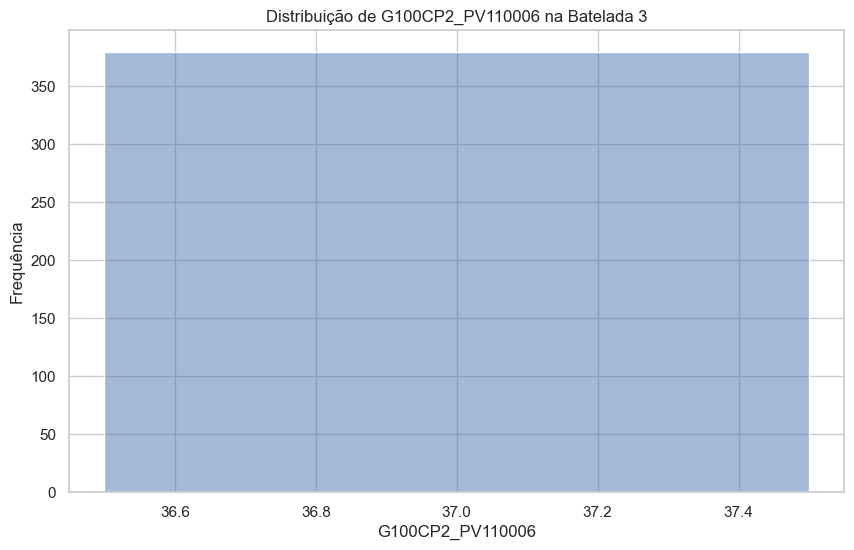

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


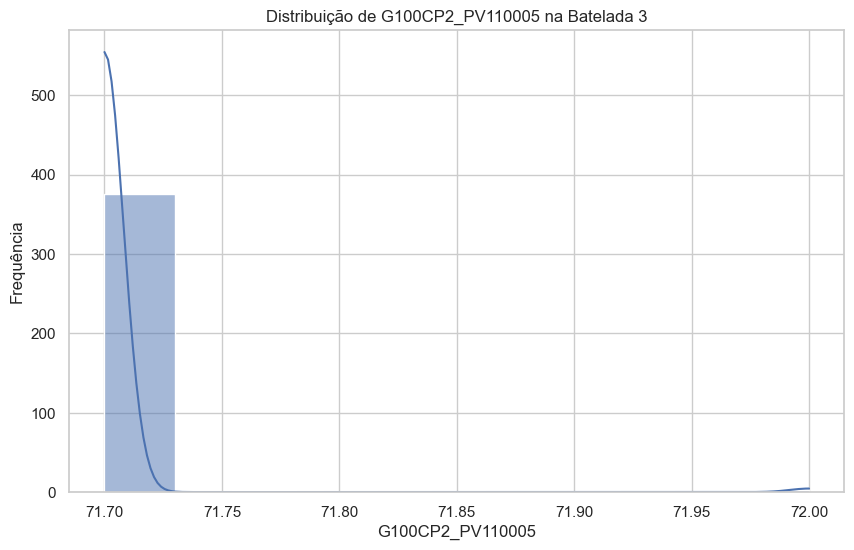

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


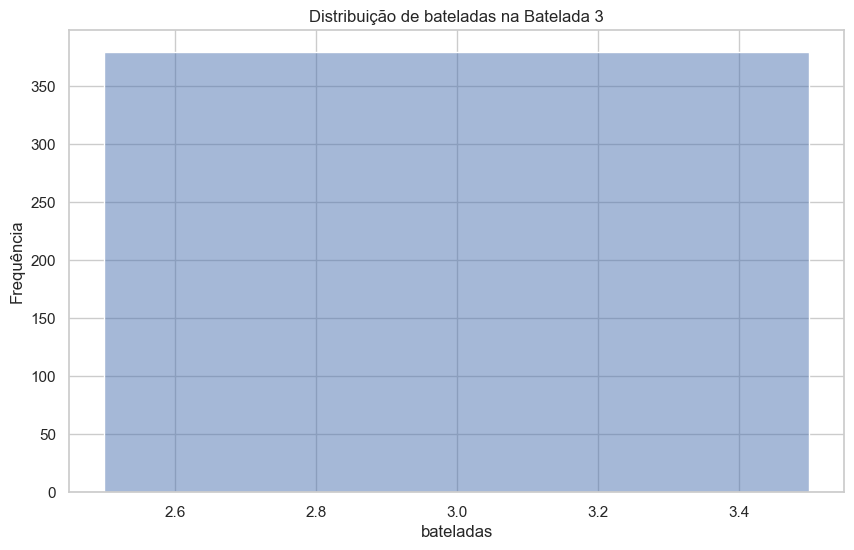

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


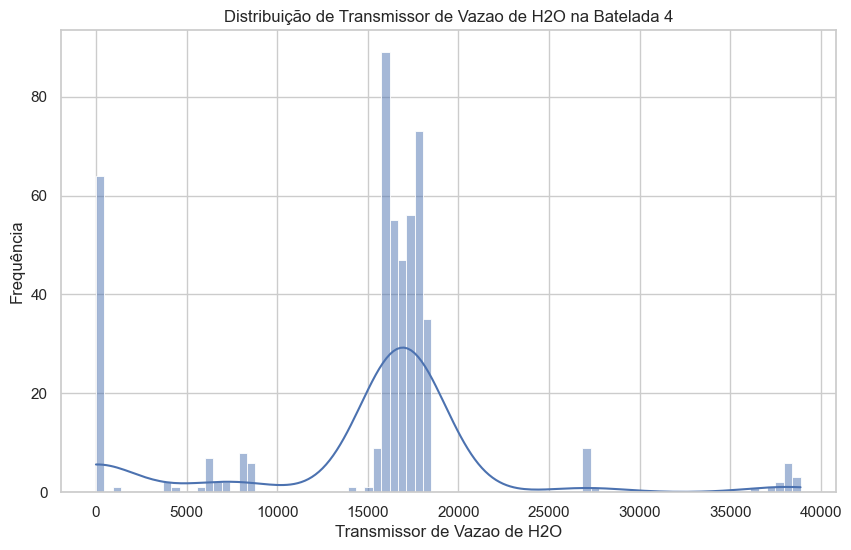

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


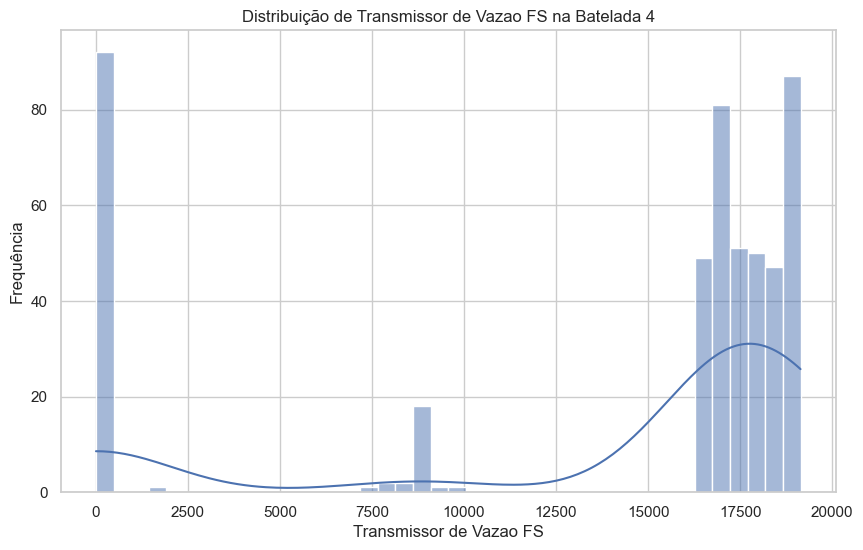

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


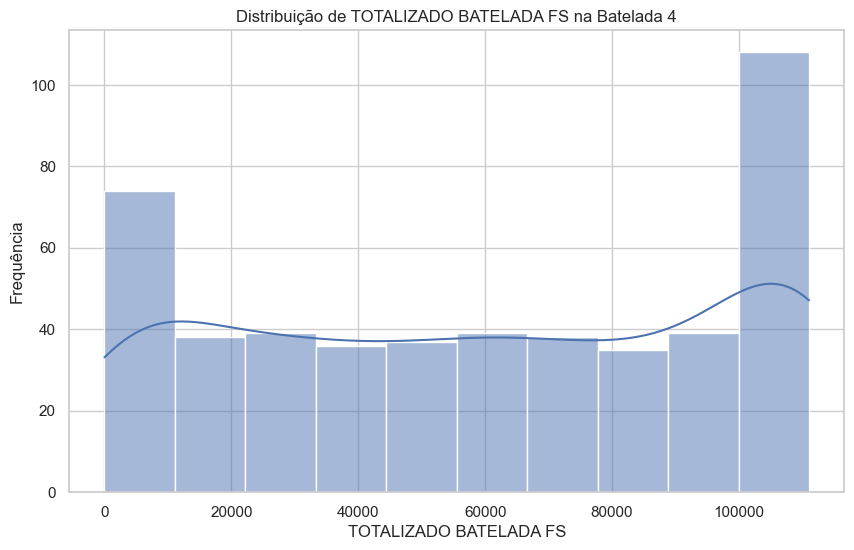

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


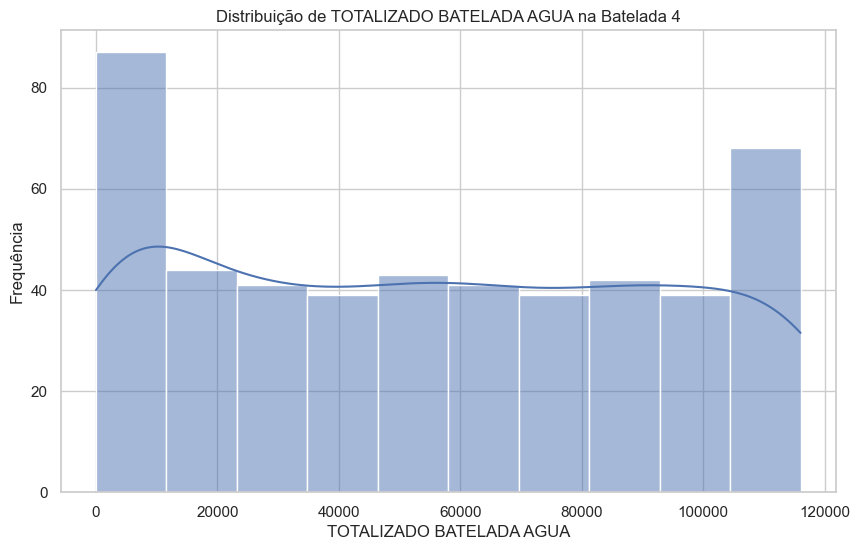

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

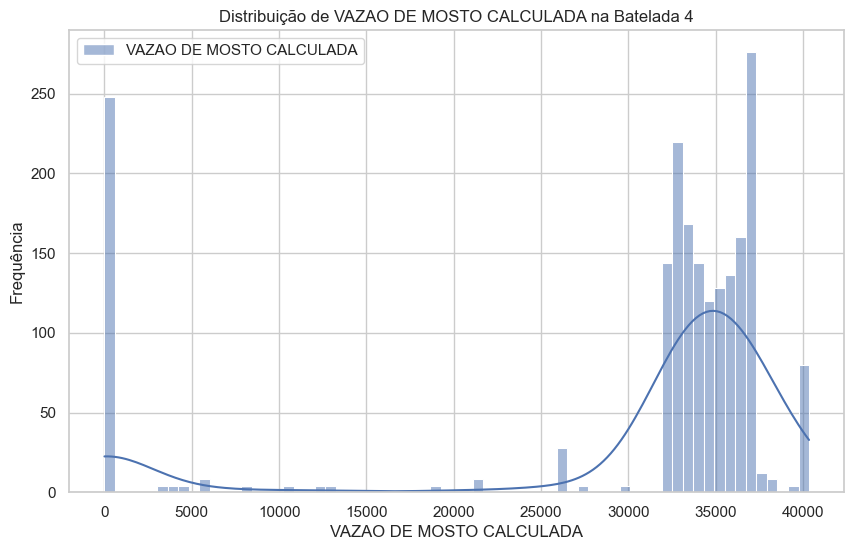

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


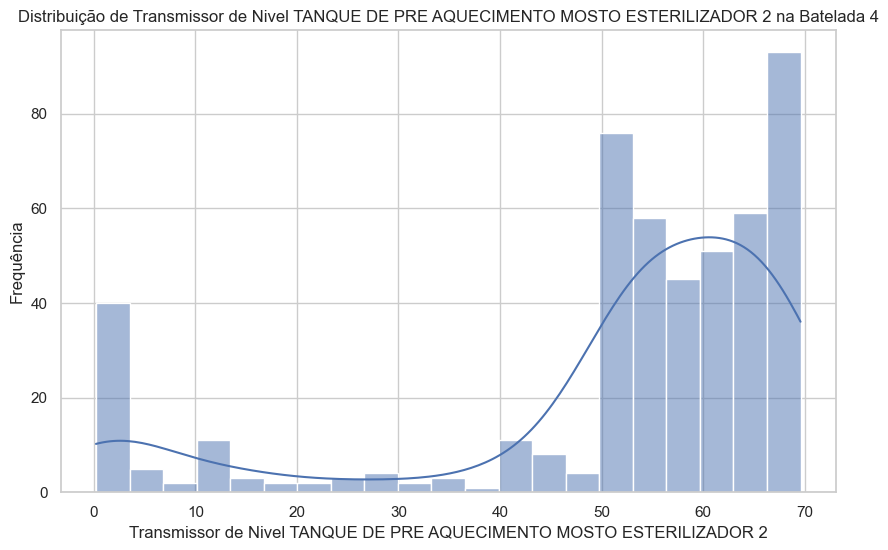

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


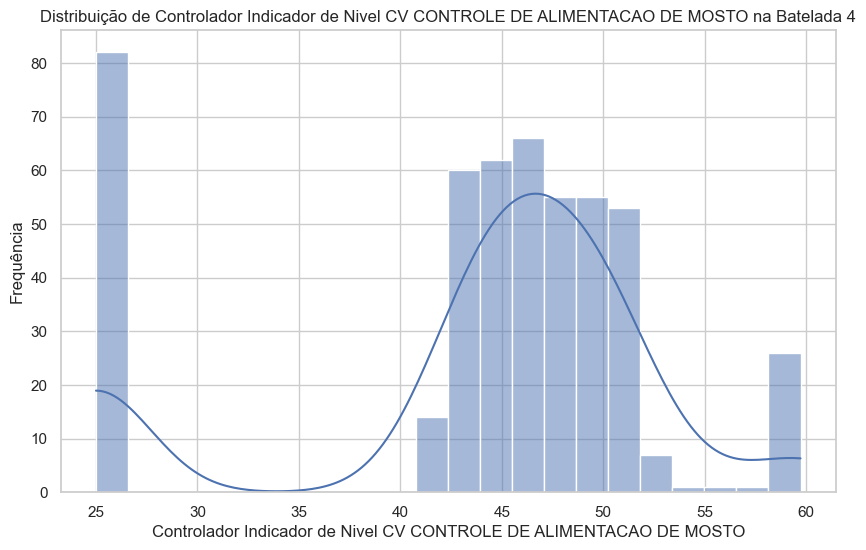

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

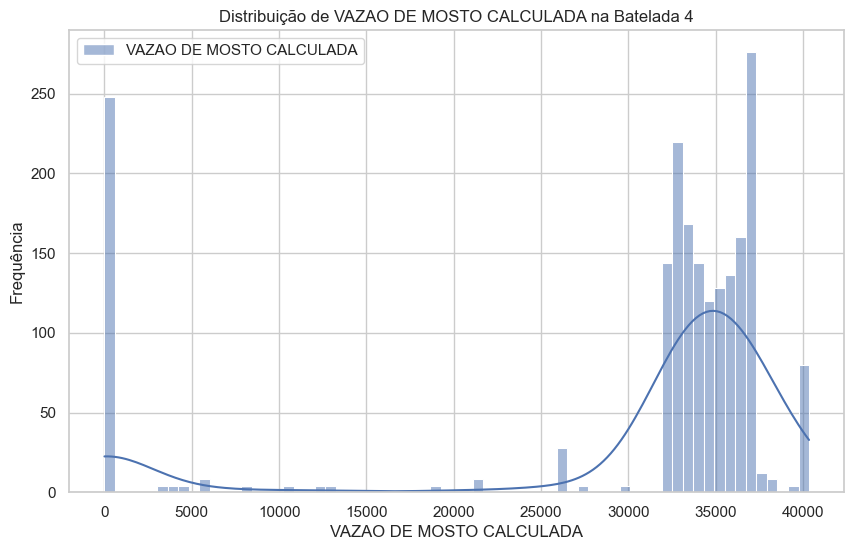

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


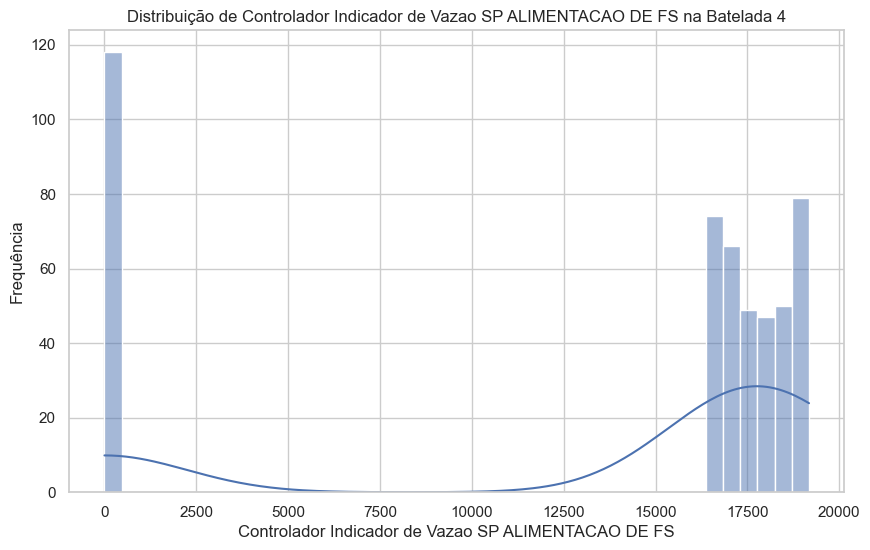

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


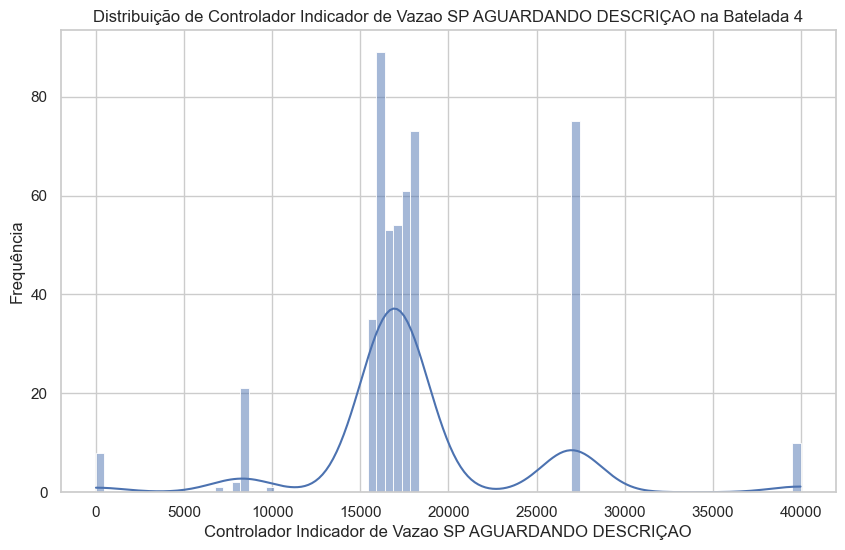

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


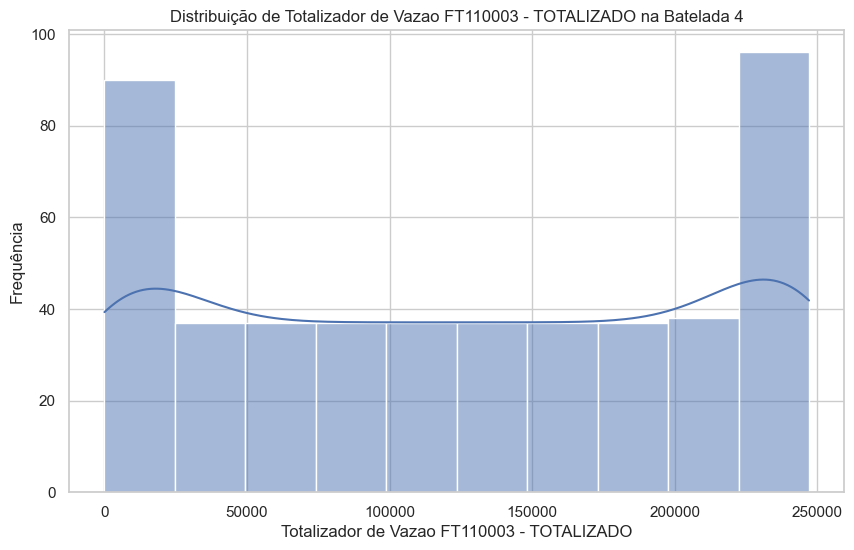

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


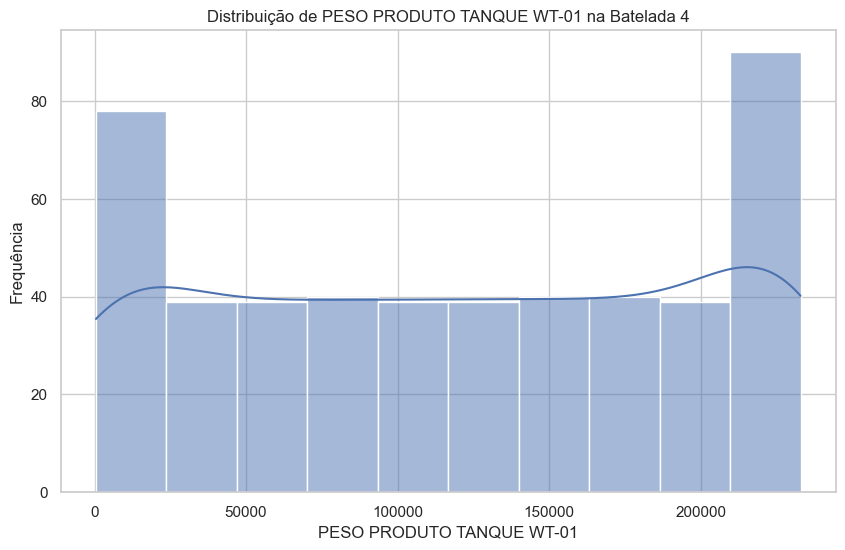

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


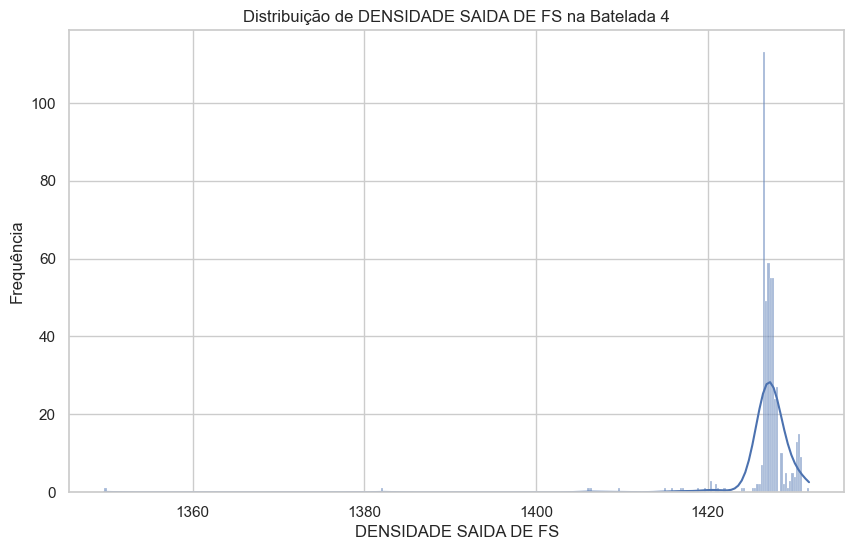

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


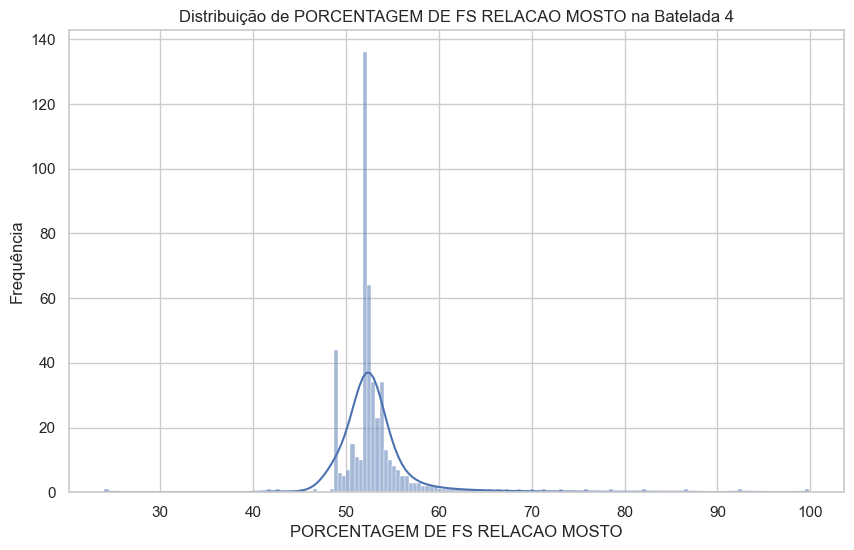

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


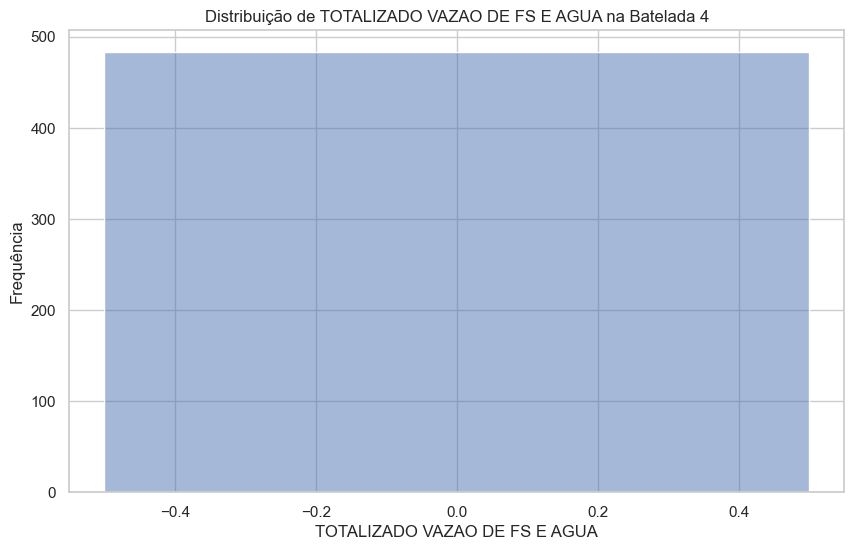

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


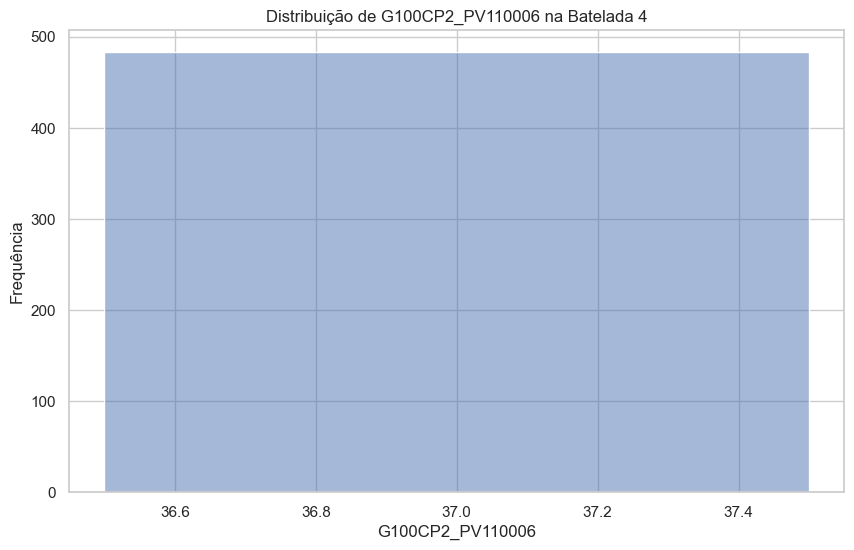

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


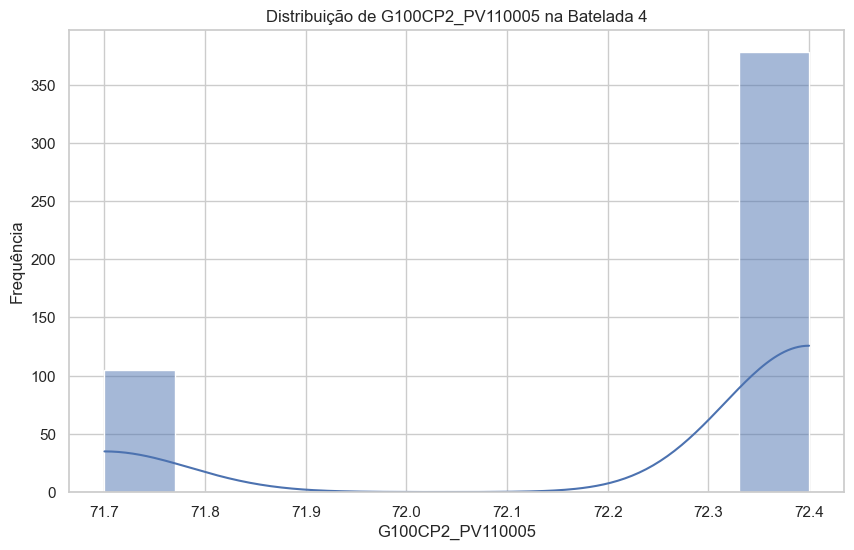

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


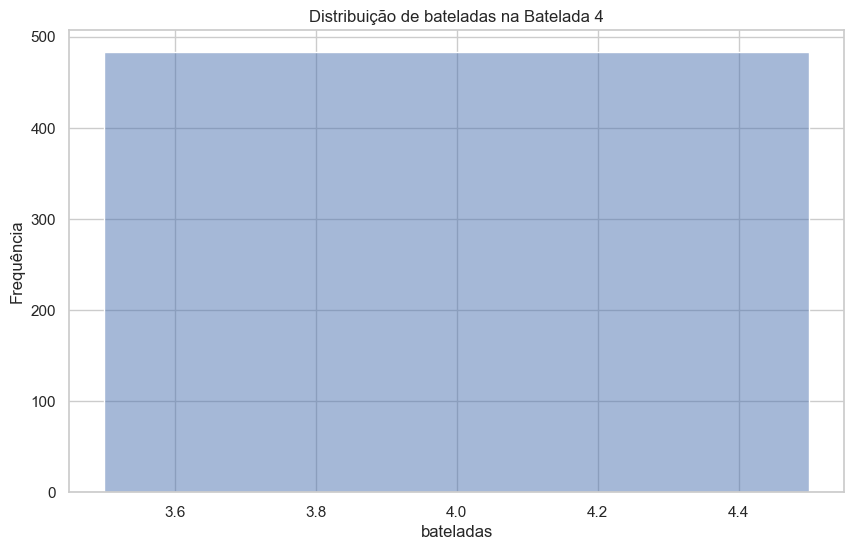

In [79]:
import matplotlib.pyplot as plt
import seaborn as sns

# Definir o estilo dos gráficos
sns.set(style="whitegrid")

# Iterar sobre as bateladas de 1 a 4
for batelada in [1, 2, 3, 4]:
    # Filtrar os dados da batelada atual
    df_batelada = df[df['bateladas'] == batelada]
    
    # Plotar histogramas para cada coluna numérica
    for column in df_batelada.select_dtypes(include=['float64', 'int64']).columns:
        plt.figure(figsize=(10, 6))
        sns.histplot(df_batelada[column], kde=True)
        plt.title(f'Distribuição de {column} na Batelada {batelada}')
        plt.xlabel(column)
        plt.ylabel('Frequência')
        plt.show()


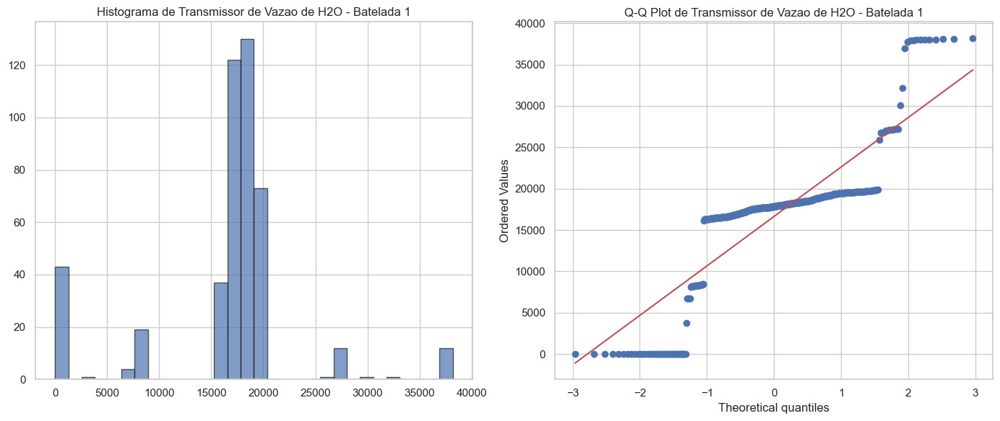


Testes de Normalidade para a coluna: Transmissor de Vazao de H2O - Batelada 1
Shapiro-Wilk Test: Estatística=0.7307, p-valor=0.0000
Anderson-Darling Test: Estatística=56.7579, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.3320, p-valor=0.0000


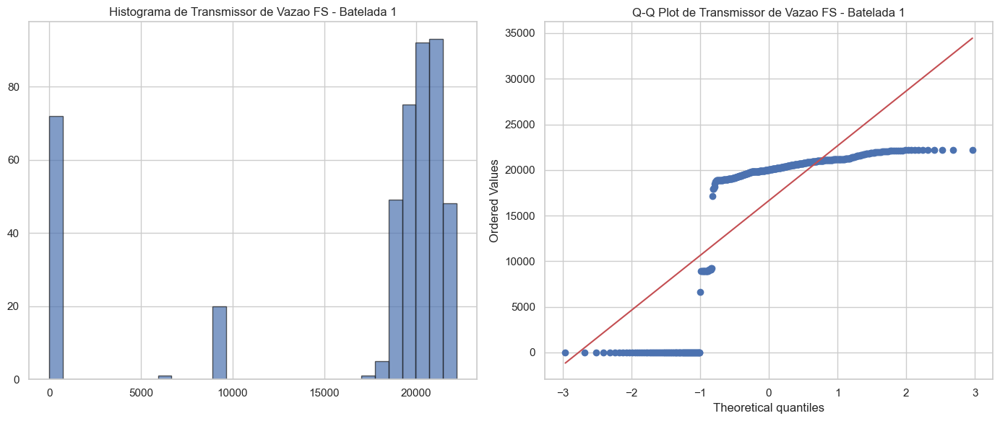


Testes de Normalidade para a coluna: Transmissor de Vazao FS - Batelada 1
Shapiro-Wilk Test: Estatística=0.6093, p-valor=0.0000
Anderson-Darling Test: Estatística=83.1902, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.3920, p-valor=0.0000


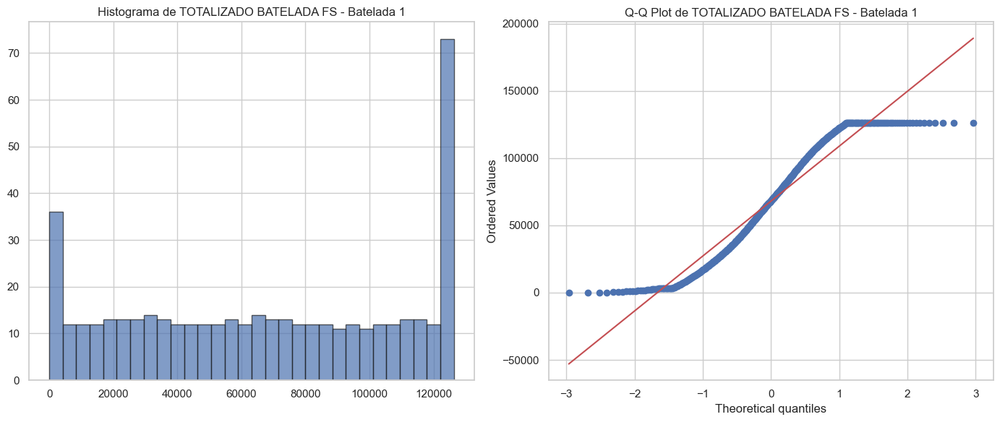


Testes de Normalidade para a coluna: TOTALIZADO BATELADA FS - Batelada 1
Shapiro-Wilk Test: Estatística=0.9225, p-valor=0.0000
Anderson-Darling Test: Estatística=9.1698, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.0838, p-valor=0.0031


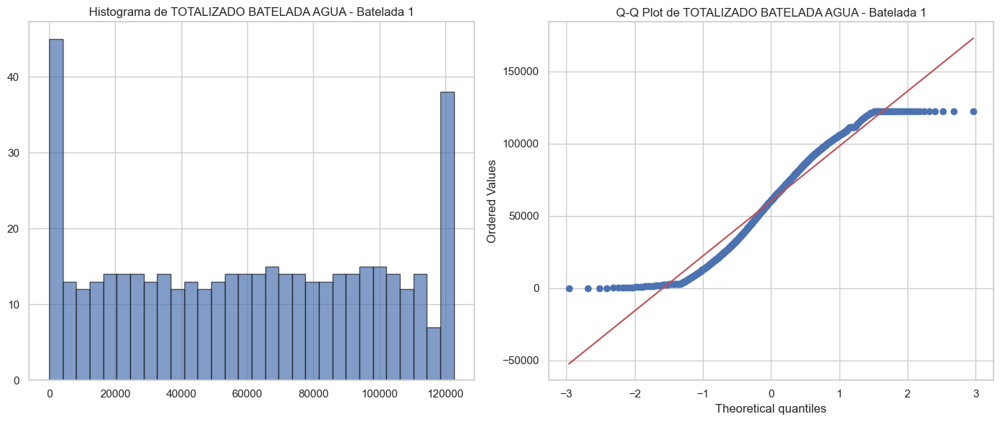


Testes de Normalidade para a coluna: TOTALIZADO BATELADA AGUA - Batelada 1
Shapiro-Wilk Test: Estatística=0.9411, p-valor=0.0000
Anderson-Darling Test: Estatística=6.4068, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.0669, p-valor=0.0323


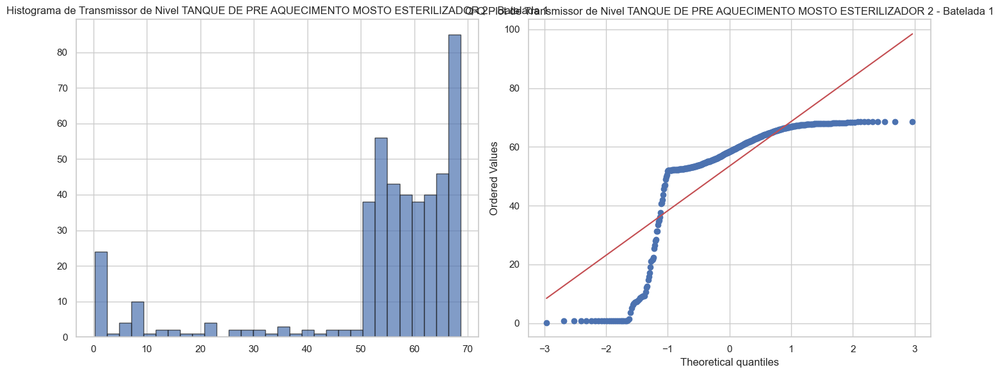


Testes de Normalidade para a coluna: Transmissor de Nivel TANQUE DE PRE AQUECIMENTO MOSTO ESTERILIZADOR 2 - Batelada 1
Shapiro-Wilk Test: Estatística=0.6946, p-valor=0.0000
Anderson-Darling Test: Estatística=50.8998, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.3102, p-valor=0.0000


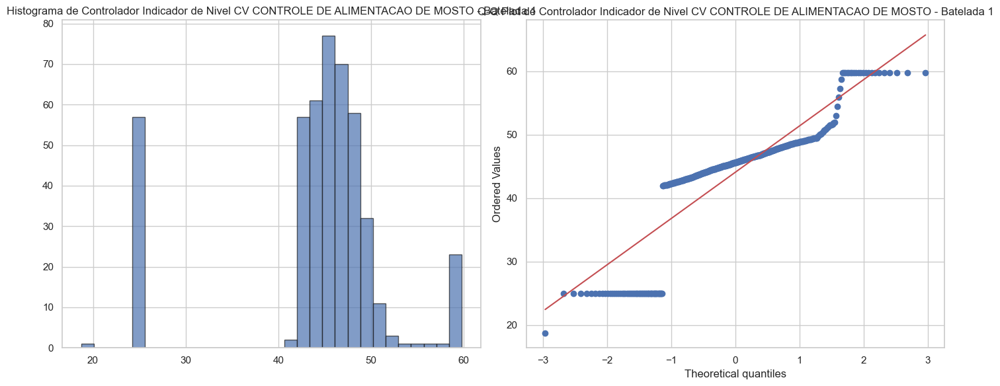


Testes de Normalidade para a coluna: Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO - Batelada 1
Shapiro-Wilk Test: Estatística=0.7782, p-valor=0.0000
Anderson-Darling Test: Estatística=43.6056, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.2716, p-valor=0.0000


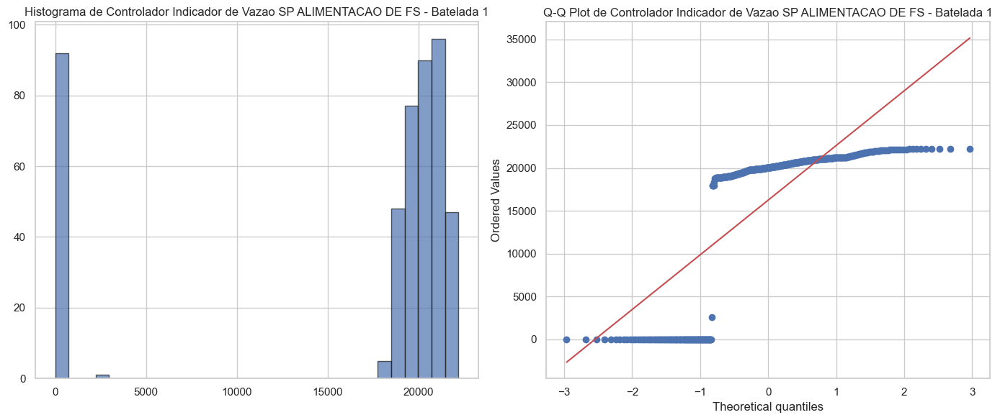


Testes de Normalidade para a coluna: Controlador Indicador de Vazao SP ALIMENTACAO DE FS - Batelada 1
Shapiro-Wilk Test: Estatística=0.5886, p-valor=0.0000
Anderson-Darling Test: Estatística=91.1705, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.4063, p-valor=0.0000


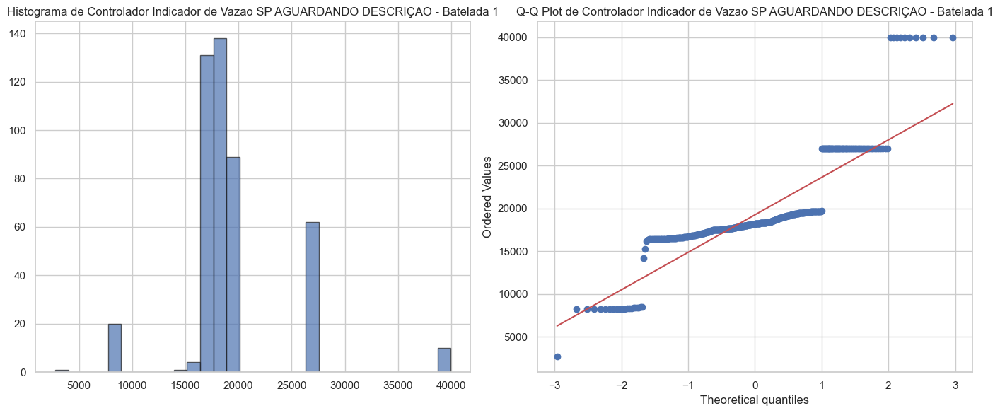


Testes de Normalidade para a coluna: Controlador Indicador de Vazao SP AGUARDANDO DESCRIÇAO - Batelada 1
Shapiro-Wilk Test: Estatística=0.7485, p-valor=0.0000
Anderson-Darling Test: Estatística=45.8662, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.3059, p-valor=0.0000


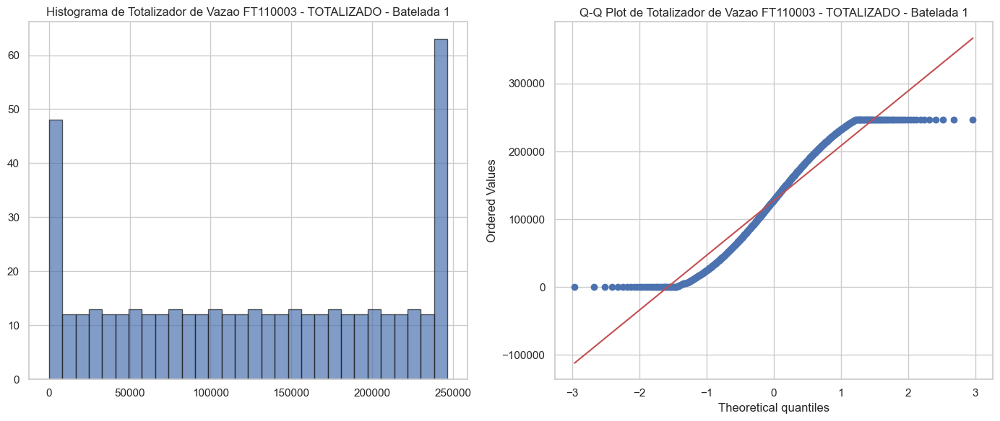


Testes de Normalidade para a coluna: Totalizador de Vazao FT110003 - TOTALIZADO - Batelada 1
Shapiro-Wilk Test: Estatística=0.9242, p-valor=0.0000
Anderson-Darling Test: Estatística=8.6991, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.0769, p-valor=0.0086


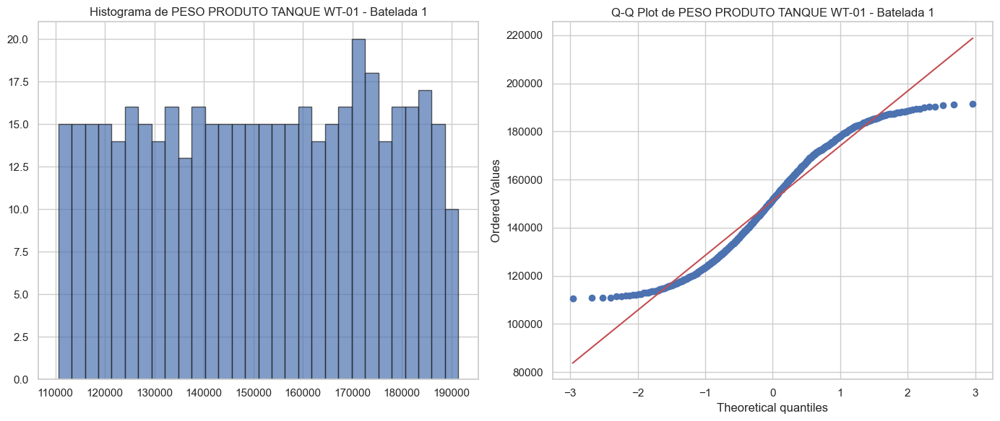


Testes de Normalidade para a coluna: PESO PRODUTO TANQUE WT-01 - Batelada 1
Shapiro-Wilk Test: Estatística=0.9537, p-valor=0.0000
Anderson-Darling Test: Estatística=5.3823, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.0707, p-valor=0.0200


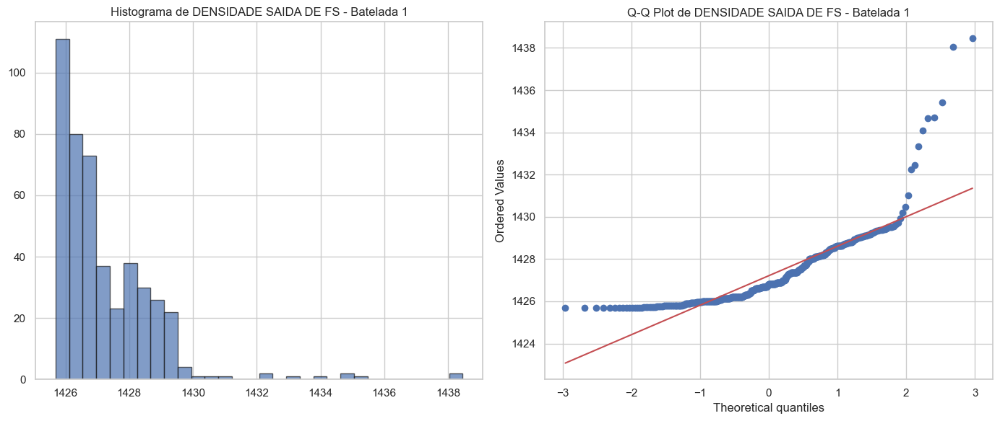


Testes de Normalidade para a coluna: DENSIDADE SAIDA DE FS - Batelada 1
Shapiro-Wilk Test: Estatística=0.7589, p-valor=0.0000
Anderson-Darling Test: Estatística=19.7328, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.1702, p-valor=0.0000


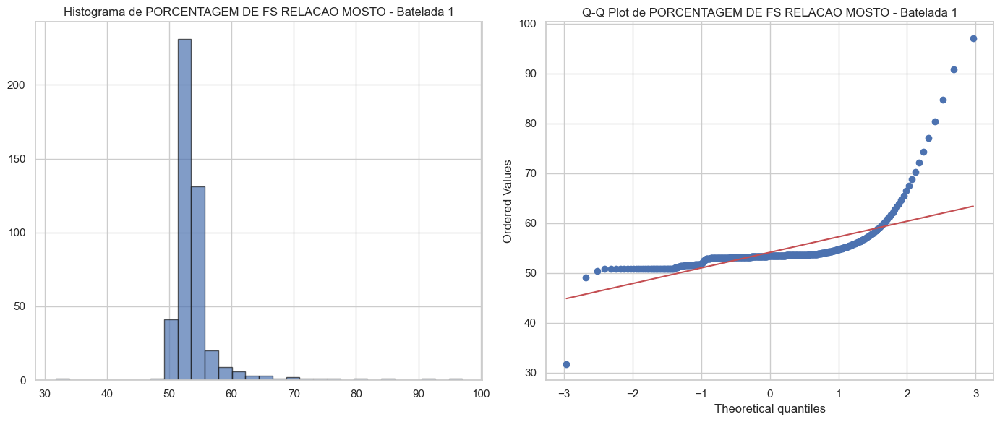


Testes de Normalidade para a coluna: PORCENTAGEM DE FS RELACAO MOSTO - Batelada 1
Shapiro-Wilk Test: Estatística=0.4767, p-valor=0.0000
Anderson-Darling Test: Estatística=72.0707, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.2964, p-valor=0.0000


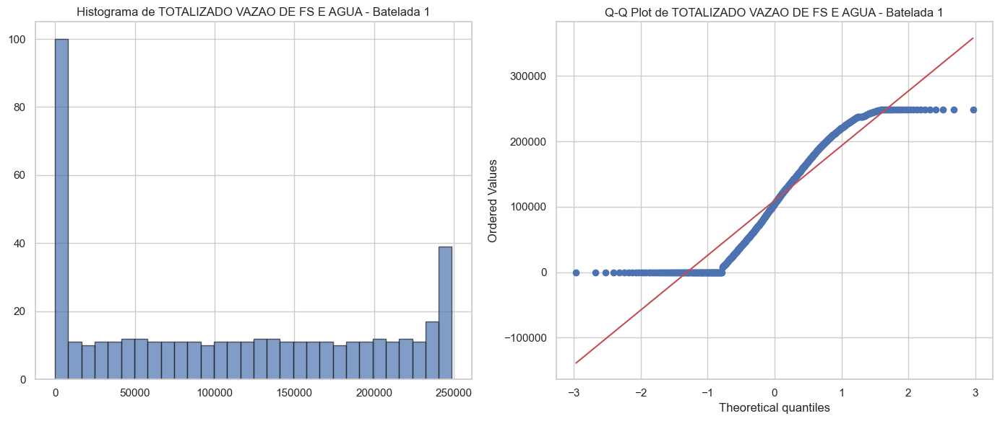


Testes de Normalidade para a coluna: TOTALIZADO VAZAO DE FS E AGUA - Batelada 1
Shapiro-Wilk Test: Estatística=0.8996, p-valor=0.0000
Anderson-Darling Test: Estatística=13.1235, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.1107, p-valor=0.0000


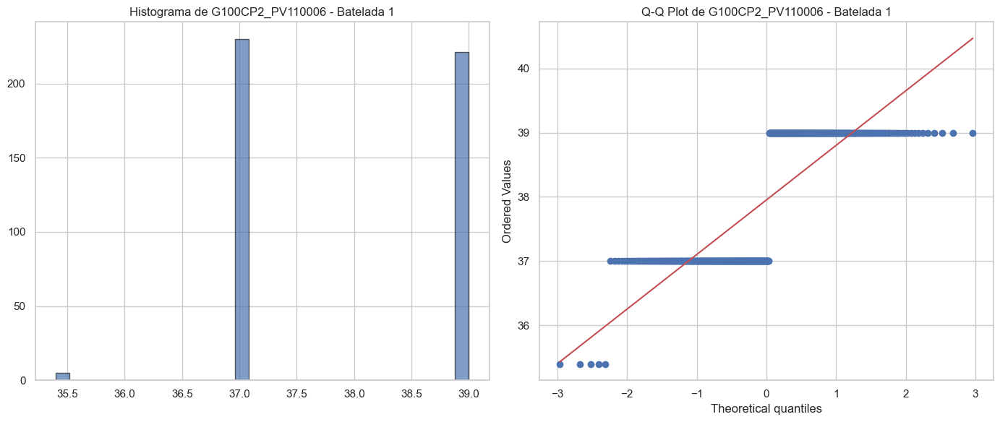


Testes de Normalidade para a coluna: G100CP2_PV110006 - Batelada 1
Shapiro-Wilk Test: Estatística=0.6708, p-valor=0.0000
Anderson-Darling Test: Estatística=75.9009, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.3374, p-valor=0.0000


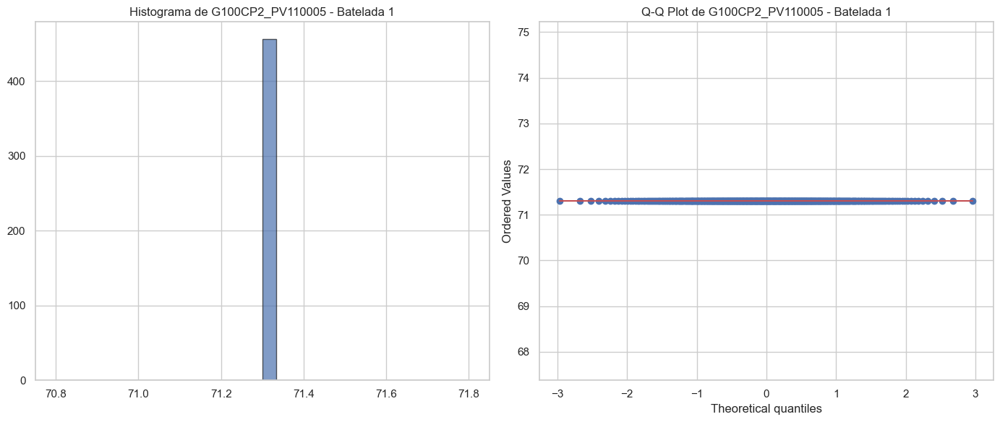


Testes de Normalidade para a coluna: G100CP2_PV110005 - Batelada 1
Shapiro-Wilk Test: Estatística=1.0000, p-valor=1.0000
Anderson-Darling Test: Estatística=177.0442, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=0.5221, p-valor=0.0000


C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1879: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "


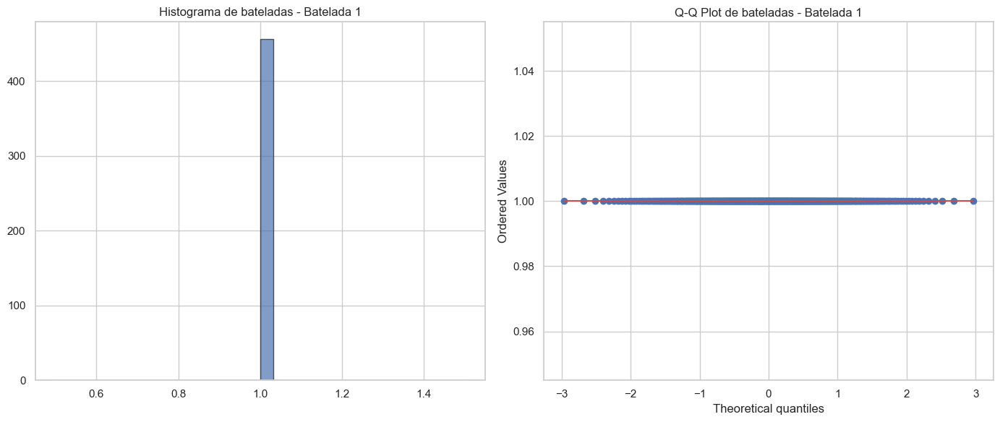


Testes de Normalidade para a coluna: bateladas - Batelada 1
Shapiro-Wilk Test: Estatística=1.0000, p-valor=1.0000
Anderson-Darling Test: Estatística=nan, Críticos=[0.571 0.65  0.78  0.91  1.083]
Kolmogorov-Smirnov Test: Estatística=nan, p-valor=nan


C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:2121: RuntimeWarning: invalid value encountered in divide
  w = (y - xbar) / s
C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2066: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


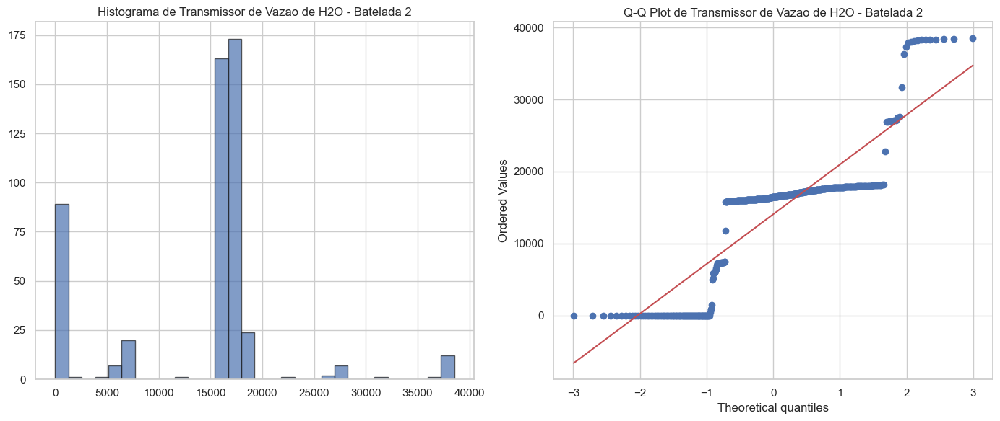


Testes de Normalidade para a coluna: Transmissor de Vazao de H2O - Batelada 2
Shapiro-Wilk Test: Estatística=0.7503, p-valor=0.0000
Anderson-Darling Test: Estatística=60.2158, Críticos=[0.572 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.3492, p-valor=0.0000


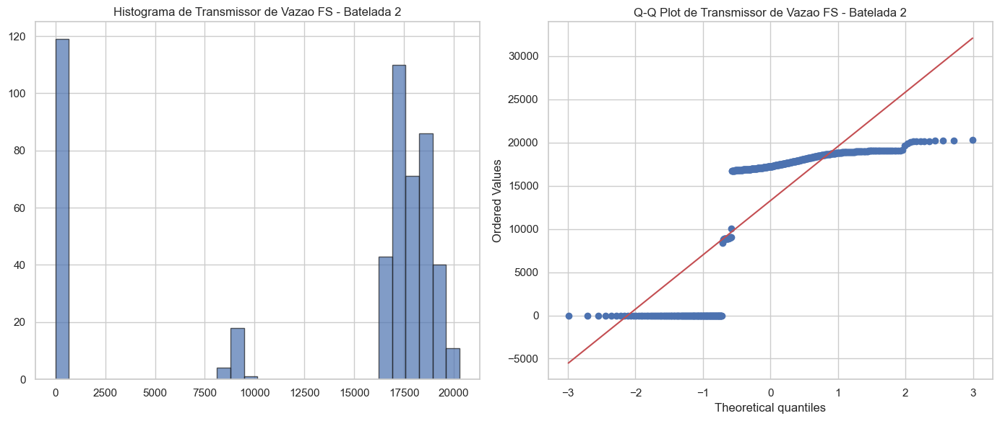


Testes de Normalidade para a coluna: Transmissor de Vazao FS - Batelada 2
Shapiro-Wilk Test: Estatística=0.6622, p-valor=0.0000
Anderson-Darling Test: Estatística=80.8004, Críticos=[0.572 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.3920, p-valor=0.0000


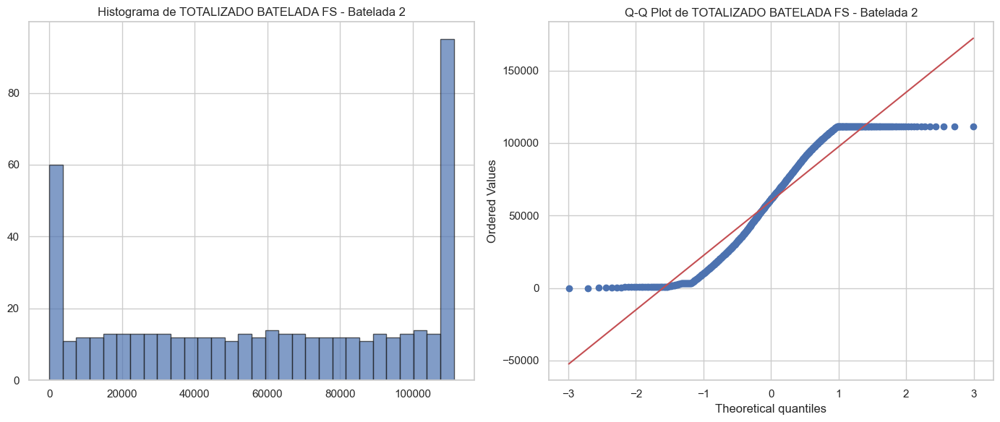


Testes de Normalidade para a coluna: TOTALIZADO BATELADA FS - Batelada 2
Shapiro-Wilk Test: Estatística=0.9042, p-valor=0.0000
Anderson-Darling Test: Estatística=13.3861, Críticos=[0.572 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.0951, p-valor=0.0002


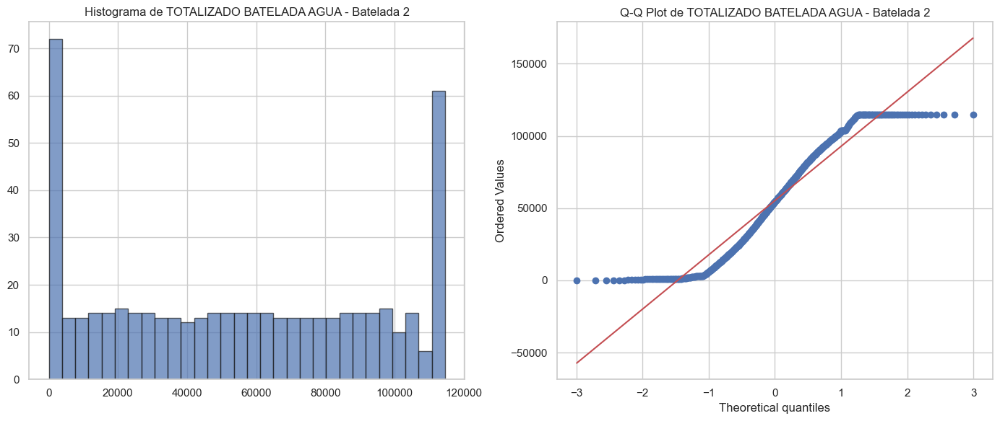


Testes de Normalidade para a coluna: TOTALIZADO BATELADA AGUA - Batelada 2
Shapiro-Wilk Test: Estatística=0.9213, p-valor=0.0000
Anderson-Darling Test: Estatística=10.1292, Críticos=[0.572 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.0783, p-valor=0.0040


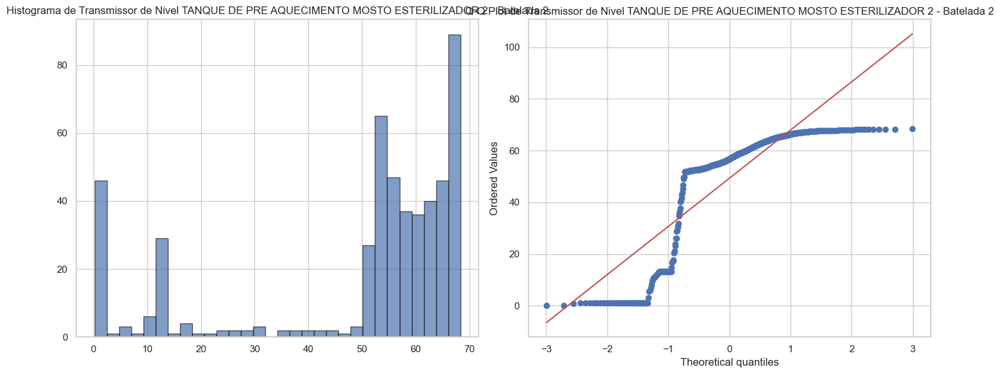


Testes de Normalidade para a coluna: Transmissor de Nivel TANQUE DE PRE AQUECIMENTO MOSTO ESTERILIZADOR 2 - Batelada 2
Shapiro-Wilk Test: Estatística=0.7378, p-valor=0.0000
Anderson-Darling Test: Estatística=54.7595, Críticos=[0.572 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.3151, p-valor=0.0000


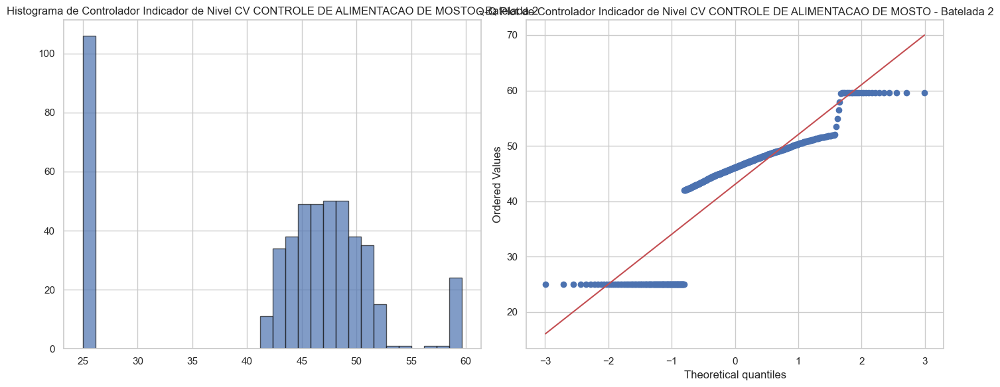


Testes de Normalidade para a coluna: Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO - Batelada 2
Shapiro-Wilk Test: Estatística=0.8009, p-valor=0.0000
Anderson-Darling Test: Estatística=45.0386, Críticos=[0.572 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.2459, p-valor=0.0000


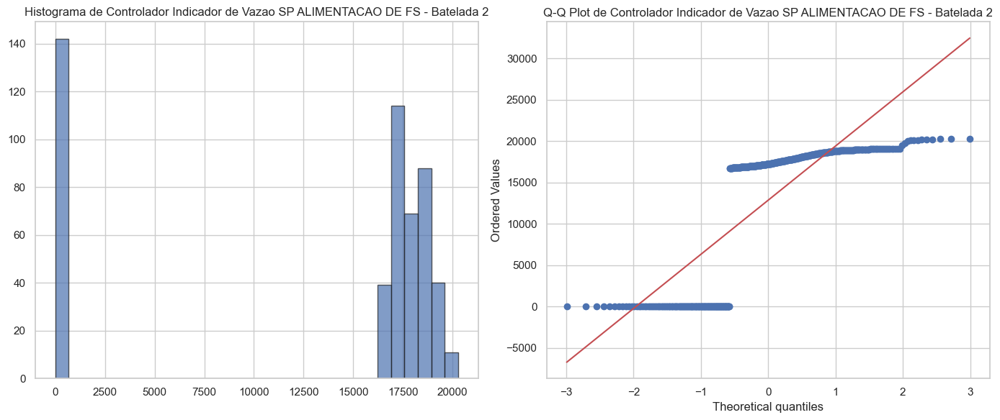


Testes de Normalidade para a coluna: Controlador Indicador de Vazao SP ALIMENTACAO DE FS - Batelada 2
Shapiro-Wilk Test: Estatística=0.6420, p-valor=0.0000
Anderson-Darling Test: Estatística=88.5764, Críticos=[0.572 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.4013, p-valor=0.0000


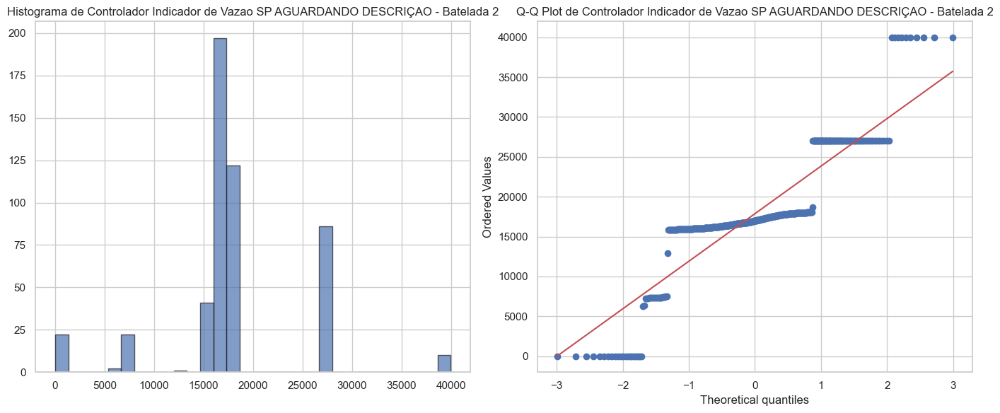


Testes de Normalidade para a coluna: Controlador Indicador de Vazao SP AGUARDANDO DESCRIÇAO - Batelada 2
Shapiro-Wilk Test: Estatística=0.7949, p-valor=0.0000
Anderson-Darling Test: Estatística=47.4905, Críticos=[0.572 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.2950, p-valor=0.0000


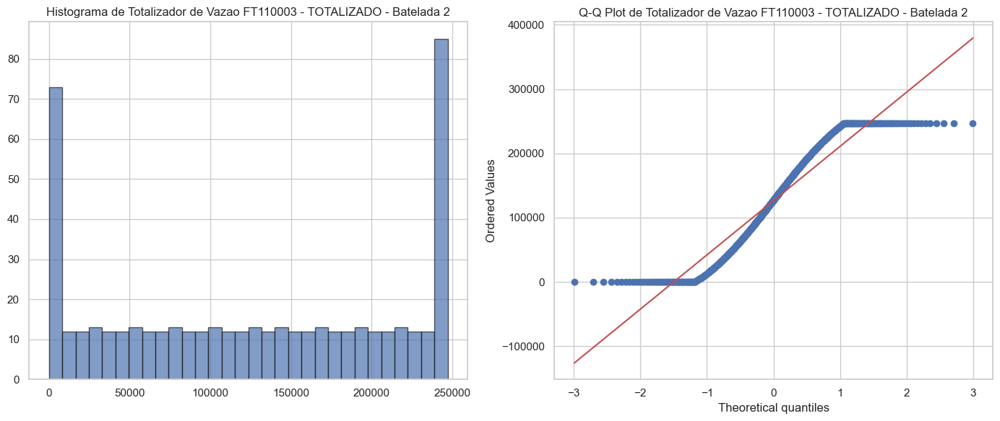


Testes de Normalidade para a coluna: Totalizador de Vazao FT110003 - TOTALIZADO - Batelada 2
Shapiro-Wilk Test: Estatística=0.9052, p-valor=0.0000
Anderson-Darling Test: Estatística=12.9033, Críticos=[0.572 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.0857, p-valor=0.0012


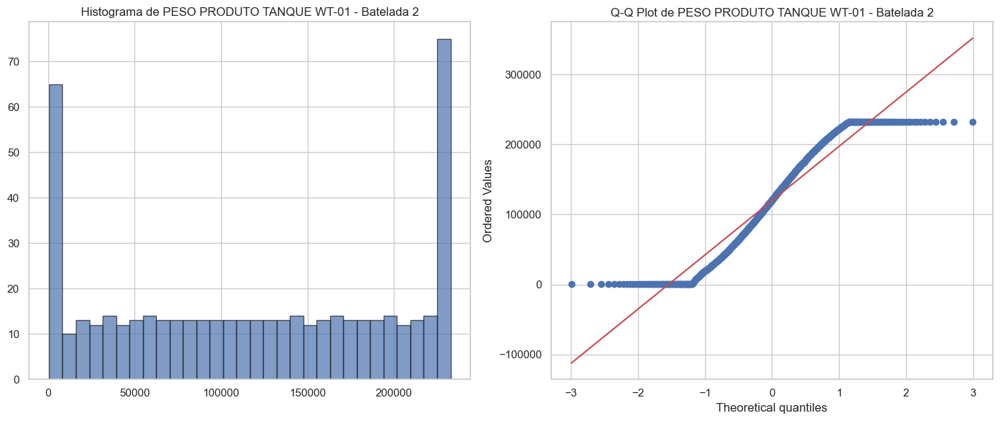


Testes de Normalidade para a coluna: PESO PRODUTO TANQUE WT-01 - Batelada 2
Shapiro-Wilk Test: Estatística=0.9160, p-valor=0.0000
Anderson-Darling Test: Estatística=10.8942, Críticos=[0.572 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.0806, p-valor=0.0027


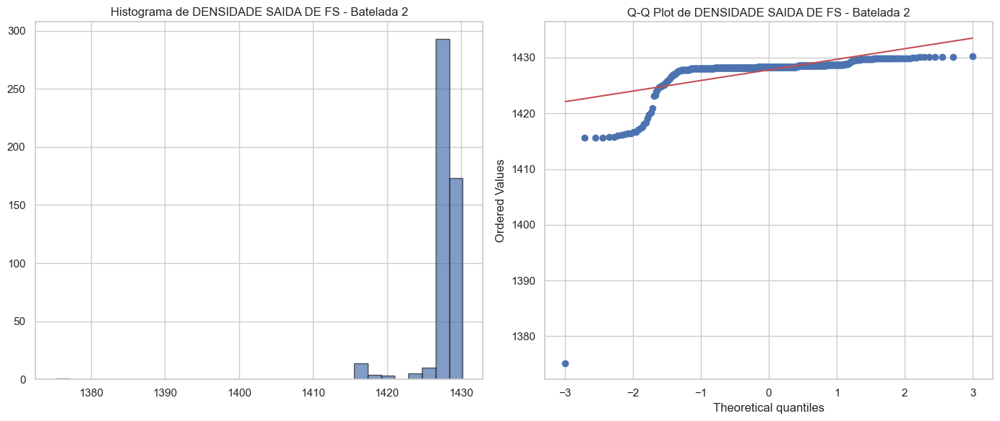


Testes de Normalidade para a coluna: DENSIDADE SAIDA DE FS - Batelada 2
Shapiro-Wilk Test: Estatística=0.3247, p-valor=0.0000
Anderson-Darling Test: Estatística=110.8479, Críticos=[0.572 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.4032, p-valor=0.0000


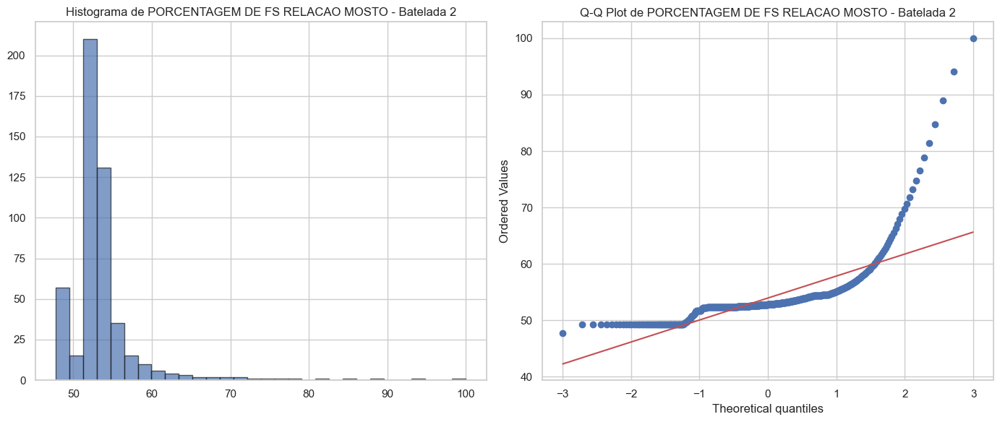


Testes de Normalidade para a coluna: PORCENTAGEM DE FS RELACAO MOSTO - Batelada 2
Shapiro-Wilk Test: Estatística=0.5564, p-valor=0.0000
Anderson-Darling Test: Estatística=60.5064, Críticos=[0.572 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.2651, p-valor=0.0000


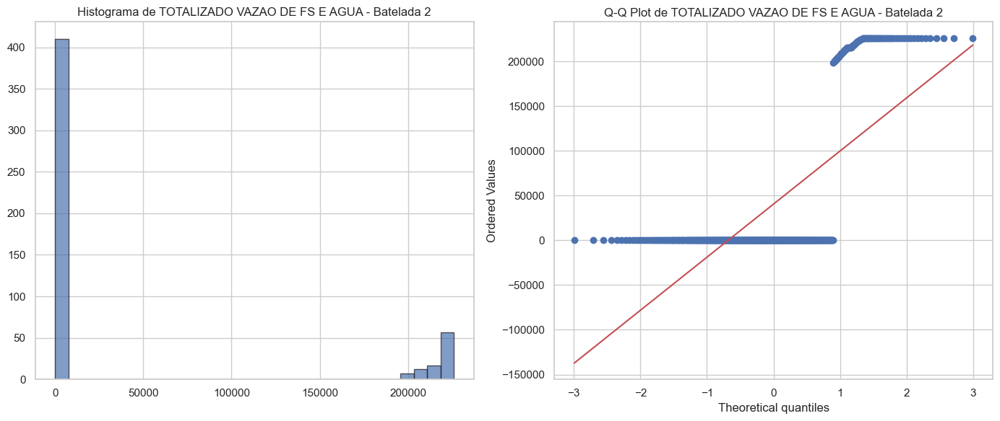


Testes de Normalidade para a coluna: TOTALIZADO VAZAO DE FS E AGUA - Batelada 2
Shapiro-Wilk Test: Estatística=0.4798, p-valor=0.0000
Anderson-Darling Test: Estatística=136.1049, Críticos=[0.572 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.4978, p-valor=0.0000


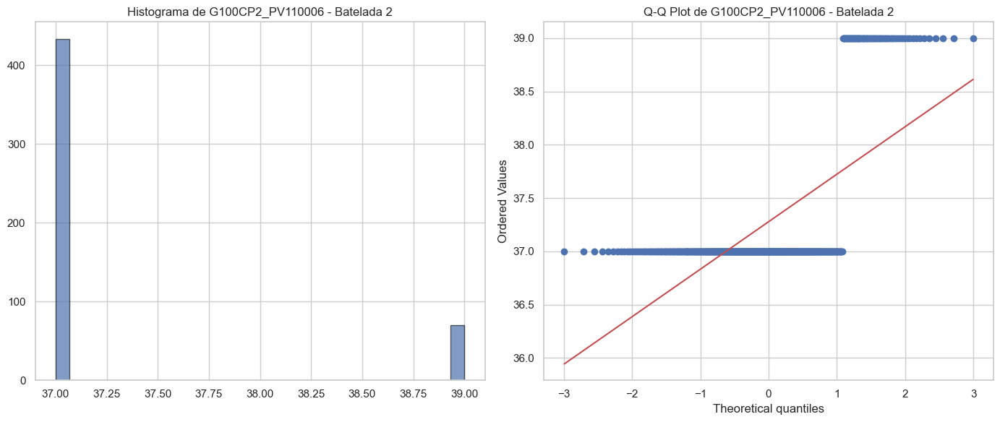


Testes de Normalidade para a coluna: G100CP2_PV110006 - Batelada 2
Shapiro-Wilk Test: Estatística=0.4100, p-valor=0.0000
Anderson-Darling Test: Estatística=152.6542, Críticos=[0.572 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.5169, p-valor=0.0000


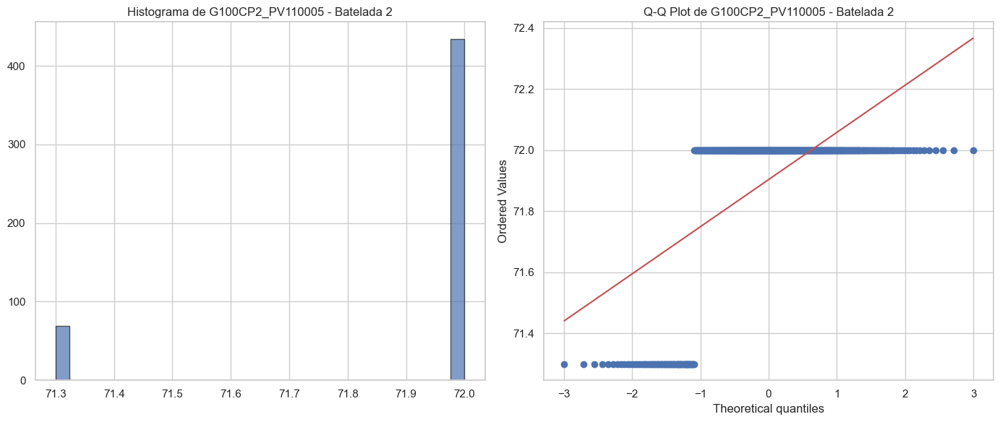


Testes de Normalidade para a coluna: G100CP2_PV110005 - Batelada 2
Shapiro-Wilk Test: Estatística=0.4069, p-valor=0.0000
Anderson-Darling Test: Estatística=153.3041, Críticos=[0.572 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.5176, p-valor=0.0000


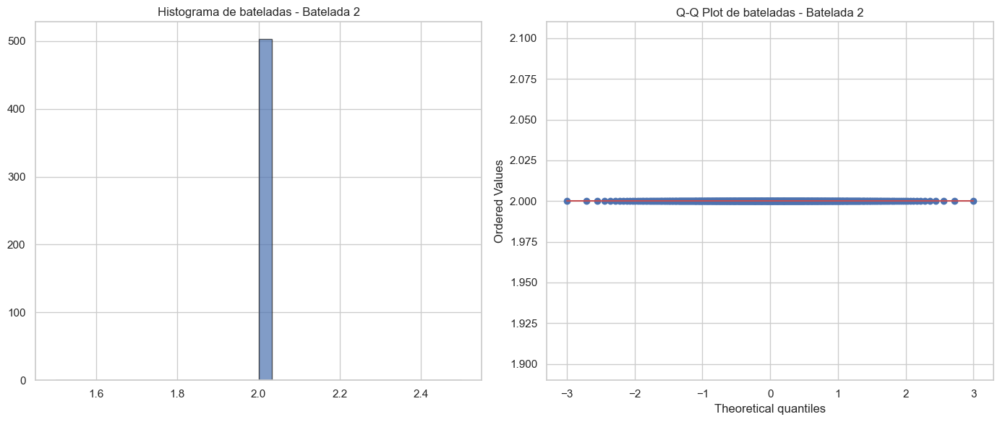


Testes de Normalidade para a coluna: bateladas - Batelada 2
Shapiro-Wilk Test: Estatística=1.0000, p-valor=1.0000
Anderson-Darling Test: Estatística=nan, Críticos=[0.572 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=nan, p-valor=nan


C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1879: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "
C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:2121: RuntimeWarning: invalid value encountered in divide
  w = (y - xbar) / s
C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2066: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


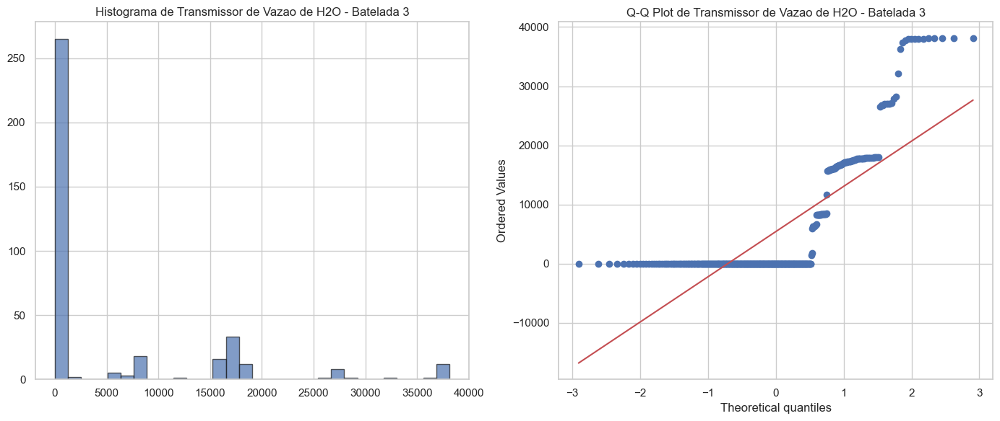


Testes de Normalidade para a coluna: Transmissor de Vazao de H2O - Batelada 3
Shapiro-Wilk Test: Estatística=0.6172, p-valor=0.0000
Anderson-Darling Test: Estatística=64.1158, Críticos=[0.57  0.649 0.779 0.909 1.081]
Kolmogorov-Smirnov Test: Estatística=0.4112, p-valor=0.0000


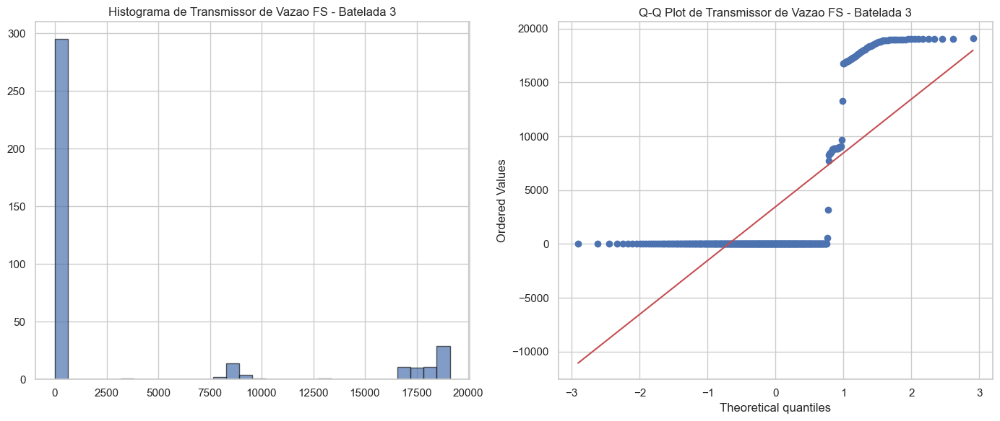


Testes de Normalidade para a coluna: Transmissor de Vazao FS - Batelada 3
Shapiro-Wilk Test: Estatística=0.5324, p-valor=0.0000
Anderson-Darling Test: Estatística=88.7949, Críticos=[0.57  0.649 0.779 0.909 1.081]
Kolmogorov-Smirnov Test: Estatística=0.4701, p-valor=0.0000


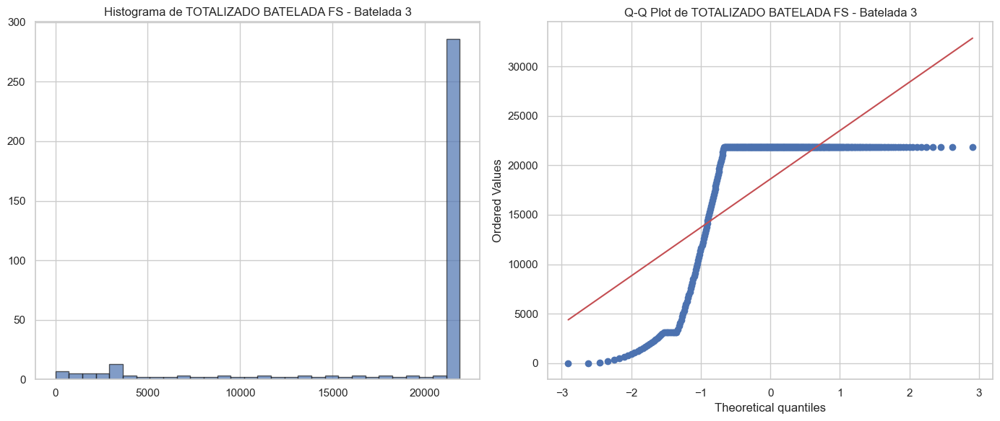


Testes de Normalidade para a coluna: TOTALIZADO BATELADA FS - Batelada 3
Shapiro-Wilk Test: Estatística=0.5461, p-valor=0.0000
Anderson-Darling Test: Estatística=83.2561, Críticos=[0.57  0.649 0.779 0.909 1.081]
Kolmogorov-Smirnov Test: Estatística=0.4391, p-valor=0.0000


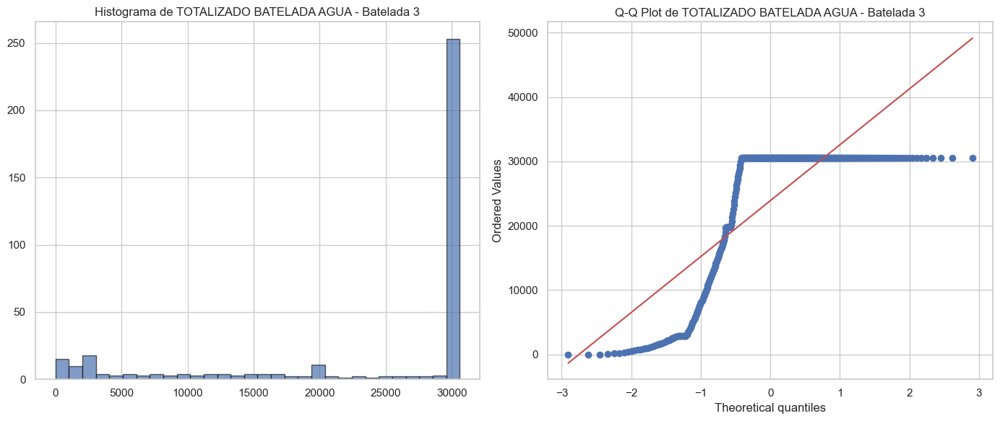


Testes de Normalidade para a coluna: TOTALIZADO BATELADA AGUA - Batelada 3
Shapiro-Wilk Test: Estatística=0.6464, p-valor=0.0000
Anderson-Darling Test: Estatística=63.5819, Críticos=[0.57  0.649 0.779 0.909 1.081]
Kolmogorov-Smirnov Test: Estatística=0.3960, p-valor=0.0000


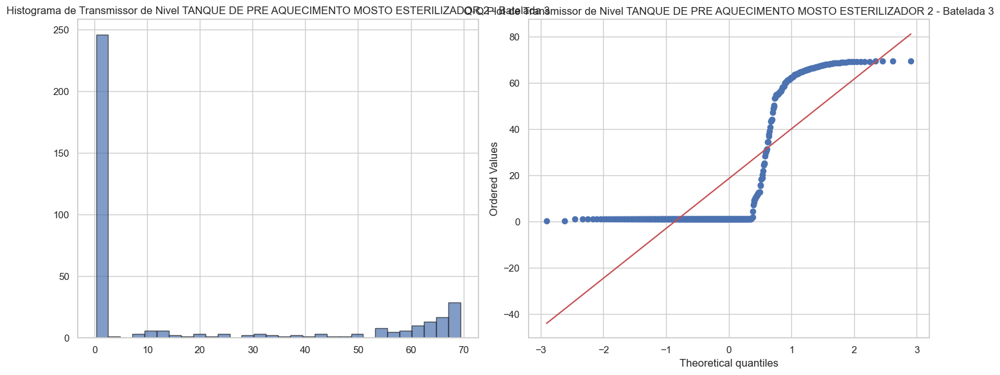


Testes de Normalidade para a coluna: Transmissor de Nivel TANQUE DE PRE AQUECIMENTO MOSTO ESTERILIZADOR 2 - Batelada 3
Shapiro-Wilk Test: Estatística=0.6441, p-valor=0.0000
Anderson-Darling Test: Estatística=64.9998, Críticos=[0.57  0.649 0.779 0.909 1.081]
Kolmogorov-Smirnov Test: Estatística=0.3855, p-valor=0.0000


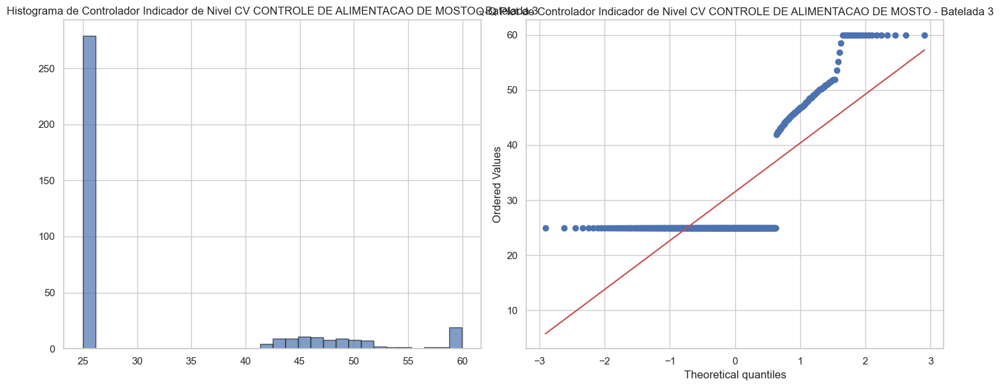


Testes de Normalidade para a coluna: Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO - Batelada 3
Shapiro-Wilk Test: Estatística=0.6064, p-valor=0.0000
Anderson-Darling Test: Estatística=74.6719, Críticos=[0.57  0.649 0.779 0.909 1.081]
Kolmogorov-Smirnov Test: Estatística=0.4539, p-valor=0.0000


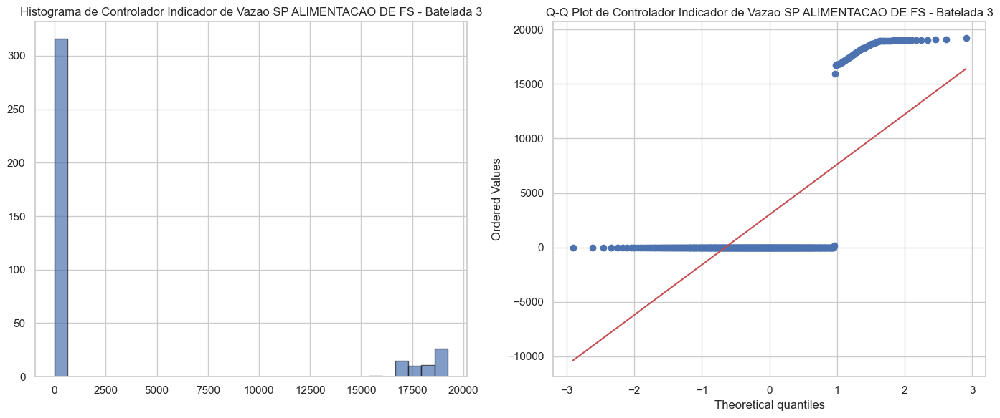


Testes de Normalidade para a coluna: Controlador Indicador de Vazao SP ALIMENTACAO DE FS - Batelada 3
Shapiro-Wilk Test: Estatística=0.4583, p-valor=0.0000
Anderson-Darling Test: Estatística=106.5138, Críticos=[0.57  0.649 0.779 0.909 1.081]
Kolmogorov-Smirnov Test: Estatística=0.5031, p-valor=0.0000


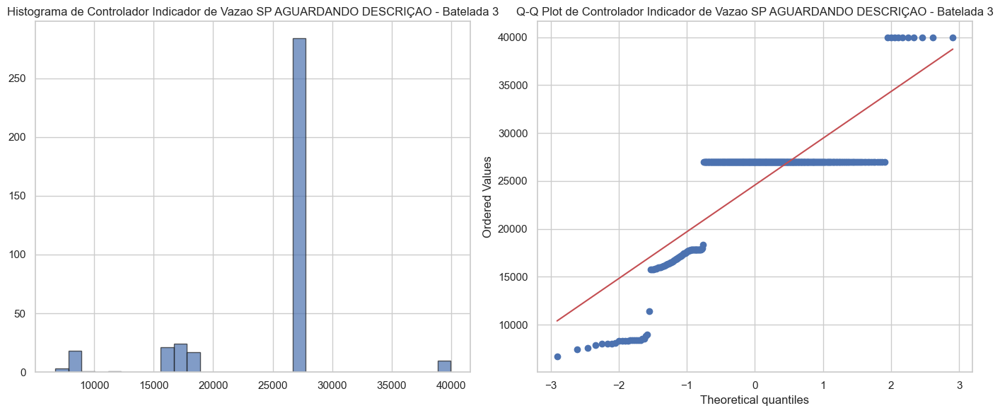


Testes de Normalidade para a coluna: Controlador Indicador de Vazao SP AGUARDANDO DESCRIÇAO - Batelada 3
Shapiro-Wilk Test: Estatística=0.6548, p-valor=0.0000
Anderson-Darling Test: Estatística=67.3807, Críticos=[0.57  0.649 0.779 0.909 1.081]
Kolmogorov-Smirnov Test: Estatística=0.4316, p-valor=0.0000


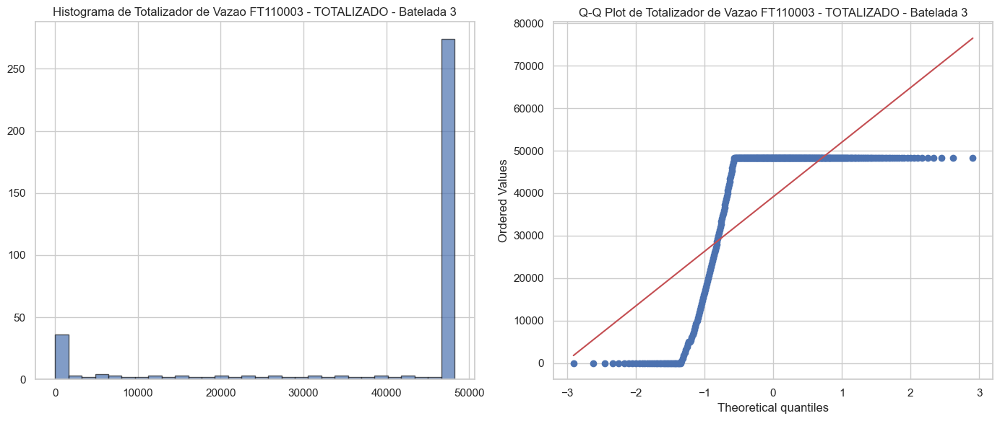


Testes de Normalidade para a coluna: Totalizador de Vazao FT110003 - TOTALIZADO - Batelada 3
Shapiro-Wilk Test: Estatística=0.5780, p-valor=0.0000
Anderson-Darling Test: Estatística=76.9185, Críticos=[0.57  0.649 0.779 0.909 1.081]
Kolmogorov-Smirnov Test: Estatística=0.4212, p-valor=0.0000


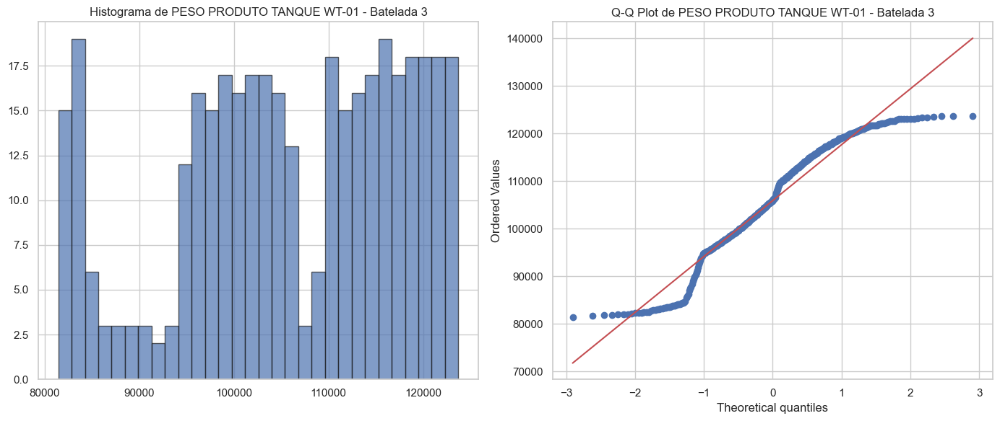


Testes de Normalidade para a coluna: PESO PRODUTO TANQUE WT-01 - Batelada 3
Shapiro-Wilk Test: Estatística=0.9434, p-valor=0.0000
Anderson-Darling Test: Estatística=5.2706, Críticos=[0.57  0.649 0.779 0.909 1.081]
Kolmogorov-Smirnov Test: Estatística=0.0837, p-valor=0.0093


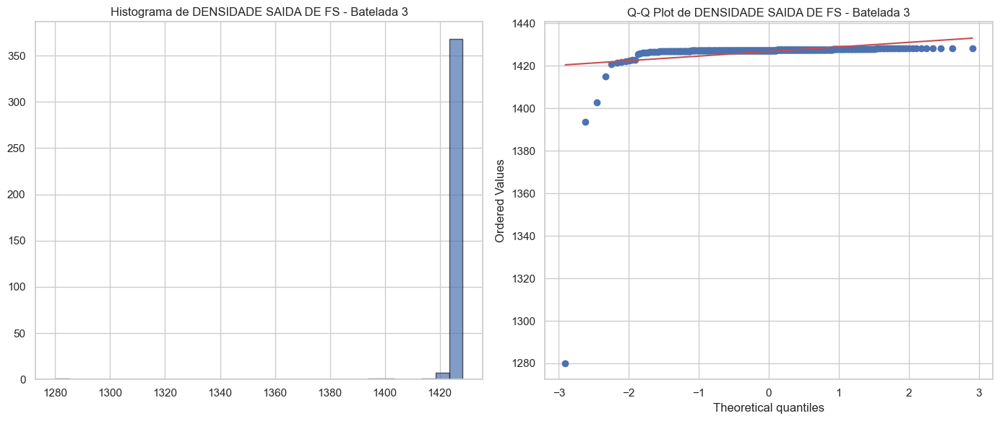


Testes de Normalidade para a coluna: DENSIDADE SAIDA DE FS - Batelada 3
Shapiro-Wilk Test: Estatística=0.0801, p-valor=0.0000
Anderson-Darling Test: Estatística=122.9357, Críticos=[0.57  0.649 0.779 0.909 1.081]
Kolmogorov-Smirnov Test: Estatística=0.4438, p-valor=0.0000


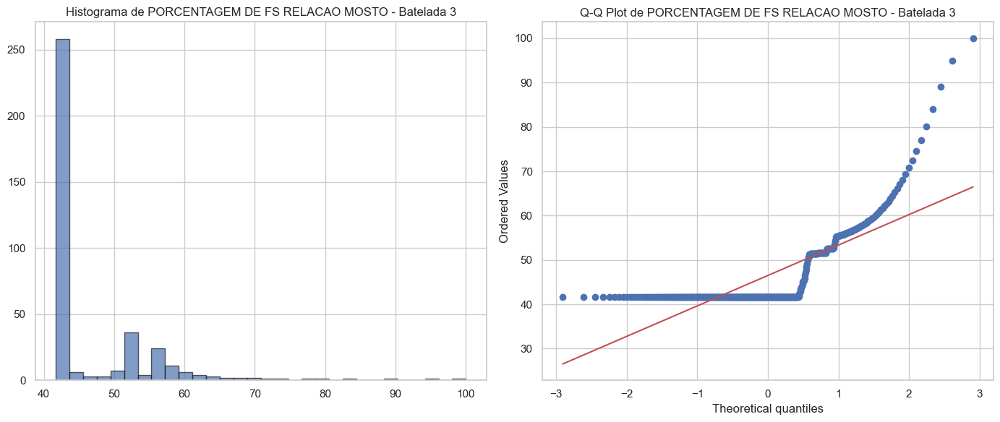


Testes de Normalidade para a coluna: PORCENTAGEM DE FS RELACAO MOSTO - Batelada 3
Shapiro-Wilk Test: Estatística=0.6154, p-valor=0.0000
Anderson-Darling Test: Estatística=55.7862, Críticos=[0.57  0.649 0.779 0.909 1.081]
Kolmogorov-Smirnov Test: Estatística=0.3764, p-valor=0.0000


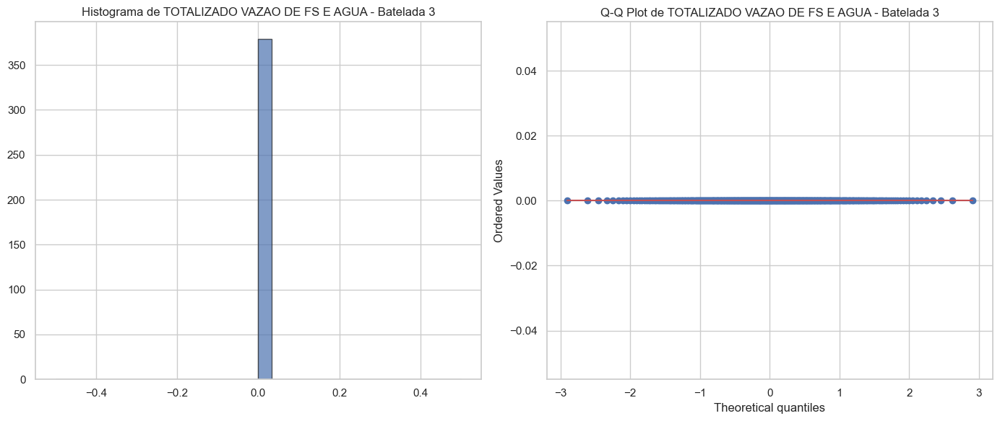


Testes de Normalidade para a coluna: TOTALIZADO VAZAO DE FS E AGUA - Batelada 3
Shapiro-Wilk Test: Estatística=1.0000, p-valor=1.0000
Anderson-Darling Test: Estatística=nan, Críticos=[0.57  0.649 0.779 0.909 1.081]
Kolmogorov-Smirnov Test: Estatística=nan, p-valor=nan


C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1879: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "
C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:2121: RuntimeWarning: invalid value encountered in divide
  w = (y - xbar) / s
C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2066: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


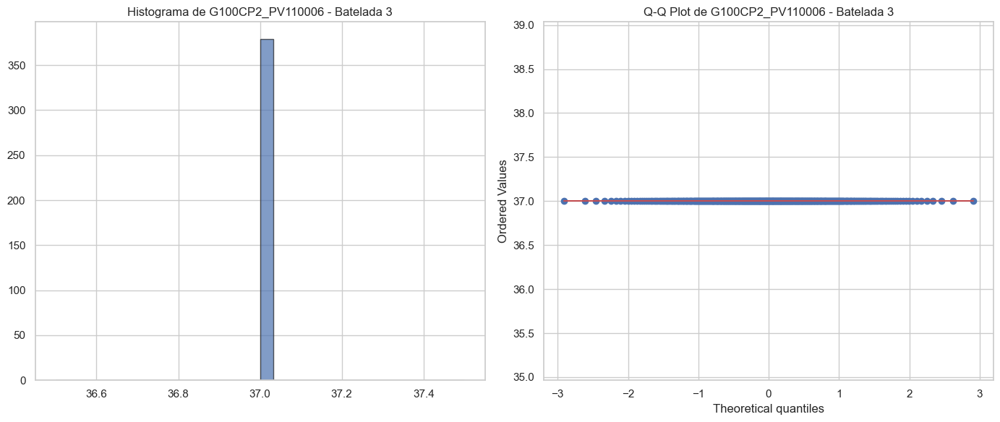


Testes de Normalidade para a coluna: G100CP2_PV110006 - Batelada 3
Shapiro-Wilk Test: Estatística=1.0000, p-valor=1.0000
Anderson-Darling Test: Estatística=nan, Críticos=[0.57  0.649 0.779 0.909 1.081]
Kolmogorov-Smirnov Test: Estatística=nan, p-valor=nan


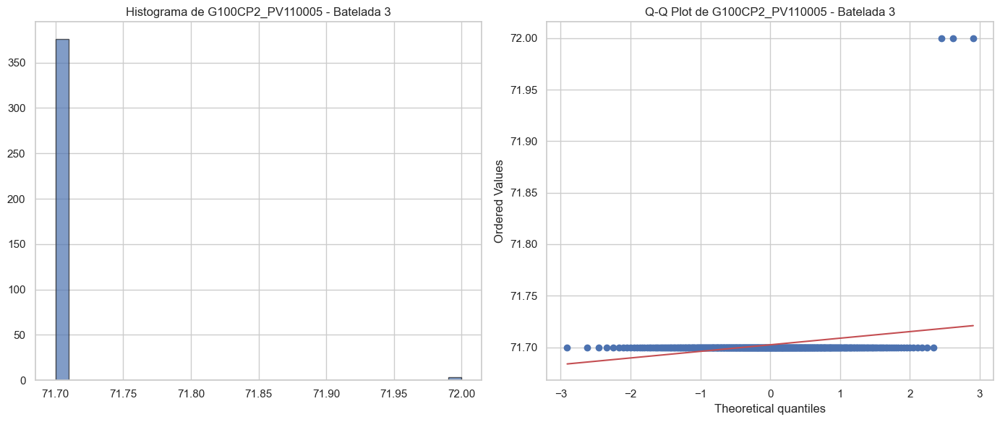


Testes de Normalidade para a coluna: G100CP2_PV110005 - Batelada 3
Shapiro-Wilk Test: Estatística=0.0609, p-valor=0.0000
Anderson-Darling Test: Estatística=145.2910, Críticos=[0.57  0.649 0.779 0.909 1.081]
Kolmogorov-Smirnov Test: Estatística=0.5276, p-valor=0.0000


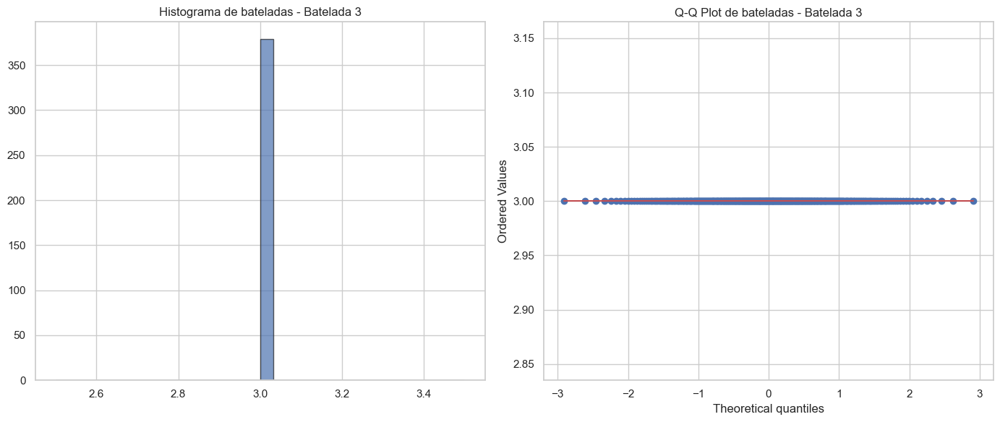


Testes de Normalidade para a coluna: bateladas - Batelada 3
Shapiro-Wilk Test: Estatística=1.0000, p-valor=1.0000
Anderson-Darling Test: Estatística=nan, Críticos=[0.57  0.649 0.779 0.909 1.081]
Kolmogorov-Smirnov Test: Estatística=nan, p-valor=nan


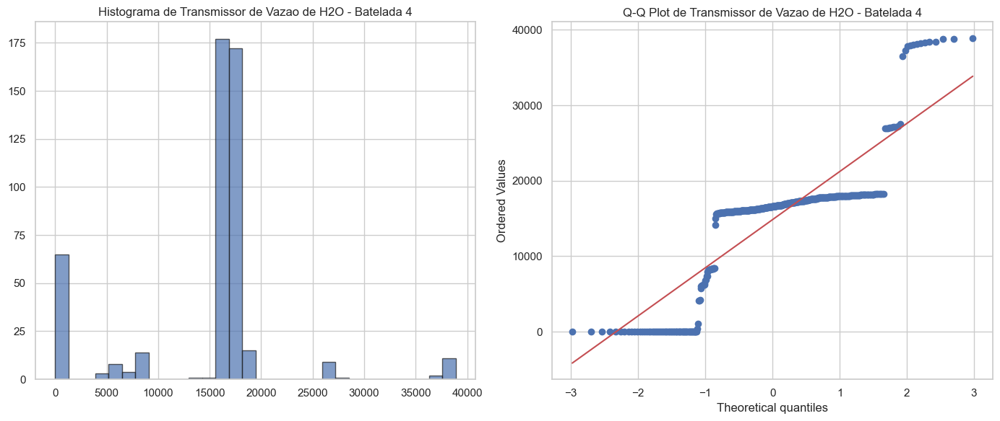


Testes de Normalidade para a coluna: Transmissor de Vazao de H2O - Batelada 4
Shapiro-Wilk Test: Estatística=0.7333, p-valor=0.0000
Anderson-Darling Test: Estatística=60.5695, Críticos=[0.571 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.3411, p-valor=0.0000


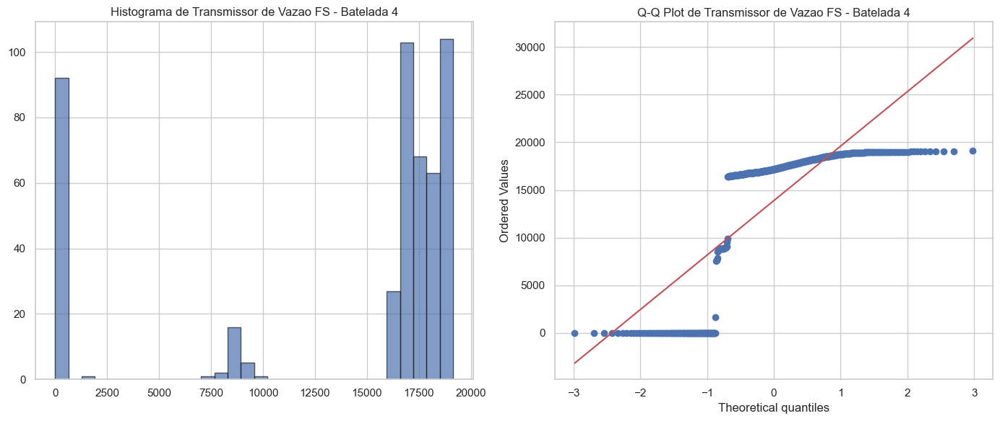


Testes de Normalidade para a coluna: Transmissor de Vazao FS - Batelada 4
Shapiro-Wilk Test: Estatística=0.6396, p-valor=0.0000
Anderson-Darling Test: Estatística=80.9133, Críticos=[0.571 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.3954, p-valor=0.0000


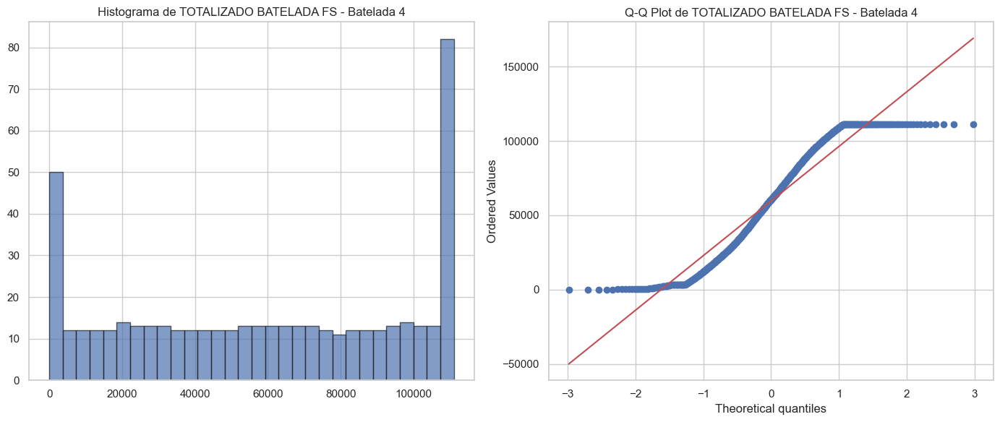


Testes de Normalidade para a coluna: TOTALIZADO BATELADA FS - Batelada 4
Shapiro-Wilk Test: Estatística=0.9140, p-valor=0.0000
Anderson-Darling Test: Estatística=11.1283, Críticos=[0.571 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.0886, p-valor=0.0010


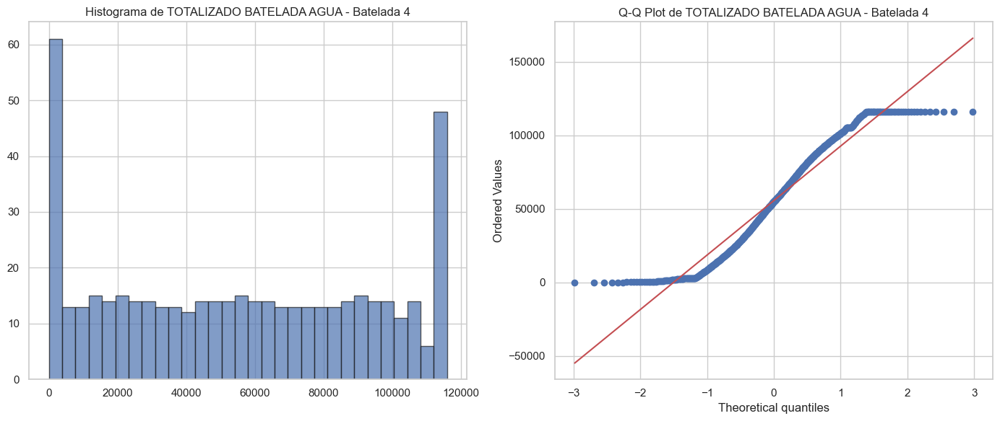


Testes de Normalidade para a coluna: TOTALIZADO BATELADA AGUA - Batelada 4
Shapiro-Wilk Test: Estatística=0.9313, p-valor=0.0000
Anderson-Darling Test: Estatística=8.2136, Críticos=[0.571 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.0744, p-valor=0.0091


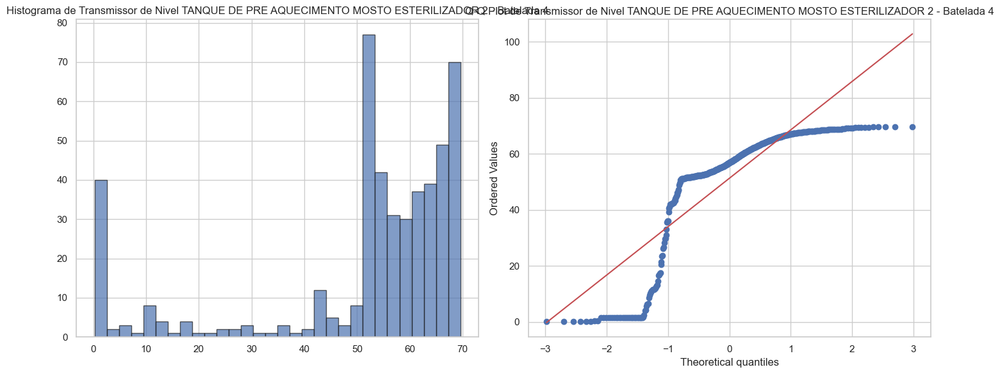


Testes de Normalidade para a coluna: Transmissor de Nivel TANQUE DE PRE AQUECIMENTO MOSTO ESTERILIZADOR 2 - Batelada 4
Shapiro-Wilk Test: Estatística=0.7429, p-valor=0.0000
Anderson-Darling Test: Estatística=46.4327, Críticos=[0.571 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.2811, p-valor=0.0000


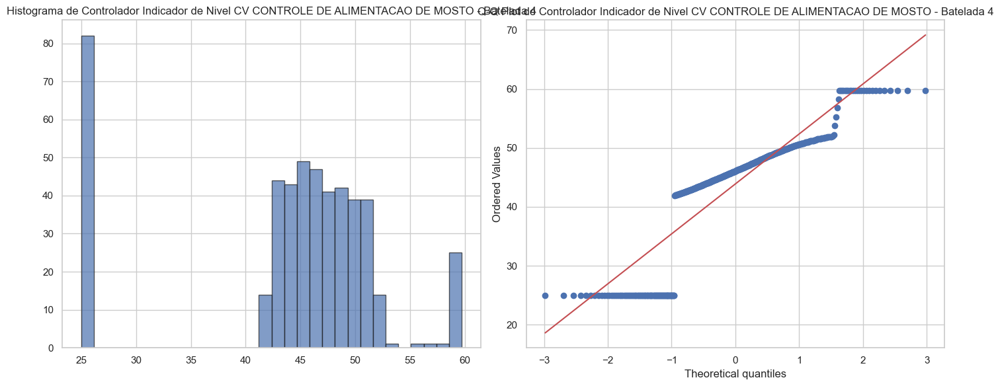


Testes de Normalidade para a coluna: Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO - Batelada 4
Shapiro-Wilk Test: Estatística=0.8077, p-valor=0.0000
Anderson-Darling Test: Estatística=39.6529, Críticos=[0.571 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.2484, p-valor=0.0000


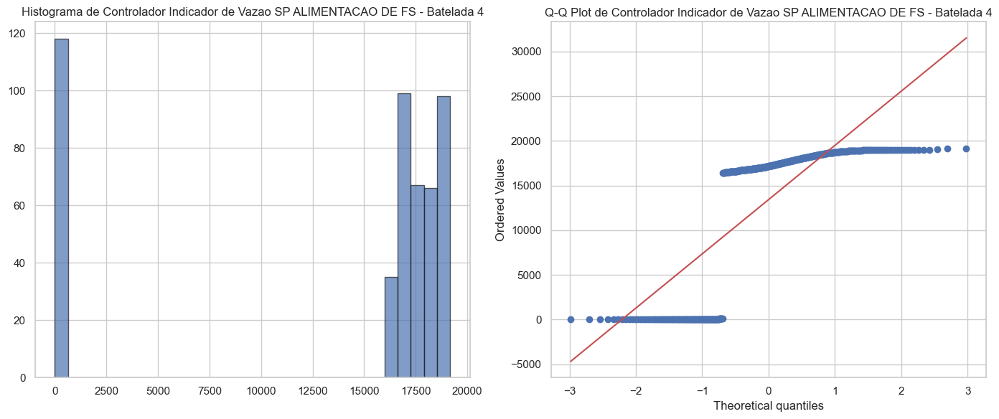


Testes de Normalidade para a coluna: Controlador Indicador de Vazao SP ALIMENTACAO DE FS - Batelada 4
Shapiro-Wilk Test: Estatística=0.6183, p-valor=0.0000
Anderson-Darling Test: Estatística=89.5878, Críticos=[0.571 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.4086, p-valor=0.0000


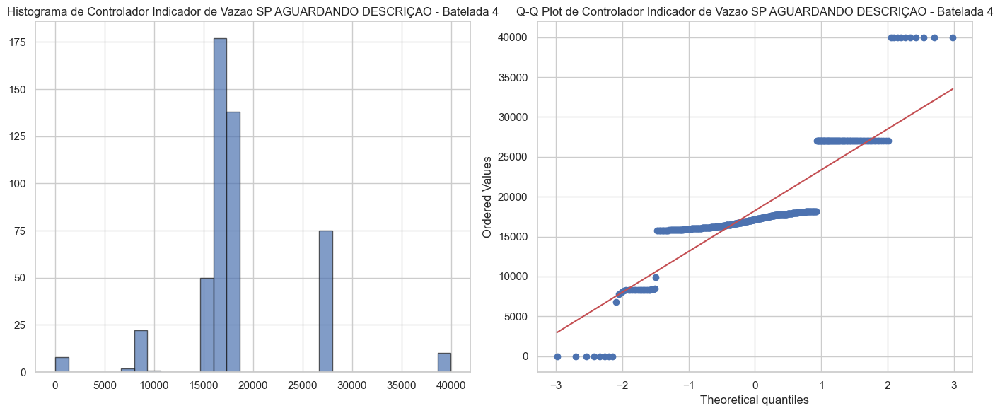


Testes de Normalidade para a coluna: Controlador Indicador de Vazao SP AGUARDANDO DESCRIÇAO - Batelada 4
Shapiro-Wilk Test: Estatística=0.7644, p-valor=0.0000
Anderson-Darling Test: Estatística=50.9194, Críticos=[0.571 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.3284, p-valor=0.0000


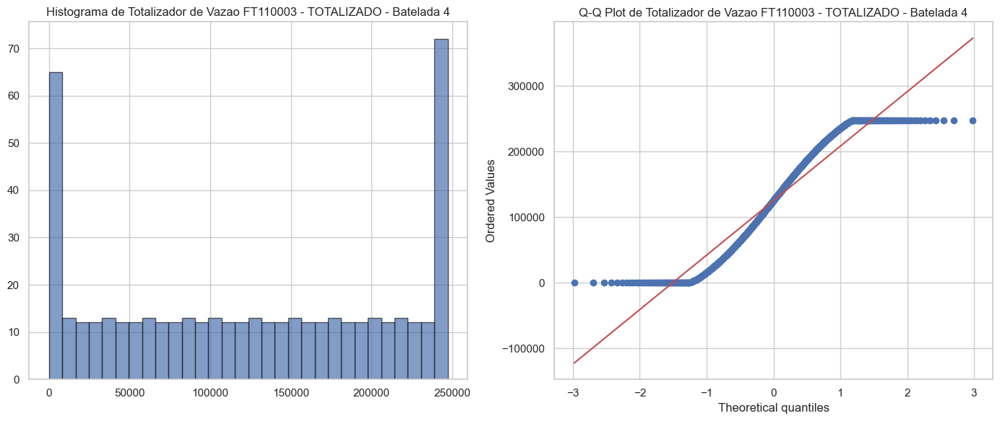


Testes de Normalidade para a coluna: Totalizador de Vazao FT110003 - TOTALIZADO - Batelada 4
Shapiro-Wilk Test: Estatística=0.9135, p-valor=0.0000
Anderson-Darling Test: Estatística=10.9144, Críticos=[0.571 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.0791, p-valor=0.0045


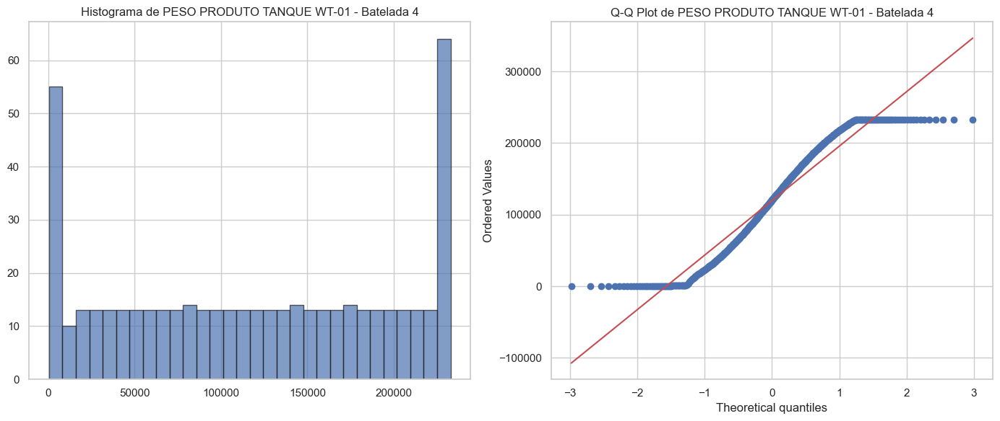


Testes de Normalidade para a coluna: PESO PRODUTO TANQUE WT-01 - Batelada 4
Shapiro-Wilk Test: Estatística=0.9250, p-valor=0.0000
Anderson-Darling Test: Estatística=8.9901, Críticos=[0.571 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.0747, p-valor=0.0086


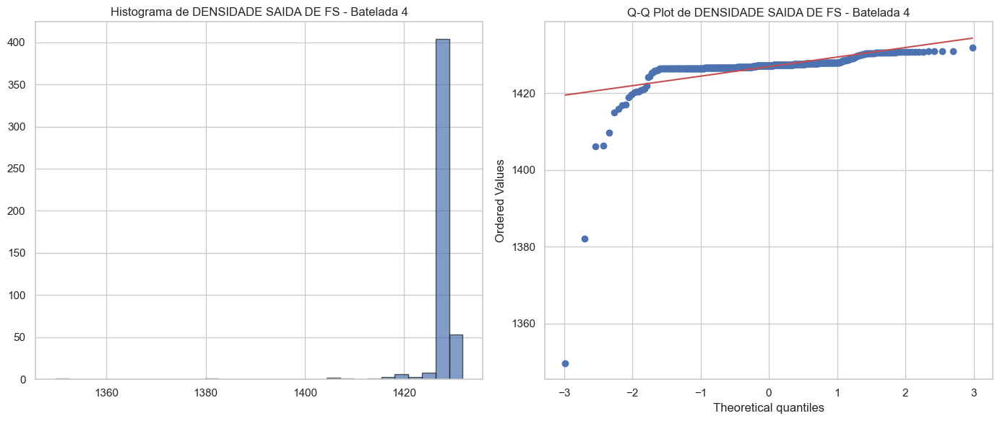


Testes de Normalidade para a coluna: DENSIDADE SAIDA DE FS - Batelada 4
Shapiro-Wilk Test: Estatística=0.2824, p-valor=0.0000
Anderson-Darling Test: Estatística=94.4692, Críticos=[0.571 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.3996, p-valor=0.0000


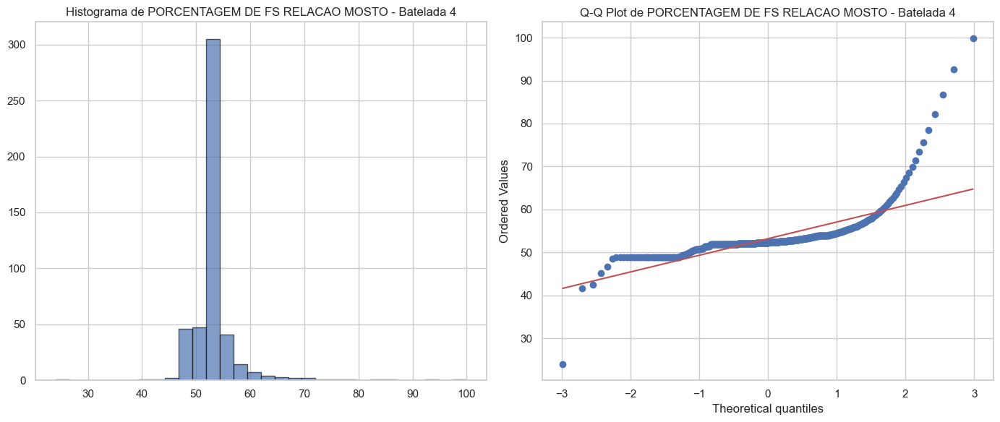


Testes de Normalidade para a coluna: PORCENTAGEM DE FS RELACAO MOSTO - Batelada 4
Shapiro-Wilk Test: Estatística=0.5727, p-valor=0.0000
Anderson-Darling Test: Estatística=56.1713, Críticos=[0.571 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.2510, p-valor=0.0000


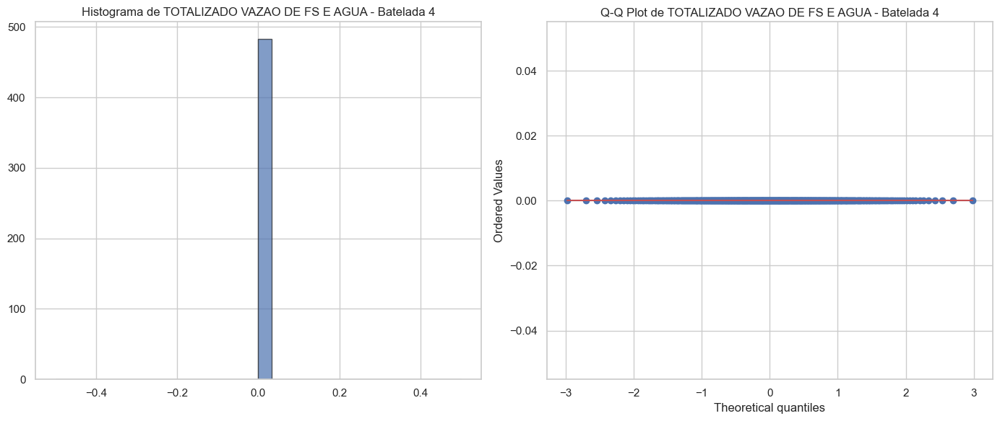


Testes de Normalidade para a coluna: TOTALIZADO VAZAO DE FS E AGUA - Batelada 4
Shapiro-Wilk Test: Estatística=1.0000, p-valor=1.0000
Anderson-Darling Test: Estatística=nan, Críticos=[0.571 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=nan, p-valor=nan


C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1879: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "
C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:2121: RuntimeWarning: invalid value encountered in divide
  w = (y - xbar) / s
C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2066: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


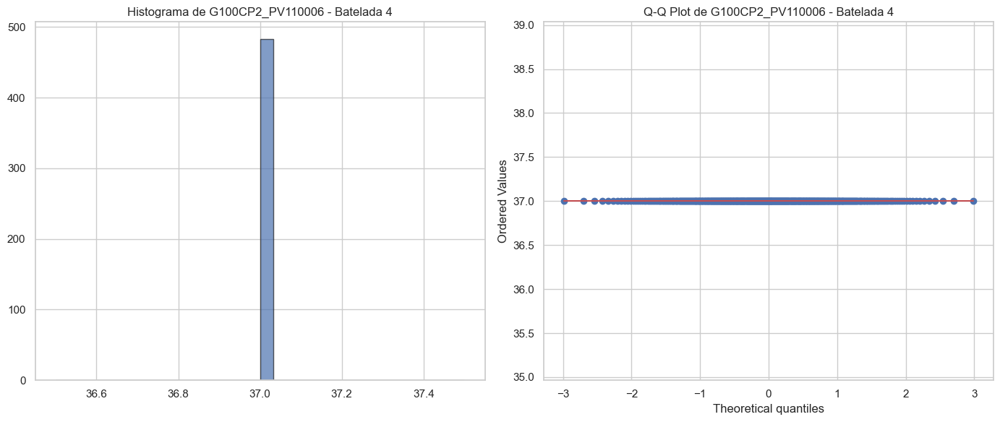


Testes de Normalidade para a coluna: G100CP2_PV110006 - Batelada 4
Shapiro-Wilk Test: Estatística=1.0000, p-valor=1.0000
Anderson-Darling Test: Estatística=nan, Críticos=[0.571 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=nan, p-valor=nan


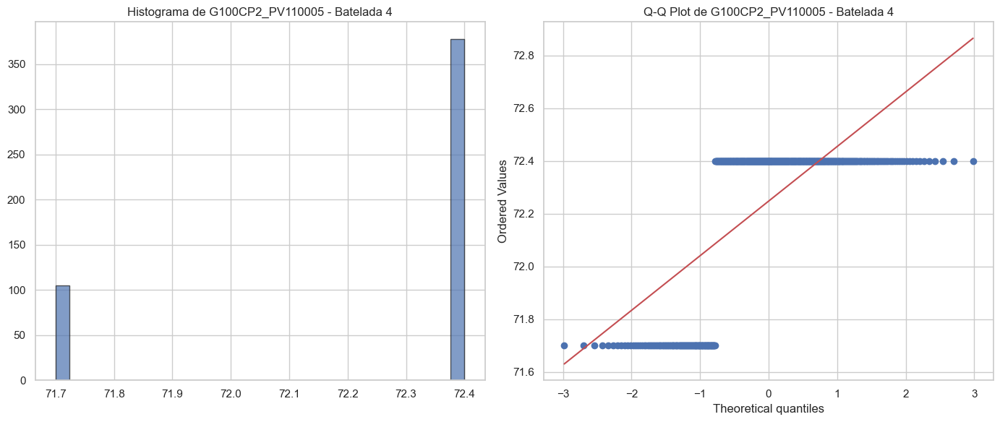


Testes de Normalidade para a coluna: G100CP2_PV110005 - Batelada 4
Shapiro-Wilk Test: Estatística=0.5081, p-valor=0.0000
Anderson-Darling Test: Estatística=123.8515, Críticos=[0.571 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=0.4833, p-valor=0.0000


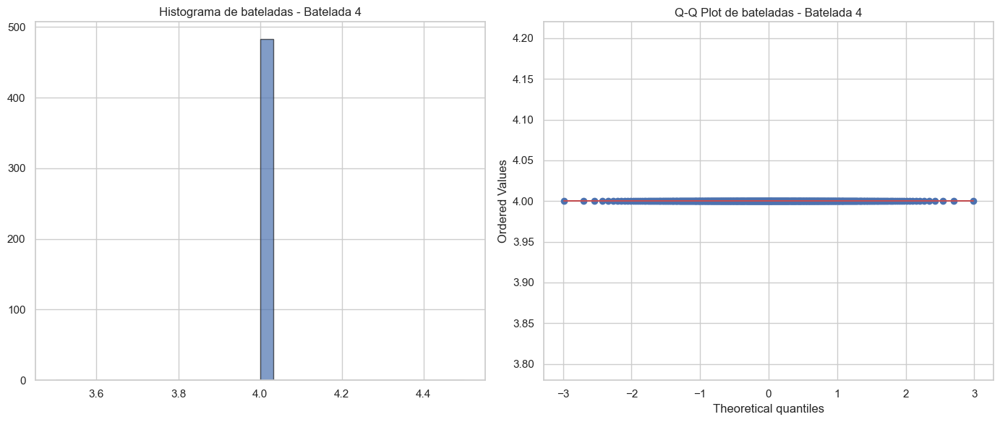


Testes de Normalidade para a coluna: bateladas - Batelada 4
Shapiro-Wilk Test: Estatística=1.0000, p-valor=1.0000
Anderson-Darling Test: Estatística=nan, Críticos=[0.571 0.651 0.781 0.911 1.083]
Kolmogorov-Smirnov Test: Estatística=nan, p-valor=nan


In [80]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

def plot_normality_tests(df, column, batelada):
    data = df[column].dropna()
    
    # Histograma
    plt.figure(figsize=(14, 6))
    plt.subplot(1, 2, 1)
    plt.hist(data, bins=30, edgecolor='k', alpha=0.7)
    plt.title(f'Histograma de {column} - Batelada {batelada}')
    
    # Q-Q Plot
    plt.subplot(1, 2, 2)
    stats.probplot(data, dist="norm", plot=plt)
    plt.title(f'Q-Q Plot de {column} - Batelada {batelada}')
    
    plt.tight_layout()
    plt.show()

def testar_normalidade(df, column, batelada):
    data = df[column].dropna()
    
    print(f'\nTestes de Normalidade para a coluna: {column} - Batelada {batelada}')
    
    # Shapiro-Wilk Test
    stat, p = stats.shapiro(data)
    print(f'Shapiro-Wilk Test: Estatística={stat:.4f}, p-valor={p:.4f}')
    
    # Anderson-Darling Test
    result = stats.anderson(data, dist='norm')
    print(f'Anderson-Darling Test: Estatística={result.statistic:.4f}, Críticos={result.critical_values}')
    
    # Kolmogorov-Smirnov Test (comparando com distribuição normal padrão)
    mu, std = data.mean(), data.std()
    stat, p = stats.kstest(data, 'norm', args=(mu, std))
    print(f'Kolmogorov-Smirnov Test: Estatística={stat:.4f}, p-valor={p:.4f}')

# Iterar sobre as bateladas de 1 a 4
for batelada in [1, 2, 3, 4]:
    # Filtrar os dados da batelada atual
    df_batelada = df[df['bateladas'] == batelada]
    
    # Lista de colunas numéricas, excluindo "VAZAO DE MOSTO CALCULADA"
    numerical_columns = [col for col in df_batelada.select_dtypes(include=['float64', 'int64']).columns if col != 'VAZAO DE MOSTO CALCULADA']

    # Aplicar os testes de normalidade e Q-Q plot para cada coluna numérica
    for column in numerical_columns:
        plot_normality_tests(df_batelada, column, batelada)
        testar_normalidade(df_batelada, column, batelada)


In [81]:
import pandas as pd

# Criar um DataFrame vazio para armazenar os resultados dos outliers para todas as bateladas
outliers_df_total = pd.DataFrame(columns=['Batelada', 'Coluna', 'Número de Outliers', 'Outliers'])

# Listar as colunas numéricas
colunas = [
    'Transmissor de Vazao de H2O',
    'Transmissor de Vazao FS',
    'TOTALIZADO BATELADA FS',
    'TOTALIZADO BATELADA AGUA',
    'VAZAO DE MOSTO CALCULADA',
    'Transmissor de Nivel TANQUE DE PRE AQUECIMENTO MOSTO ESTERILIZADOR 2',
    'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO',
    'Controlador Indicador de Vazao SP ALIMENTACAO DE FS',
    'Controlador Indicador de Vazao SP AGUARDANDO DESCRIÇAO',
    'Totalizador de Vazao FT110003 - TOTALIZADO',
    'PESO PRODUTO TANQUE WT-01',
    'DENSIDADE SAIDA DE FS',
    'PORCENTAGEM DE FS RELACAO MOSTO',
    'TOTALIZADO VAZAO DE FS E AGUA'
]

# Iterar sobre as bateladas de 1 a 4
for batelada in [1, 2, 3, 4]:
    # Filtrar os dados da batelada atual
    df_batelada = df[df['bateladas'] == batelada]
    
    # Remover índices duplicados, se existirem
    df_batelada = df_batelada.loc[~df_batelada.index.duplicated(keep='first')]
    
    # Criar um DataFrame vazio para armazenar os resultados da batelada atual
    outliers_df = pd.DataFrame(columns=['Coluna', 'Número de Outliers', 'Outliers'])
    
    # Calcular os limites e detectar os outliers
    resultados = []
    for coluna in colunas:
        if coluna in df_batelada.columns and pd.api.types.is_numeric_dtype(df_batelada[coluna]):
            # Cálculo dos quartis e limites
            Q1 = df_batelada[coluna].quantile(0.25)
            Q3 = df_batelada[coluna].quantile(0.75)
            IQR = Q3 - Q1
            limite_inferior = Q1 - 1.5 * IQR
            limite_superior = Q3 + 1.5 * IQR
            
            # Identificar os outliers
            outliers = df_batelada[(df_batelada[coluna] < limite_inferior) | (df_batelada[coluna] > limite_superior)]
            
            # Armazenar resultados
            resultados.append({
                'Batelada': batelada,
                'Coluna': coluna,
                'Número de Outliers': len(outliers),
                'Outliers': outliers[coluna].tolist()
            })
    
    # Criar o DataFrame com os resultados da batelada atual
    outliers_df = pd.concat([outliers_df, pd.DataFrame(resultados)], ignore_index=True)
    
    # Concatenar os resultados da batelada atual ao DataFrame total
    outliers_df_total = pd.concat([outliers_df_total, outliers_df], ignore_index=True)

# Exibir o DataFrame com os outliers de todas as bateladas
print(outliers_df_total)


    Batelada                                             Coluna  \
0        1.0                        Transmissor de Vazao de H2O   
1        1.0                            Transmissor de Vazao FS   
2        1.0                             TOTALIZADO BATELADA FS   
3        1.0                           TOTALIZADO BATELADA AGUA   
4        1.0  Transmissor de Nivel TANQUE DE PRE AQUECIMENTO...   
5        1.0  Controlador Indicador de Nivel CV CONTROLE DE ...   
6        1.0  Controlador Indicador de Vazao SP ALIMENTACAO ...   
7        1.0  Controlador Indicador de Vazao SP AGUARDANDO D...   
8        1.0         Totalizador de Vazao FT110003 - TOTALIZADO   
9        1.0                          PESO PRODUTO TANQUE WT-01   
10       1.0                              DENSIDADE SAIDA DE FS   
11       1.0                    PORCENTAGEM DE FS RELACAO MOSTO   
12       1.0                      TOTALIZADO VAZAO DE FS E AGUA   
13       2.0                        Transmissor de Vazao de H2

C:\Users\Giacomo\AppData\Local\Temp\ipykernel_9252\617664547.py:61: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  outliers_df_total = pd.concat([outliers_df_total, outliers_df], ignore_index=True)


In [82]:
outliers_df_total

,Batelada,Coluna,Número de Outliers,Outliers
0,1.0,Transmissor de Vazao de H2O,94,"[6700.06, 8148.75, 8486.25, 8430.75, 8316.75, ..."
1,1.0,Transmissor de Vazao FS,93,"[8906.5, 9207.25, 9093.62, 9096.75, 9037.88, 9..."
2,1.0,TOTALIZADO BATELADA FS,0,[]
3,1.0,TOTALIZADO BATELADA AGUA,0,[]
4,1.0,Transmissor de Nivel TANQUE DE PRE AQUECIMENTO...,58,"[0.21, 1.09, 3.59, 6.24, 9.32, 12.59, 15.93, 1..."
5,1.0,Controlador Indicador de Nivel CV CONTROLE DE ...,83,"[25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25...."
6,1.0,Controlador Indicador de Vazao SP ALIMENTACAO ...,93,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
7,1.0,Controlador Indicador de Vazao SP AGUARDANDO D...,93,"[8250.88, 8543.0, 8426.62, 8433.5, 8380.88, 83..."
8,1.0,Totalizador de Vazao FT110003 - TOTALIZADO,0,[]
9,1.0,PESO PRODUTO TANQUE WT-01,0,[]


In [96]:
from sklearn.ensemble import IsolationForest
import pandas as pd

# Inicializar o modelo Isolation Forest
model = IsolationForest(contamination=0.05)  # Ajuste a contaminação conforme necessário

# Lista para armazenar os resultados dos outliers para todas as bateladas
resultados_outliers = []

# Iterar sobre as bateladas de 1 a 4
for batelada in [1, 2, 3, 4]:
    # Filtrar os dados da batelada atual
    df_batelada = df[df['bateladas'] == batelada]
    
    # Selecionar colunas numéricas
    colunas_numericas = df_batelada.select_dtypes(include=['float64', 'int64']).columns
    
    # Aplicar o modelo e detectar outliers
    for coluna in colunas_numericas:
        dados = df_batelada[[coluna]].dropna()
        if not dados.empty:
            model.fit(dados)
            predicoes = model.predict(dados)
            outliers = dados[predicoes == -1]
            num_outliers = len(outliers)
            
            # Armazenar os resultados
            resultados_outliers.append({
                'Batelada': batelada,
                'Coluna': coluna,
                'Número de Outliers': num_outliers,
                'Outliers': outliers[coluna].values.tolist()  # Usar .values.tolist() para converter para lista
            })

# Converter a lista de resultados em um DataFrame
isolation_forest_outliers = pd.DataFrame(resultados_outliers)

# Exibir os resultados
print(isolation_forest_outliers)



    Batelada                           Coluna  Número de Outliers  \
0          1      Transmissor de Vazao de H2O                  23   
1          1          Transmissor de Vazao FS                  23   
2          1           TOTALIZADO BATELADA FS                  23   
3          1         TOTALIZADO BATELADA AGUA                  23   
4          1         VAZAO DE MOSTO CALCULADA                  23   
..       ...                              ...                 ...   
67         4  PORCENTAGEM DE FS RELACAO MOSTO                  25   
68         4    TOTALIZADO VAZAO DE FS E AGUA                   0   
69         4                 G100CP2_PV110006                   0   
70         4                 G100CP2_PV110005                   0   
71         4                        bateladas                   0   

                                             Outliers  
0   [6700.06, 8486.25, 3714.55, 25911.56, 26791.88...  
1   [8906.5, 9207.25, 9093.62, 9096.75, 9037.88, 9...  
2  

In [97]:
from sklearn.ensemble import IsolationForest
import pandas as pd

# Inicializar o modelo Isolation Forest
model = IsolationForest(contamination=0.05)  # Ajuste a contaminação conforme necessário

# DataFrame para armazenar índices de outliers
outliers_indices = []

# Iterar sobre as bateladas de 1 a 4
for batelada in [1, 2, 3, 4]:
    # Filtrar os dados da batelada atual
    df_batelada = df[df['bateladas'] == batelada]
    
    # Selecionar colunas numéricas
    colunas_numericas = df_batelada.select_dtypes(include=['float64', 'int64']).columns
    
    # Aplicar o modelo e detectar outliers
    for coluna in colunas_numericas:
        dados = df_batelada[[coluna]].dropna()
        if not dados.empty:
            model.fit(dados)
            predicoes = model.predict(dados)
            outliers = dados[predicoes == -1]
            
            # Armazenar índices dos outliers
            indices_outliers = dados.index[predicoes == -1]
            outliers_indices.extend(indices_outliers)

# Converter a lista de índices para um conjunto para remover duplicatas
outliers_indices = set(outliers_indices)

# Excluir os outliers do DataFrame original
df_sem_outliers = df[~df.index.isin(outliers_indices)]

# Exibir o DataFrame sem outliers
print(df_sem_outliers)


                TimeStamp  Transmissor de Vazao de H2O  \
0     2024-08-01 06:00:00                          0.0   
1     2024-08-01 06:01:00                          0.0   
2     2024-08-01 06:02:00                          0.0   
3     2024-08-01 06:03:00                          0.0   
4     2024-08-01 06:04:00                          0.0   
...                   ...                          ...   
13795 2024-08-10 19:55:00                          0.0   
13796 2024-08-10 19:56:00                          0.0   
13797 2024-08-10 19:57:00                          0.0   
13798 2024-08-10 19:58:00                          0.0   
13799 2024-08-10 19:58:00                          0.0   

       Transmissor de Vazao FS  TOTALIZADO BATELADA FS  \
0                          0.0                     0.0   
1                          0.0                     0.0   
2                          0.0                     0.0   
3                          0.0                     0.0   
4            

In [98]:
df_sem_outliers.head()

,TimeStamp,Transmissor de Vazao de H2O,Transmissor de Vazao FS,TOTALIZADO BATELADA FS,TOTALIZADO BATELADA AGUA,VAZAO DE MOSTO CALCULADA,Transmissor de Nivel TANQUE DE PRE AQUECIMENTO MOSTO ESTERILIZADOR 2,Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO,VAZAO DE MOSTO CALCULADA,Controlador Indicador de Vazao SP ALIMENTACAO DE FS,Controlador Indicador de Vazao SP AGUARDANDO DESCRIÇAO,Totalizador de Vazao FT110003 - TOTALIZADO,PESO PRODUTO TANQUE WT-01,DENSIDADE SAIDA DE FS,PORCENTAGEM DE FS RELACAO MOSTO,TOTALIZADO VAZAO DE FS E AGUA,G100CP2_PV110006,G100CP2_PV110005,bateladas
0,2024-08-01 06:00:00,0.0,0.0,0.0,0.0,40474.21,20.70,25.0,40474.21,0.0,26983.12,0.0,236045.0,1432.81,49.71,0.0,37.0,71.21,NaN
1,2024-08-01 06:01:00,0.0,0.0,0.0,0.0,40732.03,11.40,25.0,40732.03,0.0,26983.12,0.0,236045.0,1432.81,49.71,0.0,37.0,71.21,NaN
2,2024-08-01 06:02:00,0.0,0.0,0.0,0.0,5301.56,1.15,25.0,5301.56,0.0,26983.12,0.0,236045.0,1432.88,49.71,0.0,37.0,71.21,NaN
3,2024-08-01 06:03:00,0.0,0.0,0.0,0.0,0.00,0.27,25.0,0.00,0.0,26983.12,0.0,236045.0,1433.12,49.71,0.0,37.0,71.21,NaN
4,2024-08-01 06:04:00,0.0,0.0,0.0,0.0,0.00,1.48,25.0,0.00,0.0,26983.12,0.0,236045.0,1433.00,49.71,0.0,37.0,71.21,NaN


In [111]:
import pandas as pd

# Supondo que df_sem_outliers já esteja carregado e filtrado

# Cálculos para df_sem_outliers
df_sem_outliers['Fator Vazão'] = ((df_sem_outliers['Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO'] - 0.6) * -1)

df_sem_outliers['Vazão de Mosto Desejada'] = df_sem_outliers['Fator Vazão'] * df_sem_outliers['Totalizador de Vazao FT110003 - TOTALIZADO']

df_sem_outliers['valor do setpoint'] = df_sem_outliers['Totalizador de Vazao FT110003 - TOTALIZADO'] + df_sem_outliers['Vazão de Mosto Desejada']

df_sem_outliers['Vazão de FS'] = ((df_sem_outliers['G100CP2_PV110006']/100)+ 0.001 / (df_sem_outliers['G100CP2_PV110005']/100)) * df_sem_outliers['valor do setpoint']

df_sem_outliers['entrada de agua'] = (((df_sem_outliers['G100CP2_PV110005']/100) - (df_sem_outliers['G100CP2_PV110006']/100)) / (df_sem_outliers['G100CP2_PV110006']/100)) * df_sem_outliers['Transmissor de Vazao de H2O']



C:\Users\Giacomo\AppData\Local\Temp\ipykernel_9252\4067830869.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sem_outliers['Fator Vazão'] = ((df_sem_outliers['Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO'] - 0.6) * -1)
C:\Users\Giacomo\AppData\Local\Temp\ipykernel_9252\4067830869.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sem_outliers['Vazão de Mosto Desejada'] = df_sem_outliers['Fator Vazão'] * df_sem_outliers['Totalizador de Vazao FT110003 - TOTALIZADO']
C:\Users\G

In [112]:
import pandas as pd
import numpy as np

# Criação de um DataFrame para armazenar os resultados
results = pd.DataFrame()

# Geração de valores para as variáveis
aft_desejada_values = np.arange(37, 43, 1)  # 37 a 42
aft_do_fs_values = np.arange(70, 75, 1)     # 70 a 74

# Exemplo de transmissor de vazão e nível (valores aleatórios para simulação)
transmissor_h2o_values = np.random.uniform(500, 1000, size=10)
transmissor_mosto_values = np.random.uniform(1000, 2000, size=10)
controlador_nivel_values = np.random.uniform(0.5, 1.5, size=10)

# Loop através de todas as combinações possíveis para 4 bateladas
for batelada in range(1, 5):
    for aft_desejada in aft_desejada_values:
        for aft_do_fs in aft_do_fs_values:
            for transmissor_h2o in transmissor_h2o_values:
                for transmissor_mosto in transmissor_mosto_values:
                    for controlador_nivel in controlador_nivel_values:
                        # Cálculos baseados nas fórmulas fornecidas
                        fator_vazao = (controlador_nivel - 0.6) * -1
                        vazao_desejada = fator_vazao * transmissor_mosto
                        valor_setpoint = transmissor_mosto + vazao_desejada
                        vazao_fs = (aft_desejada / aft_do_fs) * valor_setpoint
                        entrada_agua = ((aft_do_fs - aft_desejada) / aft_desejada) * transmissor_h2o

                        # Armazenar resultados
                        result_row = {
                            'Batelada': batelada,
                            'G100CP2_PV110006': aft_desejada,
                            'G100CP2_PV110005': aft_do_fs,
                            'Transmissor de Vazao de H2O': transmissor_h2o,
                            'Totalizador de Vazao FT110003 - TOTALIZADO': transmissor_mosto,
                            'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO': controlador_nivel,
                            'Fator Vazão': fator_vazao,
                            'Vazão de Mosto Desejada': vazao_desejada,
                            'valor do setpoint': valor_setpoint,
                            'Vazão de FS': vazao_fs,
                            'entrada de agua': entrada_agua
                        }
                        results = pd.concat([results, pd.DataFrame([result_row])], ignore_index=True)

# Exibição dos resultados
print(results)


        Batelada  G100CP2_PV110006  G100CP2_PV110005  \
0              1                37                70   
1              1                37                70   
2              1                37                70   
3              1                37                70   
4              1                37                70   
...          ...               ...               ...   
119995         4                42                74   
119996         4                42                74   
119997         4                42                74   
119998         4                42                74   
119999         4                42                74   

        Transmissor de Vazao de H2O  \
0                        975.280740   
1                        975.280740   
2                        975.280740   
3                        975.280740   
4                        975.280740   
...                             ...   
119995                   872.853374   
119996         

In [113]:
import pandas as pd

# Valores fornecidos para as 4 bateladas
data = {
    'G100CP2_PV110006': [37, 37, 37, 37],
    'G100CP2_PV110005': [70, 70, 70, 70],
    'Transmissor de Vazao de H2O': [702.47758] * 4,
    'Totalizador de Vazao FT110003 - TOTALIZADO': [2019.703759] * 4,
    'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO': [1.272884, 0.608607, 0.770033, 0.873510],
    'Fator Vazão': [-0.672884, -0.008607, -0.170033, -0.273510],
    'Vazão de Mosto Desejada': [-1331.237142, -17.027729, -336.394077, -541.113920],
    'valor do setpoint': [647.166617, 1961.376030, 1642.009683, 1437.289839],
    'Vazão de FS': [342.073783, 1036.727330, 867.919404, 759.710343],
    'entrada de agua': [626.534058] * 4
}

# Criação do DataFrame
df_results = pd.DataFrame(data)

# Cálculo do AFT desejado no mosto final para as 4 bateladas
df_results['AFT Calculado'] = (df_results['Vazão de FS'] * (df_results['G100CP2_PV110005'] / 100)) / df_results['Totalizador de Vazao FT110003 - TOTALIZADO']

# Verifique o DataFrame para ver o AFT Calculado
print(df_results[['G100CP2_PV110006', 'G100CP2_PV110005', 'Totalizador de Vazao FT110003 - TOTALIZADO', 'Vazão de FS', 'AFT Calculado']])


   G100CP2_PV110006  G100CP2_PV110005  \
0                37                70   
1                37                70   
2                37                70   
3                37                70   

   Totalizador de Vazao FT110003 - TOTALIZADO  Vazão de FS  AFT Calculado  
0                                 2019.703759   342.073783       0.118558  
1                                 2019.703759  1036.727330       0.359315  
2                                 2019.703759   867.919404       0.300808  
3                                 2019.703759   759.710343       0.263305  


In [116]:
import pandas as pd
import numpy as np

# Definindo o DataFrame 'df' já existente
# Supondo que df já contém a coluna 'bateladas' que separa os intervalos

# Listando as colunas que queremos aplicar o log
colunas_para_log = [
    'Transmissor de Vazao de H2O',
    'Totalizador de Vazao FT110003 - TOTALIZADO',
    'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO',
    'Fator Vazão',
    'Vazão de Mosto Desejada',
    'valor do setpoint',
    'Vazão de FS',
    'entrada de agua'
]

# Aplicando o log nas colunas para cada batelada
df_log = df_sem_outliers.copy()
for coluna in colunas_para_log:
    df_log[coluna] = np.log(df_log[coluna])

# Exibindo os primeiros resultados
print(df_log.head())


            TimeStamp  Transmissor de Vazao de H2O  Transmissor de Vazao FS  \
0 2024-08-01 06:00:00                         -inf                      0.0   
1 2024-08-01 06:01:00                         -inf                      0.0   
2 2024-08-01 06:02:00                         -inf                      0.0   
3 2024-08-01 06:03:00                         -inf                      0.0   
4 2024-08-01 06:04:00                         -inf                      0.0   

   TOTALIZADO BATELADA FS  TOTALIZADO BATELADA AGUA  VAZAO DE MOSTO CALCULADA  \
0                     0.0                       0.0                  40474.21   
1                     0.0                       0.0                  40732.03   
2                     0.0                       0.0                   5301.56   
3                     0.0                       0.0                      0.00   
4                     0.0                       0.0                      0.00   

   Transmissor de Nivel TANQUE DE PRE 

C:\Users\Giacomo\AppData\Roaming\Python\Python311\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\Giacomo\AppData\Roaming\Python\Python311\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [118]:
import pandas as pd

# Supondo que o DataFrame seja chamado df_sem_outliers e a coluna de timestamp seja 'TimeStamp'

# Convertendo a coluna TimeStamp para datetime
df_sem_outliers['TimeStamp'] = pd.to_datetime(df_sem_outliers['TimeStamp'], format='%d/%m/%Y %H:%M')

# Definindo os intervalos de tempo para as bateladas
intervalos_bateladas = [
    (pd.Timestamp('2024-08-01 09:42:00'), pd.Timestamp('2024-08-01 17:17:00')),
    (pd.Timestamp('2024-08-02 21:21:00'), pd.Timestamp('2024-08-03 05:43:00')),
    (pd.Timestamp('2024-08-04 12:53:00'), pd.Timestamp('2024-08-04 19:11:00')),
    (pd.Timestamp('2024-08-05 14:00:00'), pd.Timestamp('2024-08-05 22:02:00')),
    (pd.Timestamp('2024-08-07 05:10:00'), pd.Timestamp('2024-08-07 18:21:00')),
    (pd.Timestamp('2024-08-08 18:14:00'), pd.Timestamp('2024-08-09 03:16:00'))
]

# Separando os dados em diferentes DataFrames de acordo com os intervalos
df_bateladas = []
for i, (inicio, fim) in enumerate(intervalos_bateladas, start=1):
    df_batelada = df_sem_outliers[(df_sem_outliers['TimeStamp'] >= inicio) & (df_sem_outliers['TimeStamp'] <= fim)].copy()
    df_batelada.name = f'df_batelada{i}'  # Nomeando cada DataFrame para referência
    df_bateladas.append(df_batelada)

# Opcional: Salvando os DataFrames em arquivos CSV
for batelada in df_bateladas:
    file_name = f'{batelada.name}.csv'
    batelada.to_csv(file_name, index=False)

# Exibindo o nome e as primeiras linhas de cada DataFrame
for batelada in df_bateladas:
    print(f'{batelada.name} - Primeiro(s) registro(s):')
    print(batelada.head())
    print()


df_batelada1 - Primeiro(s) registro(s):
              TimeStamp  Transmissor de Vazao de H2O  Transmissor de Vazao FS  \
273 2024-08-01 10:33:00                     19499.25                 21196.88   
274 2024-08-01 10:34:00                     19706.62                 21199.88   
275 2024-08-01 10:35:00                     19699.88                 21194.50   
276 2024-08-01 10:36:00                     19748.25                 21155.50   
277 2024-08-01 10:37:00                     19567.88                 21103.50   

     TOTALIZADO BATELADA FS  TOTALIZADO BATELADA AGUA  \
273                10315.45                   6854.94   
274                10668.33                   7182.17   
275                11015.37                   7504.11   
276                11368.03                   7831.03   
277                11720.09                   8157.54   

     VAZAO DE MOSTO CALCULADA  \
273                  40800.00   
274                  40796.81   
275                  40814.02  

C:\Users\Giacomo\AppData\Local\Temp\ipykernel_9252\1271105112.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sem_outliers['TimeStamp'] = pd.to_datetime(df_sem_outliers['TimeStamp'], format='%d/%m/%Y %H:%M')


In [119]:
import pandas as pd
import numpy as np

# Definindo os intervalos de tempo para as bateladas
intervalos_bateladas = [
    (pd.Timestamp('2024-08-01 09:42:00'), pd.Timestamp('2024-08-01 17:17:00')),
    (pd.Timestamp('2024-08-02 21:21:00'), pd.Timestamp('2024-08-03 05:43:00')),
    (pd.Timestamp('2024-08-04 12:53:00'), pd.Timestamp('2024-08-04 19:11:00')),
    (pd.Timestamp('2024-08-05 14:00:00'), pd.Timestamp('2024-08-05 22:02:00')),
    (pd.Timestamp('2024-08-07 05:10:00'), pd.Timestamp('2024-08-07 18:21:00')),
    (pd.Timestamp('2024-08-08 18:14:00'), pd.Timestamp('2024-08-09 03:16:00'))
]

# Listando as colunas que queremos aplicar o log
colunas_para_log = [
    'Transmissor de Vazao de H2O',
    'Totalizador de Vazao FT110003 - TOTALIZADO',
    'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO',
    'Fator Vazão',
    'Vazão de Mosto Desejada',
    'valor do setpoint',
    'Vazão de FS',
    'entrada de agua'
]

# Gerando dados simulados aleatórios e aplicando log para cada batelada
df_bateladas_simulados = {}
np.random.seed(42)  # Para reprodução dos resultados

for i, (inicio, fim) in enumerate(intervalos_bateladas, start=1):
    num_amostras = len(df_sem_outliers[(df_sem_outliers['TimeStamp'] >= inicio) & (df_sem_outliers['TimeStamp'] <= fim)])
    
    # Gerando dados simulados aleatórios
    data = {
        'Transmissor de Vazao de H2O': np.random.uniform(0.1, 10, num_amostras),
        'Totalizador de Vazao FT110003 - TOTALIZADO': np.random.uniform(0.1, 100, num_amostras),
        'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO': np.random.uniform(0.1, 50, num_amostras),
        'Fator Vazão': np.random.uniform(0.1, 5, num_amostras),
        'Vazão de Mosto Desejada': np.random.uniform(0.1, 20, num_amostras),
        'valor do setpoint': np.random.uniform(0.1, 30, num_amostras),
        'Vazão de FS': np.random.uniform(0.1, 40, num_amostras),
        'entrada de agua': np.random.uniform(0.1, 60, num_amostras),
        'TimeStamp': pd.date_range(start=inicio, end=fim, periods=num_amostras),
        'bateladas': i  # Adicionando a coluna de bateladas
    }
    
    df_simulado = pd.DataFrame(data)
    
    # Aplicando o log nas colunas
    df_log = df_simulado.copy()
    for coluna in colunas_para_log:
        df_log[coluna] = np.log(df_log[coluna])
    
    # Salvando cada DataFrame em um dicionário para referência
    df_bateladas_simulados[f'df_batelada{i}'] = df_log
    
    # Opcional: Salvando os DataFrames em arquivos CSV
    df_log.to_csv(f'df_batelada{i}.csv', index=False)
    
    # Exibindo o nome e as primeiras linhas de cada DataFrame
    print(f'df_batelada{i} - Primeiro(s) registro(s):')
    print(df_log.head())
    print()


df_batelada1 - Primeiro(s) registro(s):
   Transmissor de Vazao de H2O  Totalizador de Vazao FT110003 - TOTALIZADO  \
0                     1.337090                                    4.376249   
1                     2.252562                                    3.301603   
2                     1.994257                                    3.783126   
3                     1.796203                                    2.071635   
4                     0.497488                                    0.967949   

   Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO  \
0                                           1.146701                    
1                                           2.633053                    
2                                           3.697082                    
3                                           3.622690                    
4                                           2.230831                    

   Fator Vazão  Vazão de Mosto Desejada  valor do se

In [125]:
# Assumindo que 'aft_desejada' é uma variável definida anteriormente
aft_desejada = 37  # ou qualquer valor desejado

for i, df_batelada in enumerate([df_batelada1, df_batelada2, df_batelada3, df_batelada4, df_batelada5, df_batelada6], start=1):
    # Calcular o Fator Vazão
    df_batelada['Fator Vazão'] = (df_batelada['Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO'] - 0.6) * -1

    # Calcular a Vazão de Mosto Desejada
    df_batelada['Vazão de Mosto Desejada'] = df_batelada['Fator Vazão'] * df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO']

    # Calcular o valor do setpoint
    df_batelada['valor do setpoint'] = df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO'] + df_batelada['Vazão de Mosto Desejada']

    # Calcular a Vazão de FS
    df_batelada['Vazão de FS'] = (df_batelada['Transmissor de Vazao de H2O'] / df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO']) * df_batelada['valor do setpoint']

    # Calcular a Entrada de Água
    df_batelada['entrada de agua'] = ((df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO'] - df_batelada['Transmissor de Vazao de H2O']) / df_batelada['Transmissor de Vazao de H2O']) * df_batelada['Transmissor de Vazao de H2O']

    # Calcular a AFT Calculada
    df_batelada['AFT Calculada'] = (df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO'] * 
                                    (df_batelada['Transmissor de Vazao de H2O'] / 100)) / df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO']

    # Ajustar Fator Vazão para alcançar a AFT desejada
    df_batelada['Ajuste Fator Vazão'] = (aft_desejada - df_batelada['AFT Calculada']) / df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO']
    df_batelada['Fator Vazão Ajustado'] = df_batelada['Fator Vazão'] + df_batelada['Ajuste Fator Vazão']

    # Recalcular os parâmetros com o Fator Vazão Ajustado
    df_batelada['Vazão de Mosto Desejada'] = df_batelada['Fator Vazão Ajustado'] * df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO']
    df_batelada['valor do setpoint'] = df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO'] + df_batelada['Vazão de Mosto Desejada']
    df_batelada['Vazão de FS'] = (df_batelada['Transmissor de Vazao de H2O'] / df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO']) * df_batelada['valor do setpoint']
    df_batelada['entrada de agua'] = ((df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO'] - df_batelada['Transmissor de Vazao de H2O']) / df_batelada['Transmissor de Vazao de H2O']) * df_batelada['Transmissor de Vazao de H2O']

    # Verificar se a AFT desejada é atingida
    df_batelada['AFT Verificado'] = (df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO'] * 
                                    (df_batelada['Transmissor de Vazao de H2O'] / 100)) / df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO']

    # Exibir resultado para verificação
    print(f'\nColunas calculadas em df_batelada{i}:')
    print(df_batelada.head())


NameError: name 'df_batelada2' is not defined

In [129]:
import pandas as pd
import numpy as np

# Definir a AFT desejada
aft_desejada = 37  # ou qualquer valor desejado

# Função para aplicar cálculos aos DataFrames
def aplicar_calculos(df_batelada):
    # Calcular o Fator Vazão
    df_batelada['Fator Vazão'] = (df_batelada['Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO'] - 0.6) * -1

    # Calcular a Vazão de Mosto Desejada
    df_batelada['Vazão de Mosto Desejada'] = df_batelada['Fator Vazão'] * df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO']

    # Calcular o valor do setpoint
    df_batelada['valor do setpoint'] = df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO'] + df_batelada['Vazão de Mosto Desejada']

    # Calcular a Vazão de FS
    df_batelada['Vazão de FS'] = (df_batelada['Transmissor de Vazao de H2O'] / df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO']) * df_batelada['valor do setpoint']

    # Calcular a Entrada de Água
    df_batelada['entrada de agua'] = ((df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO'] - df_batelada['Transmissor de Vazao de H2O']) / df_batelada['Transmissor de Vazao de H2O']) * df_batelada['Transmissor de Vazao de H2O']

    # Calcular a AFT Calculada
    df_batelada['AFT Calculada'] = (df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO'] * 
                                    (df_batelada['Transmissor de Vazao de H2O'] / 100)) / df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO']

    # Ajustar Fator Vazão para alcançar a AFT desejada
    df_batelada['Ajuste Fator Vazão'] = (aft_desejada - df_batelada['AFT Calculada']) / df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO']
    df_batelada['Fator Vazão Ajustado'] = df_batelada['Fator Vazão'] + df_batelada['Ajuste Fator Vazão']

    # Recalcular os parâmetros com o Fator Vazão Ajustado
    df_batelada['Vazão de Mosto Desejada'] = df_batelada['Fator Vazão Ajustado'] * df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO']
    df_batelada['valor do setpoint'] = df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO'] + df_batelada['Vazão de Mosto Desejada']
    df_batelada['Vazão de FS'] = (df_batelada['Transmissor de Vazao de H2O'] / df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO']) * df_batelada['valor do setpoint']
    df_batelada['entrada de agua'] = ((df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO'] - df_batelada['Transmissor de Vazao de H2O']) / df_batelada['Transmissor de Vazao de H2O']) * df_batelada['Transmissor de Vazao de H2O']

    # Verificar se a AFT desejada é atingida
    df_batelada['AFT Verificado'] = (df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO'] * 
                                    (df_batelada['Transmissor de Vazao de H2O'] / 100)) / df_batelada['Totalizador de Vazao FT110003 - TOTALIZADO']

    return df_batelada

# Leitura dos arquivos CSV
df_batelada1 = pd.read_csv('df_batelada1.csv')
df_batelada2 = pd.read_csv('df_batelada2.csv')
df_batelada3 = pd.read_csv('df_batelada3.csv')
df_batelada4 = pd.read_csv('df_batelada4.csv')
df_batelada5 = pd.read_csv('df_batelada5.csv')
df_batelada6 = pd.read_csv('df_batelada6.csv')

# Aplicar cálculos a cada DataFrame
df_batelada1 = aplicar_calculos(df_batelada1)
df_batelada2 = aplicar_calculos(df_batelada2)
df_batelada3 = aplicar_calculos(df_batelada3)
df_batelada4 = aplicar_calculos(df_batelada4)
df_batelada5 = aplicar_calculos(df_batelada5)
df_batelada6 = aplicar_calculos(df_batelada6)

# Simulação de valores para df_sem_outliers
np.random.seed(0)  # Para reproducibilidade

df_sem_outliers = pd.DataFrame({
    'Transmissor de Vazao de H2O': np.random.uniform(0.1, 1.0, size=len(df_batelada1)),
    'Totalizador de Vazao FT110003 - TOTALIZADO': np.random.uniform(0.1, 1.0, size=len(df_batelada1)),
    'Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO': np.random.uniform(0.5, 1.5, size=len(df_batelada1)),
    'G100CP2_PV110005': np.random.uniform(0.1, 1.0, size=len(df_batelada1)),
    'G100CP2_PV110006': np.random.uniform(0.1, 1.0, size=len(df_batelada1)),
    'TimeStamp': pd.date_range(start='2024-01-01', periods=len(df_batelada1), freq='T'),
    'bateladas': np.arange(1, len(df_batelada1) + 1)
})

# Aplicar cálculos em df_sem_outliers
df_sem_outliers['Fator Vazão'] = (df_sem_outliers['Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO'] - 0.6) * -1
df_sem_outliers['Vazão de Mosto Desejada'] = df_sem_outliers['Fator Vazão'] * df_sem_outliers['Totalizador de Vazao FT110003 - TOTALIZADO']
df_sem_outliers['valor do setpoint'] = df_sem_outliers['Totalizador de Vazao FT110003 - TOTALIZADO'] + df_sem_outliers['Vazão de Mosto Desejada']
df_sem_outliers['Vazão de FS'] = (df_sem_outliers['G100CP2_PV110006'] / df_sem_outliers['G100CP2_PV110005']) * df_sem_outliers['valor do setpoint']
df_sem_outliers['entrada de agua'] = ((df_sem_outliers['G100CP2_PV110005'] - df_sem_outliers['G100CP2_PV110006']) / df_sem_outliers['G100CP2_PV110006']) * df_sem_outliers['Transmissor de Vazao de H2O']
df_sem_outliers['AFT Calculada'] = (df_sem_outliers['Totalizador de Vazao FT110003 - TOTALIZADO'] * (df_sem_outliers['G100CP2_PV110005'] / 100)) / df_sem_outliers['Totalizador de Vazao FT110003 - TOTALIZADO']
df_sem_outliers['Ajuste Fator Vazão'] = (aft_desejada - df_sem_outliers['AFT Calculada']) / df_sem_outliers['Totalizador de Vazao FT110003 - TOTALIZADO']
df_sem_outliers['Fator Vazão Ajustado'] = df_sem_outliers['Fator Vazão'] + df_sem_outliers['Ajuste Fator Vazão']
df_sem_outliers['Vazão de Mosto Desejada'] = df_sem_outliers['Fator Vazão Ajustado'] * df_sem_outliers['Totalizador de Vazao FT110003 - TOTALIZADO']
df_sem_outliers['valor do setpoint'] = df_sem_outliers['Totalizador de Vazao FT110003 - TOTALIZADO'] + df_sem_outliers['Vazão de Mosto Desejada']
df_sem_outliers['Vazão de FS'] = (df_sem_outliers['G100CP2_PV110006'] / df_sem_outliers['G100CP2_PV110005']) * df_sem_outliers['valor do setpoint']
df_sem_outliers['entrada de agua'] = ((df_sem_outliers['G100CP2_PV110005'] - df_sem_outliers['G100CP2_PV110006']) / df_sem_outliers['G100CP2_PV110006']) * df_sem_outliers['Transmissor de Vazao de H2O']
df_sem_outliers['AFT Verificado'] = (df_sem_outliers['Totalizador de Vazao FT110003 - TOTALIZADO'] * (df_sem_outliers['G100CP2_PV110005'] / 100)) / df_sem_outliers['Totalizador de Vazao FT110003 - TOTALIZADO']

# Salvar DataFrames ajustados
df_batelada1.to_csv('df_batelada1_ajustado.csv', index=False)
df_batelada2.to_csv('df_batelada2_ajustado.csv', index=False)
df_batelada3.to_csv('df_batelada3_ajustado.csv', index=False)
df_batelada4.to_csv('df_batelada4_ajustado.csv', index=False)
df_batelada5.to_csv('df_batelada5_ajustado.csv', index=False)
df_batelada6.to_csv('df_batelada6_ajustado.csv', index=False)
df_sem_outliers.to_csv('df_sem_outliers_ajustado.csv', index=False)

print("Cálculos e ajustes concluídos e arquivos salvos.")


Cálculos e ajustes concluídos e arquivos salvos.


In [132]:
df_batelada1_ajustado = pd.read_csv('df_batelada1_ajustado.csv')

In [134]:
df_batelada1_ajustado.describe()

,Transmissor de Vazao de H2O,Totalizador de Vazao FT110003 - TOTALIZADO,Controlador Indicador de Nivel CV CONTROLE DE ALIMENTACAO DE MOSTO,Fator Vazão,Vazão de Mosto Desejada,valor do setpoint,Vazão de FS,entrada de agua,bateladas,AFT Calculada,Ajuste Fator Vazão,Fator Vazão Ajustado,AFT Verificado
count,308.000000,308.000000,308.000000,308.000000,308.000000,308.000000,308.000000,308.000000,308.0,308.000000,308.000000,308.000000,308.000000
mean,1.326906,3.591294,2.899887,-2.299887,28.726524,32.317818,14.608347,2.264388,1.0,0.013269,13.466163,11.166275,0.013269
std,0.909922,0.998049,0.891317,0.891317,3.969638,3.520945,21.852225,1.308680,0.0,0.009099,18.514386,18.585861,0.009099
min,-1.896389,0.167784,-1.105220,-3.308899,22.101957,26.650334,-87.529366,-1.578652,1.0,-0.018964,8.032075,4.819104,-0.018964
25%,0.911740,3.127388,2.451679,-2.987416,25.722947,29.646139,7.917305,1.565018,1.0,0.009117,8.504246,6.184931,0.009117
50%,1.648877,3.921636,3.132689,-2.532689,28.286344,31.770901,13.244434,2.275442,1.0,0.016489,9.432860,7.335825,0.016489
75%,2.016580,4.348427,3.587416,-1.851679,31.266417,34.652335,17.947841,3.022638,1.0,0.020166,11.828312,9.910347,0.020166
max,2.292690,4.604888,3.908899,1.705220,44.624440,49.085969,246.958495,6.116744,1.0,0.022927,220.512073,217.272976,0.022927


# simulação de cenários para batelada modelo 

In [141]:
def simular_cenario(df, proporcao_agua, setpoint_fs):
    df_simulado = df.copy()
    
    # Ajustar a entrada de água com base na proporção fornecida
    df_simulado['entrada de agua'] = proporcao_agua * df_simulado['Transmissor de Vazao de H2O']
    
    # Atualizar o setpoint de FS
    df_simulado['valor do setpoint'] = setpoint_fs
    
    # Calcular a Vazão de FS com o novo setpoint
    df_simulado['Vazão de FS'] = (df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO'] / setpoint_fs) * df_simulado['valor do setpoint']
    
    # Recalcular o AFT Verificado
    df_simulado['AFT Verificado'] = (df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO'] * 
                                     (df_simulado['G100CP2_PV110005'] / 100)) / df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO']
    
    return df_simulado[['entrada de agua', 'valor do setpoint', 'Vazão de FS', 'AFT Verificado']]

# Exemplos de cenários
df_cenario1 = simular_cenario(df_cleaned, proporcao_agua=0.8, setpoint_fs=500)
df_cenario2 = simular_cenario(df_cleaned, proporcao_agua=1.2, setpoint_fs=600)

print(df_cenario1.head())
print(df_cenario2.head())


   entrada de agua  valor do setpoint  Vazão de FS  AFT Verificado
0       623.338003                500  2008.712930        0.729179
1       602.311594                500  2002.021840        0.687517
2       605.443565                500  2083.261985        0.778355
3       634.047731                500  2077.815675        0.792733
4       565.682885                500  2087.001215        0.676688
   entrada de agua  valor do setpoint  Vazão de FS  AFT Verificado
0       935.007005                600  2008.712930        0.729179
1       903.467390                600  2002.021840        0.687517
2       908.165347                600  2083.261985        0.778355
3       951.071597                600  2077.815675        0.792733
4       848.524327                600  2087.001215        0.676688


In [144]:
def simular_cenario(df, proporcao_agua, setpoint_fs, aft_desejado=37):
    df_simulado = df.copy()
    
    # Ajustar a entrada de água com base na proporção fornecida
    df_simulado['entrada de agua'] = proporcao_agua * df_simulado['Transmissor de Vazao de H2O']
    
    # Atualizar o setpoint de FS
    df_simulado['valor do setpoint'] = setpoint_fs
    
    # Calcular a Vazão de FS com o novo setpoint
    df_simulado['Vazão de FS'] = (df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO'] / setpoint_fs) * df_simulado['valor do setpoint']
    
    # Recalcular o AFT Calculado
    df_simulado['AFT Calculada'] = (df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO'] * 
                                    (df_simulado['G100CP2_PV110005'] / 100)) / df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO']
    
    # Ajustar Fator Vazão para alcançar o AFT desejado
    df_simulado['Ajuste Fator Vazão'] = (aft_desejado - df_simulado['AFT Calculada']) / df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO']
    df_simulado['Fator Vazão Ajustado'] = df_simulado['Fator Vazão'] + df_simulado['Ajuste Fator Vazão']
    
    # Recalcular a Vazão de Mosto Desejada e o valor do setpoint com o Fator Vazão Ajustado
    df_simulado['Vazão de Mosto Desejada'] = df_simulado['Fator Vazão Ajustado'] * df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO']
    df_simulado['valor do setpoint'] = df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO'] + df_simulado['Vazão de Mosto Desejada']
    
    # Recalcular a Vazão de FS com o novo setpoint ajustado
    df_simulado['Vazão de FS'] = (df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO'] / df_simulado['valor do setpoint']) * df_simulado['valor do setpoint']
    
    # Recalcular o AFT Verificado
    df_simulado['AFT Verificado'] = (df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO'] * 
                                     (df_simulado['G100CP2_PV110005'] / 100)) / df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO']
    
    return df_simulado[['entrada de agua', 'valor do setpoint', 'Vazão de FS', 'AFT Verificado']]

# Exemplos de cenários
df_cenario1 = simular_cenario(df_cleaned, proporcao_agua=0.8, setpoint_fs=500)
df_cenario2 = simular_cenario(df_cleaned, proporcao_agua=1.2, setpoint_fs=600)

print(df_cenario1.head())
print(df_cenario2.head())


   entrada de agua  valor do setpoint  Vazão de FS  AFT Verificado
0       623.338003         668.949429  2008.712930        0.729179
1       602.311594         918.381293  2002.021840        0.687517
2       605.443565        1446.515942  2083.261985        0.778355
3       634.047731         978.765912  2077.815675        0.792733
4       565.682885        1950.537317  2087.001215        0.676688
   entrada de agua  valor do setpoint  Vazão de FS  AFT Verificado
0       935.007005         668.949429  2008.712930        0.729179
1       903.467390         918.381293  2002.021840        0.687517
2       908.165347        1446.515942  2083.261985        0.778355
3       951.071597         978.765912  2077.815675        0.792733
4       848.524327        1950.537317  2087.001215        0.676688


In [145]:
def simular_cenario(df, proporcao_agua, setpoint_fs, aft_desejado=0.37):
    df_simulado = df.copy()
    
    # Ajustar os parâmetros simulados
    df_simulado['Entrada de Água'] = df_simulado['Transmissor de Vazao de H2O'] * proporcao_agua
    df_simulado['valor do setpoint'] = setpoint_fs
    
    # Calcular a Vazão de FS ajustada
    df_simulado['Vazão de FS'] = (df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO'] / setpoint_fs) * df_simulado['valor do setpoint']
    
    # Calcular o AFT Verificado
    df_simulado['AFT Verificado'] = (df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO'] * 
                                     (df_simulado['G100CP2_PV110005'] / 100)) / df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO']
    
    # Ajuste para tentar alcançar o AFT desejado
    df_simulado['Ajuste Fator Vazão'] = (aft_desejado - df_simulado['AFT Verificado']) / df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO']
    df_simulado['Fator Vazão Ajustado'] = df_simulado['Fator Vazão'] + df_simulado['Ajuste Fator Vazão']
    
    # Recalcular com o Fator Vazão Ajustado
    df_simulado['Vazão de Mosto Desejada'] = df_simulado['Fator Vazão Ajustado'] * df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO']
    df_simulado['valor do setpoint'] = df_simulado['Totalizador de Vazao FT110003 - TOTALIZADO'] + df_simulado['Vazão de Mosto Desejada']
    df_simulado['Vazão de FS'] = (df_simulado['G100CP2_PV110006'] / df_simulado['G100CP2_PV110005']) * df_simulado['valor do setpoint']
    df_simulado['Entrada de Água'] = ((df_simulado['G100CP2_PV110005'] - df_simulado['G100CP2_PV110006']) / df_simulado['G100CP2_PV110006']) * df_simulado['Transmissor de Vazao de H2O']
    
    return df_simulado[['Entrada de Água', 'valor do setpoint', 'Vazão de FS', 'AFT Verificado']]


In [149]:
def analisar_sensibilidade(df, variacao_vazao_fs, variacao_agua):
    resultados = []
    for variacao in np.linspace(-variacao_vazao_fs, variacao_vazao_fs, 10):
        df_variado = df.copy()
        df_variado['Vazão de FS'] += variacao
        df_variado['AFT Verificado'] = (df_variado['Totalizador de Vazao FT110003 - TOTALIZADO'] * 
                                         (df_variado['G100CP2_PV110005'] / 100)) / df_variado['Totalizador de Vazao FT110003 - TOTALIZADO']
        resultados.append(df_variado[['TimeStamp', 'Vazão de FS', 'AFT Verificado']].mean())
    return pd.DataFrame(resultados)

# Exemplos de análise
resultados_sensibilidade = analisar_sensibilidade(df_cleaned, variacao_vazao_fs=50, variacao_agua=0.1)


KeyError: 'Vazão de FS'

In [151]:
df_cleaned.columns

Index(['Transmissor de Vazao de H2O',
       'Totalizador de Vazao FT110003 - TOTALIZADO', 'G100CP2_PV110005',
       'G100CP2_PV110006', 'Fator Vazão'],
      dtype='object')

In [ ]:
import numpy as np
import pandas as pd

def analisar_sensibilidade(df, variacao_vazao_fs, variacao_agua, aft_desejado=0.37):
    resultados = []

    for variacao in np.linspace(-variacao_vazao_fs, variacao_vazao_fs, 10):
        df_variado = df.copy()
        
        # Ajuste da 'Vazão de FS Ajustada' e 'Entrada de Água' com a variação
        df_variado['Vazão de FS Ajustada'] += variacao
        
        # Recalcular o AFT Verificado com a 'Vazão de FS Ajustada'
        df_variado['AFT Verificado Ajustado'] = (df_variado['G100CP2_PV110005'] / 100) * df_variado['Vazão de FS Ajustada'] / df_variado['Totalizador de Vazao FT110003 - TOTALIZADO']
        
        # Adicionar a média dos resultados ajustados
        resultados.append(df_variado[['Entrada de Água', 'valor do setpoint', 'Vazão de FS Ajustada', 'AFT Verificado Ajustado']].mean())

    # Criar um DataFrame com os resultados
    df_resultados = pd.DataFrame(resultados)
    df_resultados['Variacao Vazao FS'] = np.linspace(-variacao_vazao_fs, variacao_vazao_fs, 10)
    
    return df_resultados

# Exemplo de uso da função com dados fictícios
df_cleaned = pd.DataFrame({
    'Entrada de Água': [1000, 1200, 1100, 1300, 1150],
    'valor do setpoint': [200, 250, 300, 350, 400],
    'Totalizador de Vazao FT110003 - TOTALIZADO': [100, 150, 200, 250, 300],
    'G100CP2_PV110005': [75, 72, 70, 74, 73],
    'Vazão de FS Ajustada': [100, 120, 110, 130, 115]
})

# Exemplo de análise de sensibilidade
resultados_sensibilidade = analisar_sensibilidade(df_cleaned, variacao_vazao_fs=50, variacao_agua=0.1)

# Exibir resultados
print("Resultados da Análise de Sensibilidade:")
print(resultados_sensibilidade)
